In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')

from scipy.stats import norm, pearsonr, beta, entropy
from scipy.stats import truncnorm
import json
import pickle
import os

In [ ]:
var_sets = ['Weight_Price', 
            'Temperature_Crime rate', 
            'Yearly income_Height',
            'Exercise amount_Body weight',
            'Temperature_Sales of Mittens',
            'Government spending_Budget deficit',
            'Immigrant population_Economic growth',
            'Income tax rate_Poverty rate',
            'Labor union participation_Corporate profits',
            'Vaccination rate_Rate of illness']

def varlabel(var_name):
    return var_name.replace('_', '\nx ')

def varlabel_with_popcorr(var_name):
    return var_name.replace('_', '\nx ') + '\n' + r'$\rho$ = ' + str(pop_corr[var_name])


var_sets_srted = [['Temperature_Sales of Mittens',
                   'Exercise amount_Body weight',
                   'Yearly income_Height',
                   'Temperature_Crime rate', 
                   'Weight_Price'                   
                   ],
                  ['Vaccination rate_Rate of illness',
                   'Labor union participation_Corporate profits',
                   'Income tax rate_Poverty rate',
                   'Immigrant population_Economic growth',
                   'Government spending_Budget deficit',
                   ]]

pop_corr = {'Income tax rate_Poverty rate': 0,
            'Vaccination rate_Rate of illness': -.9,
            'Immigrant population_Economic growth': .4,
            'Government spending_Budget deficit': .9,
            'Labor union participation_Corporate profits': -.4,
            'Exercise amount_Body weight': -.4, 
            'Temperature_Crime rate': .4,
            'Temperature_Sales of Mittens': -.9, 
            'Weight_Price': .9,
            'Yearly income_Height': 0}

datasets = json.load(open('../../finalSimData.json', 'r'))

# actual correlation of datasets
sample_corr = {}
for varname in var_sets:
    dat = pd.DataFrame(datasets[varname]['data']['data']).values
    sample_corr[varname] = np.round(pearsonr(dat[:,0], dat[:,1])[0], 2)
    

# transform elicited uncertainty interval to the inferred SD
def getSD(mu, lwr, upr):
    return np.max([.001, np.abs(mu - np.array([lwr, upr])).max()/2.])

FileNotFoundError: ignored

# Load data

In [ ]:
df = pd.read_csv('data/mturk_all.csv')

arr = []
for i, grp in df.groupby(['usertoken', 'vars']):
    
    t1 = grp[grp.state=='draw1']
    t2 = grp[grp.state=='draw2']
    
    diff_belief = t2.belief.values[0] - t1.belief.values[0]
    diff_unc = (t2.uncertaintyUpper.values[0] - t2.uncertaintyLower.values[0]) - (t1.uncertaintyUpper.values[0] - t1.uncertaintyLower.values[0])
    
    trial_duration = (grp.endTime - grp.startTime)
    
    arr.append([t1.usertoken.values[0], t1.visGroup.values[0], trial_duration.values[0],
                t1.vars.values[0], t1.varIndex.values[0], 
                t1.belief.values[0], t1.uncertaintyLower.values[0], t1.uncertaintyUpper.values[0],
                t2.belief.values[0], t2.uncertaintyLower.values[0], t2.uncertaintyUpper.values[0],
                np.round(diff_belief, 5),
                np.round(diff_unc, 5)])
    
    
aggdf = pd.DataFrame(arr, columns=['usertoken', 'visGroup', 'trial_duration', 'vars', 'varIndex',
                                   'prior_belief', 'prior_lwr', 'prior_upr',
                                   'post_belief', 'post_lwr', 'post_upr',
                                   'diff_belief', 'diff_uncertainty'])

# remove a couple of missing responses
aggdf = aggdf[~np.isnan(aggdf.post_belief)]


aggdf['pop_corr'] = aggdf['vars'].apply(lambda vs: pop_corr[vs])
aggdf['sample_corr'] = aggdf['vars'].apply(lambda vs: sample_corr[vs])

# difference between posterior mean and sample correlation
aggdf['post_error'] = aggdf['post_belief'] - aggdf['sample_corr']
aggdf['post_error_abs'] = aggdf['post_error'].abs()

aggdf['prior_uncertainty'] = aggdf['prior_upr'] - aggdf['prior_lwr']
aggdf['post_uncertainty'] = aggdf['post_upr'] - aggdf['post_lwr']

# get inferred SD of prior/posterior belief distribution
aggdf['prior_sd'] = aggdf.apply(lambda d: getSD(d.prior_belief, d.prior_lwr, d.prior_upr), axis=1)
aggdf['post_sd'] = aggdf.apply(lambda d: getSD(d.post_belief, d.post_lwr, d.post_upr), axis=1)

/anaconda2/envs/py37/lib/python3.7/site-packages/numpy/core/_methods.py:28: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial)
/anaconda2/envs/py37/lib/python3.7/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


# Exclusions

In [ ]:
respdata = pd.read_csv('data/userInfo.csv')

In [ ]:
# total response duration
min_response_duration = 5
exclude_duration = respdata[respdata['response duration'] < 5].usertoken
print(exclude_duration.shape[0])

38


In [ ]:
# exclusions based on option generation
r1 = pd.read_excel('data/attn_responses_SG.xlsx')
r2 = pd.read_excel('data/attn_responses_MM.xlsx')
exclude_attn = r1[(r1.exclude == 1) & (r2.exclude==1)].usertoken.values
print(exclude_attn.shape[0])
print('Proportion of agreement:', np.round(np.mean(r1.exclude==r2.exclude), 3))

35
Proportion of agreement: 0.972


In [ ]:
aggdf['exclude'] = 0
aggdf.loc[np.isin(aggdf.usertoken, exclude_duration) | np.isin(aggdf.usertoken, exclude_attn), 'exclude'] = 1
#aggdf.loc[np.isin(aggdf.usertoken, exclude_duration), 'exclude'] = 1
aggdf.to_csv('data_proc/vbr_study2_data_proc.csv')

In [ ]:
# apply exclusion
aggdf = aggdf[aggdf.exclude==0]
print(aggdf.usertoken.unique().shape[0])

212


In [ ]:
aggdf.groupby('visGroup').apply(lambda d: d.usertoken.unique().shape)

visGroup
band        (64,)
hop         (74,)
line        (74,)
scatter    (212,)
dtype: object

# Bootstrap

In [ ]:
bs = json.load(open('data/bootstrap_results.json', 'r'))
bs_pred = pd.DataFrame(bs)
bs_pred['uncertainty'] = bs_pred['uncertainty_upper'] - bs_pred['uncertainty_lower']
bs_pred['stdev'] = bs_pred['uncertainty']/4

bs_corr = {}
for vs in var_sets:
    row = bs_pred[bs_pred.vars==vs]
    bs_corr[vs] = {'r': row['pearsonr'].values[0],
                   'lower': row['uncertainty_lower'].values[0],
                   'upper': row['uncertainty_upper'].values[0]}

FileNotFoundError: ignored

# Elicited beliefs

/anaconda2/envs/py37/lib/python3.7/site-packages/numpy/lib/histograms.py:754: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/anaconda2/envs/py37/lib/python3.7/site-packages/numpy/lib/histograms.py:755: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


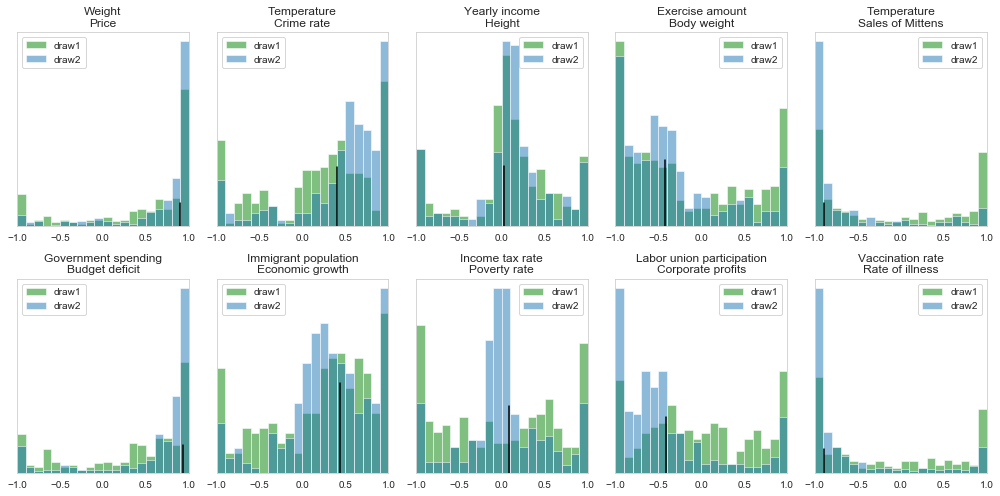

In [ ]:
fig, ax = plt.subplots(2, 5, figsize=(14,7))

for i in range(2):
    for j, vs in enumerate(var_sets_srted[i]):

        axi = ax[i][j]
       
        corr = sample_corr[vs]
        axi.plot([corr,corr], [0,18], '-', color='black')

        ss = df[(df.vars==vs) & (df.state=='draw1')]
        axi.hist(ss.belief.values, range=(-1,1), bins=20, alpha=.5, color='green', label='draw1')


        ss = df[(df.vars==vs) & (df.state=='draw2')]
        axi.hist(ss.belief.values, alpha=.5, bins=20, range=(-1,1), label='draw2')

        axi.set_yticks([])
        axi.set_xlim(-1,1)
        axi.set_title(varlabel(vs))
        axi.grid(None)
        
        axi.legend()
        
plt.tight_layout()
plt.show()
fig.savefig('results_figures/beliefs_by_varset.pdf', bbox_inches='tight')

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; u

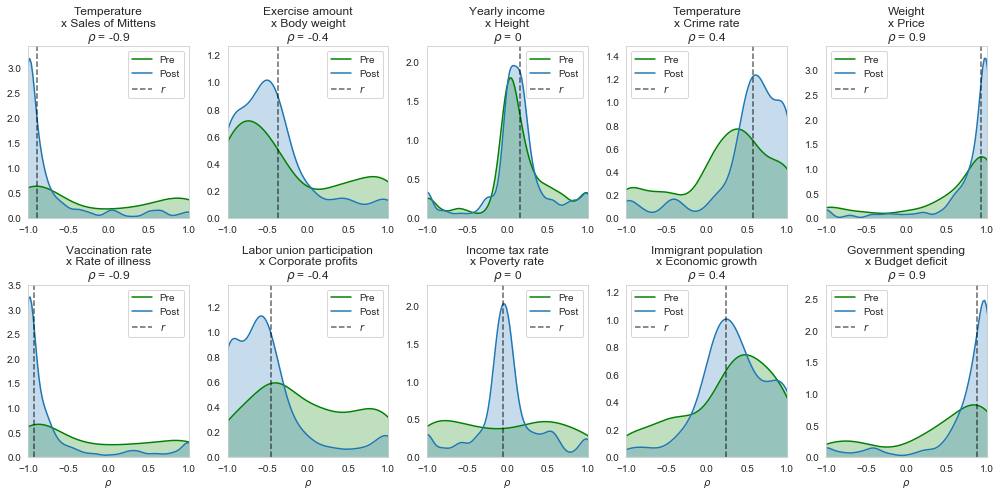

In [ ]:
fig, ax = plt.subplots(2, 5, figsize=(14,7))

for i in range(2):
    for j, vs in enumerate(var_sets_srted[i]):

        axi = ax[i][j]
       

        ss = aggdf[(aggdf.vars==vs)]

        p = sns.kdeplot(ss['prior_belief'], shade=True, ax=axi, label='Pre', color='green')
        p = sns.kdeplot(ss['post_belief'], shade=True, ax=axi, label='Post')
        
        ymax = p.get_yaxis().get_data_interval()[1]
        
        corr = sample_corr[vs]
        rho = pop_corr[vs]
        bsc = bs_corr[vs]['r']
        #axi.plot([corr,corr], [0,ymax+.25], '-', color='green', alpha=.6)
        axi.plot([bsc,bsc], [0,ymax+.25], '--', color='black', alpha=.6, label=r'$r$')
        #axi.plot([rho,rho], [0,ymax+.25], '--', color='red', alpha=.6)


        axi.set_xlim(-1,1)
        axi.set_ylim(0, ymax + .25)
        axi.set_title(varlabel_with_popcorr(vs))
        axi.grid(None)
        
        if i==1:
            axi.set_xlabel(r'$\rho$')
        
        axi.legend()
        
plt.tight_layout()
plt.show()
fig.savefig('results_figures/beliefs_by_varset_kdeplot.pdf', bbox_inches='tight')

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; u

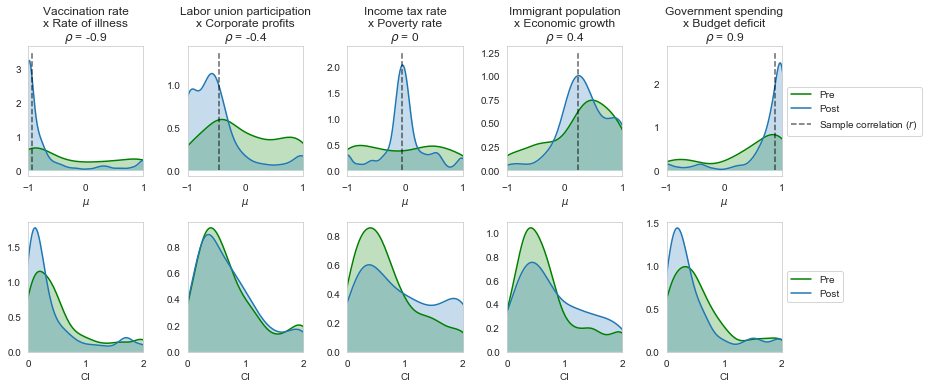

In [ ]:
fig, ax = plt.subplots(2, 5, figsize=(13,5.5))

for i in range(2):
    for j, vs in enumerate(var_sets_srted[1]):

        axi = ax[i][j]
       

        ss = aggdf[(aggdf.vars==vs)]

        if i == 0:
            p = sns.kdeplot(ss['prior_belief'], shade=True, ax=axi, label='Pre', color='green')
            p = sns.kdeplot(ss['post_belief'], shade=True, ax=axi, label='Post')
            ymax = p.get_yaxis().get_data_interval()[1]
    
            corr = sample_corr[vs]
            rho = pop_corr[vs]
            bsc = bs_corr[vs]['r']
            #axi.plot([corr,corr], [0,ymax+.25], '-', color='green', alpha=.6)
            axi.plot([bsc,bsc], [0,ymax+.25], '--', color='black', alpha=.6, label=r'Sample correlation ($r$)')
            #axi.plot([rho,rho], [0,ymax+.25], '--', color='red', alpha=.6)

            axi.set_xlim(-1,1)
            axi.set_title(varlabel_with_popcorr(vs))
            #axi.set_yticklabels([])
            
            #axi.set_ylim(0, 4)
    

        else:
            p = sns.kdeplot(ss['prior_uncertainty'], shade=True, ax=axi, label='Pre', color='green')
            p = sns.kdeplot(ss['post_uncertainty'], shade=True, ax=axi, label='Post')
            ymax = p.get_yaxis().get_data_interval()[1]

            axi.set_xlim(0,2)
            #axi.set_yticklabels([])


        #axi.set_ylim(0, ymax + .25)
        axi.grid(None)
        
        if i==0:
            axi.set_xlabel(r'$\mu$')
        else:
            axi.set_xlabel('CI')
        
        if j==4:
            axi.legend(loc='center left', bbox_to_anchor=(1,.5))
        else:
            axi.legend([], frameon=False)
        #axi.legend([], frameon=False)
        
# bb = (fig.subplotpars.left, fig.subplotpars.bottom - .25, 
#       fig.subplotpars.right-fig.subplotpars.left,.05)

# ax[0][0].legend(bbox_to_anchor=bb, mode="expand", loc="lower left",
#              ncol=5, borderaxespad=0., bbox_transform=fig.transFigure)

plt.tight_layout()
plt.show()
fig.savefig('results_figures/beliefs_and_uncertainty_by_varset_kdeplot.pdf', bbox_inches='tight')

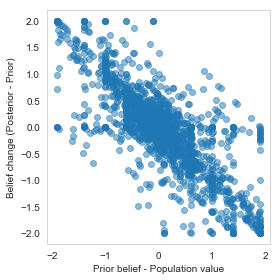

In [ ]:
fig, ax = plt.subplots(figsize=(4,4))
ax.plot(aggdf.prior_belief - aggdf.pop_corr,
         aggdf.post_belief - aggdf.prior_belief, 'o', alpha=.5)

ax.set_xlabel('Prior belief - Population value')
ax.set_ylabel('Belief change (Posterior - Prior)')
ax.grid(False)

plt.tight_layout()
plt.show()
fig.savefig('results_figures/beliefchange.pdf', bbox_inches='tight')

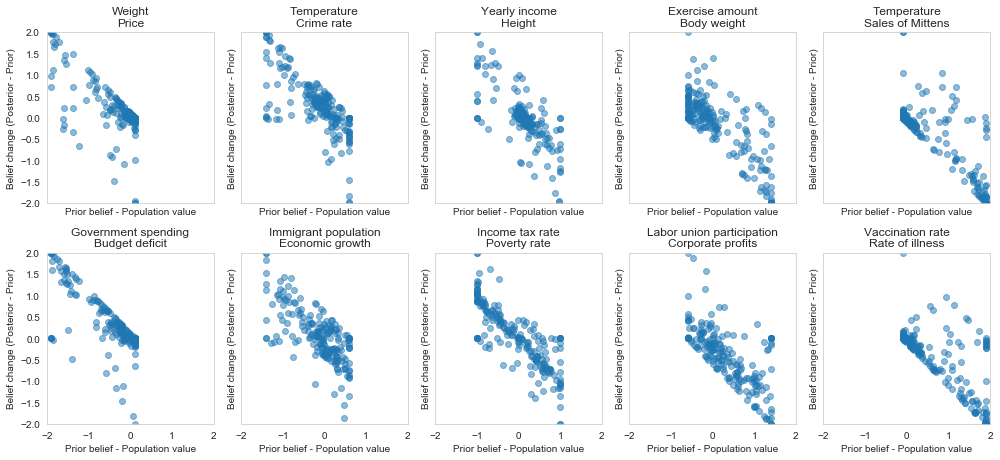

In [ ]:
fig, ax = plt.subplots(2, 5, figsize=(14,6.5), sharey=True, sharex=True)

for i in range(2):
    for j, vs in enumerate(var_sets_srted[i]):

        axi = ax[i][j]
       
        ss = aggdf[aggdf.vars==vs]

        axi.plot(ss.prior_belief - ss.pop_corr,
                 ss.post_belief - ss.prior_belief, 'o', alpha=.5)

        axi.set_xlabel('Prior belief - Population value')
        axi.set_ylabel('Belief change (Posterior - Prior)')


        #axi.set_yticks([])
        axi.set_xlim(-2,2)
        axi.set_ylim(-2,2)
        axi.set_title(varlabel(vs))
        axi.grid(False)
        
plt.tight_layout()
plt.show()
fig.savefig('results_figures/beliefchange_by_var.pdf', bbox_inches='tight')

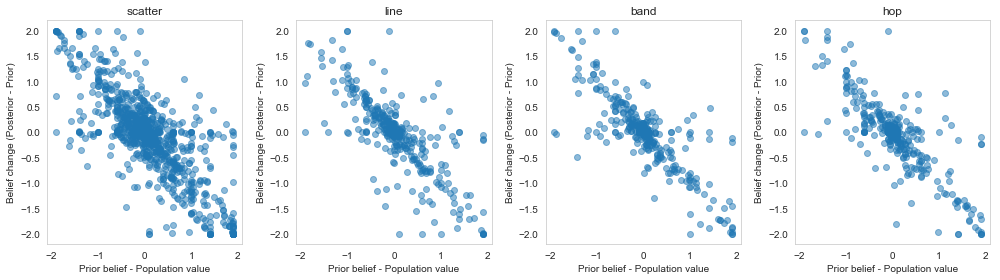

In [ ]:
fig, ax = plt.subplots(1, 4, figsize=(14,4))

for i, cond in enumerate(['scatter', 'line', 'band', 'hop']):

    axi = ax[i]
    
    ss = aggdf[aggdf.visGroup==cond]
    axi.plot(ss.prior_belief - ss.pop_corr,
             ss.post_belief - ss.prior_belief, 'o', alpha=.5)

    axi.set_xlabel('Prior belief - Population value')
    axi.set_ylabel('Belief change (Posterior - Prior)')
    axi.grid(False)
    axi.set_title(cond)

plt.tight_layout()
plt.show()
fig.savefig('results_figures/beliefchange_x_cond.pdf', bbox_inches='tight')

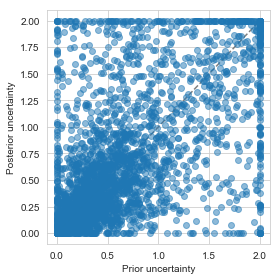

In [ ]:
fig, ax = plt.subplots(figsize=(4,4))


ax.plot([0, 2], [0, 2], '--', color='gray')

ax.plot(aggdf.prior_uncertainty,
        aggdf.post_uncertainty, 'o', alpha=.5)

ax.set_xlabel('Prior uncertainty')
ax.set_ylabel('Posterior uncertainty')

plt.tight_layout()
plt.show()

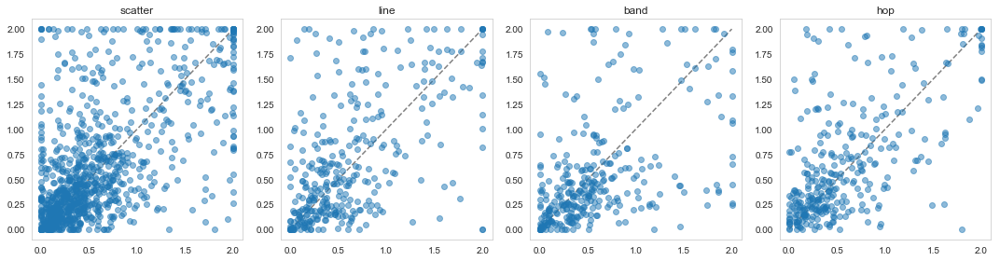

In [ ]:
fig, ax = plt.subplots(1, 4, figsize=(15,4))

for i, cond in enumerate(['scatter', 'line', 'band', 'hop']):

    axi = ax[i]
    
    axi.plot([0, 2], [0, 2], '--', color='gray')

    
    ss = aggdf[aggdf.visGroup==cond]

    axi.plot(ss.prior_uncertainty,
            ss.post_uncertainty, 'o', alpha=.5)


    #axi.set_xlabel('Belief change (Predicted)')
    #axi.set_ylabel('Belief change (Observed)')
    axi.grid(False)
    axi.set_title(cond)
    #axi.set_xlim(-2.05, 2.05)
    #axi.set_ylim(-2.05, 2.05)

plt.tight_layout()
plt.show()
#fig.savefig('results_figures/beliefchange_x_cond.pdf', bbox_inches='tight')

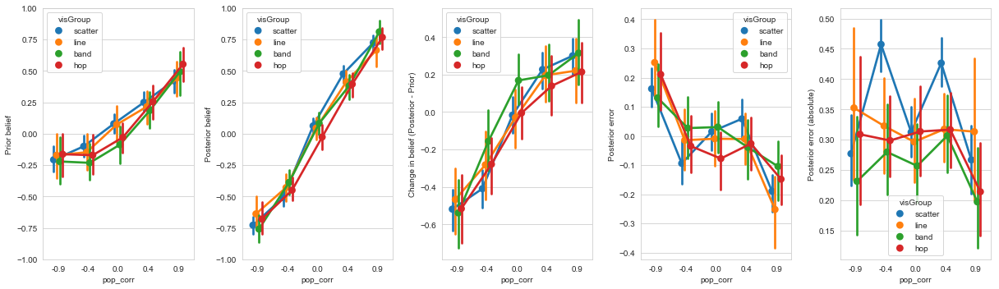

In [ ]:
fig, ax = plt.subplots(1, 5, figsize=(17,5))

# sns.stripplot(data=aggdf, x='visGroup', y='diff_uncertainty',
#               order=['scatter', 'line', 'band', 'hop'],
#               color='gray', alpha=.3,
#                 ax=ax)

axi = ax[0]
sns.pointplot(data=aggdf, x='pop_corr', y='prior_belief', hue='visGroup',
              hue_order=['scatter', 'line', 'band', 'hop'],
              dodge=.3,
              ax=axi)
axi.set_ylabel('Prior belief')
axi.set_ylim(-1,1)

axi = ax[1]
sns.pointplot(data=aggdf, x='pop_corr', y='post_belief', hue='visGroup',
              hue_order=['scatter', 'line', 'band', 'hop'],
              dodge=.3,
              ax=axi)
axi.set_ylabel('Posterior belief')
axi.set_ylim(-1,1)

axi = ax[2]
sns.pointplot(data=aggdf, x='pop_corr', y='diff_belief', hue='visGroup',
              hue_order=['scatter', 'line', 'band', 'hop'],
              dodge=.3,
              ax=axi)

axi.set_ylabel('Change in belief (Posterior - Prior)')



axi = ax[3]
sns.pointplot(data=aggdf, x='pop_corr', y='post_error', hue='visGroup',
              hue_order=['scatter', 'line', 'band', 'hop'],
              dodge=.3,
              ax=axi)
axi.set_ylabel('Posterior error')

axi = ax[4]
sns.pointplot(data=aggdf, x='pop_corr', y='post_error_abs', hue='visGroup',
              hue_order=['scatter', 'line', 'band', 'hop'],
              dodge=.3,
              ax=axi)
axi.set_ylabel('Posterior error (absolute)')




plt.tight_layout()
plt.show()
fig.savefig('results_figures/belief_by_condition.pdf', bbox_inches='tight')

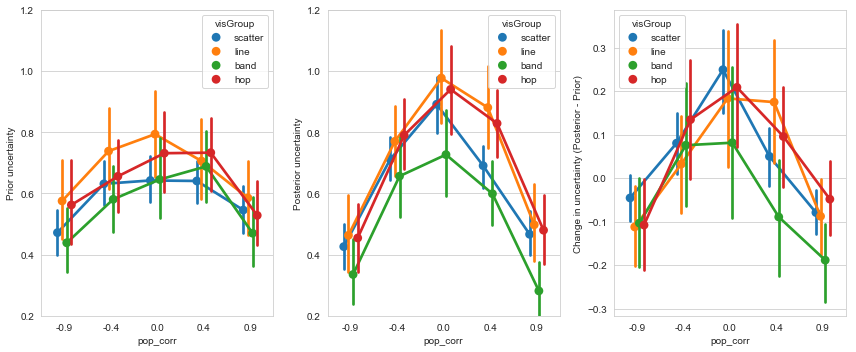

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(12,5))


axi = ax[0]
sns.pointplot(data=aggdf, x='pop_corr', y='prior_uncertainty', hue='visGroup',
              hue_order=['scatter', 'line', 'band', 'hop'],
              dodge=.3,
              ax=axi)
axi.set_ylabel('Prior uncertainty')
axi.set_ylim(0.2, 1.2)

axi = ax[1]
sns.pointplot(data=aggdf, x='pop_corr', y='post_uncertainty', hue='visGroup',
              hue_order=['scatter', 'line', 'band', 'hop'],
              dodge=.3,
              ax=axi)
axi.set_ylabel('Posterior uncertainty')
axi.set_ylim(0.2, 1.2)

axi = ax[2]
sns.pointplot(data=aggdf, x='pop_corr', y='diff_uncertainty', hue='visGroup',
              hue_order=['scatter', 'line', 'band', 'hop'],
              dodge=.3,
              ax=axi)
axi.set_ylabel('Change in uncertainty (Posterior - Prior)')

plt.tight_layout()
plt.show()
fig.savefig('results_figures/uncertainty_by_condition.pdf', bbox_inches='tight')

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; u

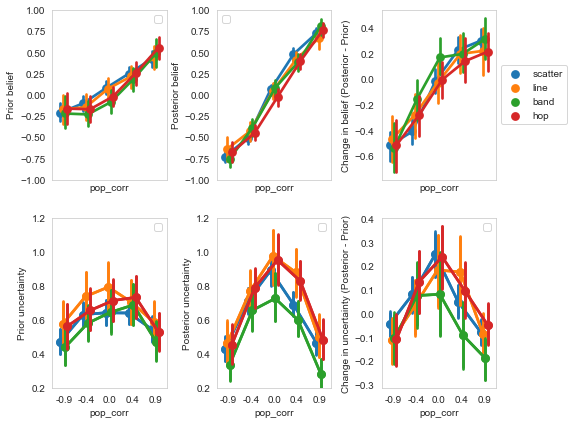

In [ ]:
fig, ax = plt.subplots(2, 3, figsize=(8,6), sharex=True)

axi = ax[0][0]
sns.pointplot(data=aggdf, x='pop_corr', y='prior_belief', hue='visGroup',
              hue_order=['scatter', 'line', 'band', 'hop'],
              dodge=.3,
              ax=axi)
axi.set_ylabel('Prior belief')
axi.set_ylim(-1,1)

axi = ax[0][1]
sns.pointplot(data=aggdf, x='pop_corr', y='post_belief', hue='visGroup',
              hue_order=['scatter', 'line', 'band', 'hop'],
              dodge=.3,
              ax=axi)
axi.set_ylabel('Posterior belief')
axi.set_ylim(-1,1)

axi = ax[0][2]
sns.pointplot(data=aggdf, x='pop_corr', y='diff_belief', hue='visGroup',
              hue_order=['scatter', 'line', 'band', 'hop'],
              dodge=.3,
              ax=axi)

axi.set_ylabel('Change in belief (Posterior - Prior)')



axi = ax[1][0]
sns.pointplot(data=aggdf, x='pop_corr', y='prior_uncertainty', hue='visGroup',
              hue_order=['scatter', 'line', 'band', 'hop'],
              dodge=.3,
              ax=axi)
axi.set_ylabel('Prior uncertainty')
axi.set_ylim(0.2, 1.2)

axi = ax[1][1]
sns.pointplot(data=aggdf, x='pop_corr', y='post_uncertainty', hue='visGroup',
              hue_order=['scatter', 'line', 'band', 'hop'],
              dodge=.3,
              ax=axi)
axi.set_ylabel('Posterior uncertainty')
axi.set_ylim(0.2, 1.2)

axi = ax[1][2]
sns.pointplot(data=aggdf, x='pop_corr', y='diff_uncertainty', hue='visGroup',
              hue_order=['scatter', 'line', 'band', 'hop'],
              dodge=.3,
              ax=axi)
axi.set_ylabel('Change in uncertainty (Posterior - Prior)')


axi = ax[1][0]
sns.pointplot(data=aggdf, x='pop_corr', y='prior_uncertainty', hue='visGroup',
              hue_order=['scatter', 'line', 'band', 'hop'],
              dodge=.3,
              ax=axi)
axi.set_ylabel('Prior uncertainty')
axi.set_ylim(0.2, 1.2)

axi = ax[1][1]
sns.pointplot(data=aggdf, x='pop_corr', y='post_uncertainty', hue='visGroup',
              hue_order=['scatter', 'line', 'band', 'hop'],
              dodge=.3,
              ax=axi)
axi.set_ylabel('Posterior uncertainty')
axi.set_ylim(0.2, 1.2)

axi = ax[1][2]
sns.pointplot(data=aggdf, x='pop_corr', y='diff_uncertainty', hue='visGroup',
              hue_order=['scatter', 'line', 'band', 'hop'],
              dodge=.3,
              ax=axi)
axi.set_ylabel('Change in uncertainty (Posterior - Prior)')


for axi in ax.ravel():
    axi.legend([])
    axi.grid(False)

    
ax[0][2].legend(loc='center left', bbox_to_anchor=(1,.5))

plt.tight_layout()
plt.show()
fig.savefig('results_figures/results_by_condition.pdf', bbox_inches='tight')

### Posterior accuracy

In [ ]:
r = list(aggdf.sample_corr.unique())
r.sort()

In [ ]:
mns = aggdf.groupby('sample_corr').apply(lambda d: pd.Series({'mn': np.median(d.post_belief)})).reset_index()

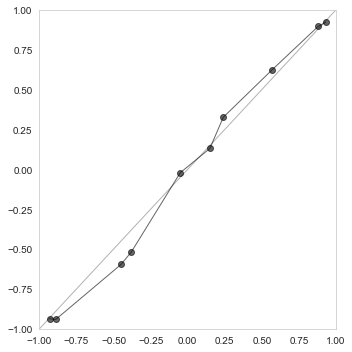

In [ ]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot([-1,1], [-1,1], '-', color='gray', linewidth=1, alpha=.6)
ax.plot(mns.sample_corr, mns.mn, 'o-', color='black', linewidth=1, alpha=.6)
#sns.pointplot(x='sample_corr', y='sample_corr', data=aggdf, estimator=np.median, ax=ax, color='black')
#sns.pointplot(x='sample_corr', y='post_belief', data=aggdf, estimator=np.median, ax=ax, color='black')
#sns.lineplot(x='sample_corr', y='sample_corr', data=aggdf, ax=ax)
ax.set_xlim(-1,1)
ax.set_ylim(-1,1)
ax.grid(None)
plt.tight_layout()
plt.show()

In [ ]:
aggdf.head()

,usertoken,visGroup,trial_duration,vars,varIndex,prior_belief,prior_lwr,prior_upr,post_belief,post_lwr,...,diff_uncertainty,pop_corr,sample_corr,post_error,post_error_abs,prior_uncertainty,post_uncertainty,prior_sd,post_sd,exclude
0,08zKHo8E,scatter,12198,Exercise amount_Body weight,2,-0.278002,-0.558787,0.002783,-0.462459,-0.661551,...,-0.16339,-0.4,-0.38,-0.082459,0.082459,0.561570,0.398183,0.140392,0.099546,0
1,08zKHo8E,band,14627,Government spending_Budget deficit,7,0.610893,0.352658,0.869128,1.000000,0.949413,...,-0.46588,0.9,0.88,0.120000,0.120000,0.516470,0.050587,0.129117,0.025293,0
2,08zKHo8E,band,6970,Immigrant population_Economic growth,9,0.413527,0.162274,0.664780,0.146512,-0.026893,...,-0.15570,0.4,0.24,-0.093488,0.093488,0.502506,0.346810,0.125627,0.086703,0
3,08zKHo8E,band,17069,Income tax rate_Poverty rate,8,-0.796950,-0.940931,-0.652969,-0.054532,-0.292996,...,0.18897,0.0,-0.05,-0.004532,0.004532,0.287962,0.476929,0.071991,0.119232,0
4,08zKHo8E,band,14045,Labor union participation_Corporate profits,5,-0.577601,-0.731460,-0.423742,-0.668209,-0.737718,...,-0.16870,-0.4,-0.45,-0.218209,0.218209,0.307718,0.139019,0.076930,0.034755,0


In [ ]:
mns = aggdf.groupby(['sample_corr', 'visGroup']).apply(lambda d: pd.Series({'mn': np.median(d.post_belief)})).reset_index()

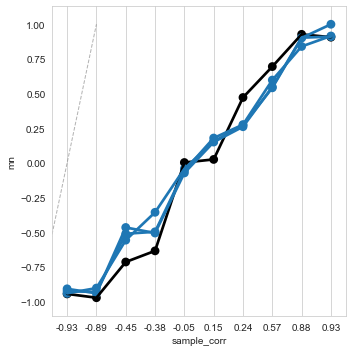

In [ ]:
fig, ax = plt.subplots(figsize=(5,5))
ax.plot([-1,1], [-1,1], '--', color='gray', linewidth=1, alpha=.6)

ss = mns[mns.visGroup=='scatter']
#ax.plot(ss.sample_corr, ss.mn, 'o-', markersize=4, color='black', linewidth=1, alpha=.6, label='scatter')
sns.pointplot(ss.sample_corr, ss.mn, color='black')

ss = mns[mns.visGroup=='line']
#ax.plot(ss.sample_corr, ss.mn, 'o-', markersize=4, color='blue', linewidth=1, alpha=.6, label='line')
sns.pointplot(ss.sample_corr, ss.mn)


ss = mns[mns.visGroup=='band']
#ax.plot(ss.sample_corr, ss.mn, 'o-', markersize=4, color='green', linewidth=1, alpha=.6, label='band')
sns.pointplot(ss.sample_corr, ss.mn)



ss = mns[mns.visGroup=='hop']
#ax.plot(ss.sample_corr, ss.mn, 'o-', markersize=4, color='red', linewidth=1, alpha=.6, label='hop')
sns.pointplot(ss.sample_corr, ss.mn)


#ax.set_xlim(-1.05,1.05)
#ax.set_ylim(-1.05,1.05)
#ax.set_xlabel('Sample correlation')
#ax.set_ylabel('Median posterior belief')
ax.grid(None)
#ax.legend()
plt.tight_layout()
plt.show()
#fig.savefig('results_figures/posterior_error.pdf', bbox_inches='tight')

# Model

In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
import sys
sys.path.append("../../../")
from vbrmodel import vbrmodel
import pymc3 as pm
#import theano.tensor as T
#from scipy.stats import beta
#from scipy.stats import pearsonr

## Uniform prior model

In [ ]:
# estimate the uniform baseline model for each dataset
fname = f'data/model_predictions/model_uniform.pkl'
force = False
if not os.path.exists(fname) or force:
    predictions_uniform = {}
    for vs in var_sets:

        dat = pd.DataFrame(datasets[vs]['data']['data']).values

        # get predicted posterior
        tr = vbrmodel.estimate_uniform(dat)

        predictions_uniform[vs] = tr['r']

    pickle.dump(predictions_uniform, open(fname, 'wb'))
else:
    predictions_uniform = pickle.load(open(fname, "rb"))
    
arr = []
for vs in var_sets:
    
    post_mu_predicted = predictions_uniform[vs].mean()
    hpd = pm.stats.hpd(predictions_uniform[vs])
    
    post_CI_predicted = np.diff(hpd)[0]
    arr.append([vs, post_mu_predicted, hpd[0], hpd[1], post_CI_predicted])
    
uniform_model_pred = pd.DataFrame(arr, columns=['vars', 'post_mu_predicted', 'hpd_lower', 'hpd_upper', 'post_hpd_predicted'])

## Elicited prior model

In [ ]:
def process(row):
    
    vs = row['vars']
    dat = pd.DataFrame(datasets[vs]['data']['data']).values

    # get predicted posterior
    tr = vbrmodel.estimate(dat, normal_prior=row[['prior_belief', 'prior_sd']].values)

    return {'usertoken': row['usertoken'],
            'vars': vs,
            'pred': tr['r']}

In [ ]:
force = False
for i, grp in aggdf.groupby('usertoken'):
    print(i)
    sid = grp.usertoken.values[0]
    fname = f'data/model_predictions/model_{sid}.pkl'
    if not os.path.exists(fname) or force:
        try:
            predictions = {}
            for j, row in grp.iterrows():
                predictions[(sid, row['vars'])] = process(row)
            pickle.dump(predictions, open(fname, 'wb'))
        except:
            print('failed for ', sid)

08zKHo8E
09rIYGes
0FGSpKJI
0RciEixE
0Xp9yMo0
0ZjAFmDL
1TXFgBI8
2l9rp9wj
2tJSMLu0
37nszq7b
3ZnVe88s
3hX0DGhV
3sw8hFsd
3v3bE8jv
4IdDTplo
4bxrWA0q
4qCMLPwT
5Mq9o7aU
5PVhrDsQ
5nKCHzwi
5vIwcLnU
5vtqm5c7
6VqNTTBM
7GRHAuPH
7oe2yDye
8Fvgb9jl
8RU3nE0z
8k57mZts
8nQE5rIn
9MtrIqGc
9bvLEpaf
9oPCtODQ
9qV8Po5e
9wrlrgQT
A5E4ZPJQ
A61QXn4N
ANhIkskc
AYrVj3Qr
AdKOvL7Q
Ak3Z4zD7
Aono0iKM
AuVxWJUK
BEECZOa3
CD9szYJT
CEHuBY2N
CdSQ1sQn
DBfvFSca
DEPdjqVT
DL5Ul12I
E4fsaAML
EDtktLDe
EjAzA4we
EvBDWuAA
FI4uLqoI
FKibMthV
FQ9V91eN
FXCVfGjH
GO4G3Cew
GU5yyXZ0
GaE23ZWa
GhCaq6sR
GnONns6J
GqyTaUqS
HKhosEJP
HYOfFQnN
HwkNUz4u
ILkZFwS3
IN87libS
IcJPoFtL
IeYPjQzO
IfUGKjPy
J6KK8mVp
JdnFqZsu
JlYmc9uv
JlbWiHDA
JrOLAkZM
LFUXivW2
LJuOFjOl
LZ7fYiog
MLId7pow
MW6ysHY2
MfeCRMwx
Mg6muuFj
MhtOLph6
MtIvkjbC
N50cmzh5
NMmw2lKw
NO3T9tQi
NkhMDXuZ
NsC1gIQy
NsntFTCj
O6kjKgbS
OUwAESlT
OWM270yV
OZ4xrqij
Oqvq32KT
P4jFyMjk
PEdPlwmF
PPevttF7
PQHjeZxJ
PUhRawzc
PtHTzDOk
Q77i0B3m
R6brT0pj
RU1EoMAG
RYPaQ9hf
SFBb1tGj
STfgMcs2
Sx0VvP9q
SzLw9dcK
TWUw7w1D
T

In [ ]:
# load model predictions
predictions = {}
for sid in aggdf.usertoken.unique():
    
    fname = f'data/model_predictions/model_{sid}.pkl'
    if os.path.exists(fname):
        
        pred = pickle.load(open(fname, "rb"))
        for k in pred:
            predictions[k] = pred[k]

In [ ]:
aggdf['post_mu_predicted'] = aggdf.apply(lambda d: pd.Series({'post_mu_predicted': predictions[(d.usertoken, d.vars)]['pred'].mean()}), axis=1)
aggdf['post_CI_predicted'] = aggdf.apply(lambda d: pd.Series({'post_CI_predicted': np.diff(pm.stats.hpd(predictions[(d.usertoken, d.vars)]['pred']))[0]}), axis=1)

aggdf['diff_uncertainty_predicted'] = aggdf['post_CI_predicted'] - aggdf['prior_uncertainty']
aggdf['belief_change_predicted'] = aggdf['post_mu_predicted'] - aggdf['prior_belief']
aggdf['belief_change'] = aggdf['post_belief'] - aggdf['prior_belief']

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
No handles with labels found to put in legend.


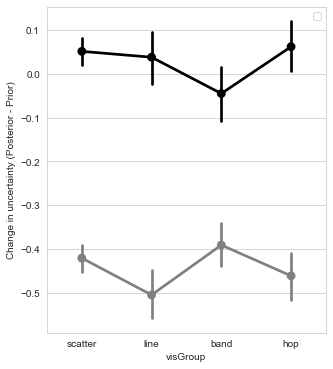

In [ ]:
fig, ax = plt.subplots(figsize=(5,6))

# sns.stripplot(data=aggdf, x='visGroup', y='diff_uncertainty',
#               order=['scatter', 'line', 'band', 'hop'],
#               color='gray', alpha=.3,
#                 ax=ax)

sns.pointplot(data=aggdf, x='visGroup', y='diff_uncertainty', 
              order=['scatter', 'line', 'band', 'hop'],
              color='black',
              ax=ax)

sns.pointplot(data=aggdf, x='visGroup', y='diff_uncertainty_predicted', 
              order=['scatter', 'line', 'band', 'hop'],
              color='gray',
              ax=ax)

ax.set_ylabel('Change in uncertainty (Posterior - Prior)')
ax.legend()

plt.show()
#fig.savefig('results_figures/uncertaintychange_by_condition.pdf', bbox_inches='tight')

## Aggregate

In [ ]:
dx = .1
bins = np.arange(-1, 1 + dx, dx)

In [ ]:
# get aggregate prediction based on Informed-Prior
composite_predicted_post = {}

for vs in var_sets:

    arr = []
    for sid in aggdf.usertoken.unique():
        k = (sid, vs)
        if k in predictions:
            hist = np.histogram(predictions[k]['pred'], bins=bins)[0]
            hist = hist/hist.sum()
            arr.append(hist)
    composite_predicted_post[vs] = np.array(arr).mean(axis=0)
#np.round(composite_predicted_post[vs], 3)

In [ ]:
# aggregate elicited posteriors
composite_post = {}
for vs in var_sets:
    
    ss = aggdf[aggdf.vars==vs]
    arr = []
    for i, row in ss.iterrows():
        normal_post = row[['post_belief', 'post_sd']].values
        cdf = norm.cdf(bins, normal_post[0], normal_post[1])
        post = np.diff(cdf)
        post = post/post.sum()
        arr.append(post)
    composite_post[vs] = np.array(arr).mean(0)
    
    
# aggregated priors
composite_prior = {}
for vs in var_sets:
    
    ss = aggdf[aggdf.vars==vs]
    arr = []
    for i, row in ss.iterrows():
        normal_post = row[['prior_belief', 'prior_sd']].values
        cdf = norm.cdf(bins, normal_post[0], normal_post[1])
        post = np.diff(cdf)
        post = post/post.sum()
        arr.append(post)
    composite_prior[vs] = np.array(arr).mean(0)

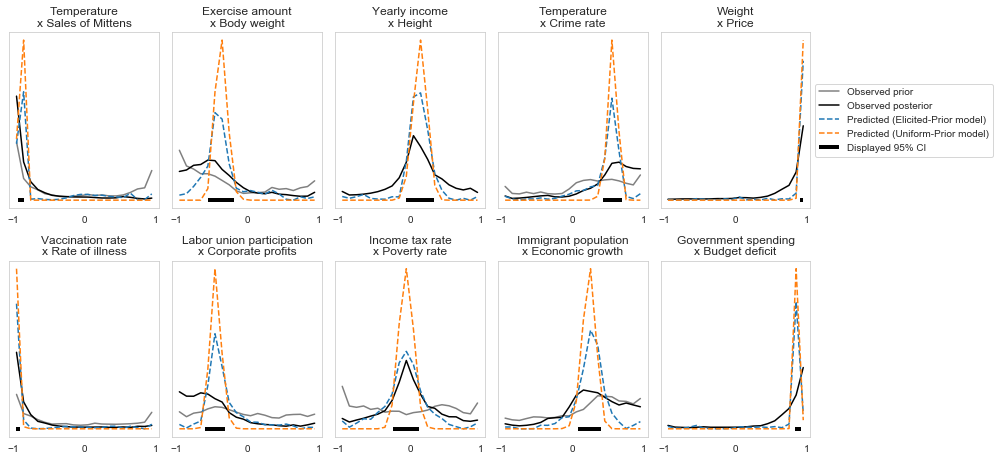

In [ ]:
fig, ax = plt.subplots(2, 5, figsize=(14,6.5))
xs = bins[:-1] + dx/2


for i in range(2):
    for j, vs in enumerate(var_sets_srted[i]):

        axi = ax[i][j]
        
        
        # observed priors
        comp_prior = composite_prior[vs]
        comp_prior = comp_prior/comp_prior.sum()
        axi.plot(xs, comp_prior, '-',
                color='gray', label='Observed prior')


        
        # observed posteriors
        comp_post = composite_post[vs]
        comp_post = comp_post/comp_post.sum()
        axi.plot(xs, comp_post,
                color='black', label='Observed posterior')


        # Elicited-Prior
        comp_post_pred = composite_predicted_post[vs]
        axi.plot(xs, comp_post_pred, '--',
                 label='Predicted (Elicited-Prior model)')

        # Uniform-Prior
        unif_pred = predictions_uniform[vs]
        hist = np.histogram(unif_pred, bins=bins)
        axi.plot(xs, hist[0]/hist[0].sum(), '--',
                 label='Predicted (Uniform-Prior model)')

        bs_i = bs_corr[vs]
        #np.max([bs_i['upper'] - bs_i['r'], bs_i['r'] - bs_i['lower']])/2
        axi.plot([bs_i['lower'], bs_i['upper']], [0, 0], '-', 
                 color='black', linewidth=4, solid_capstyle='butt', label='Displayed 95% CI')
        
        
        axi.grid(False)
        if i==0 and j==4:
            axi.legend(loc='center left', bbox_to_anchor=(1, .5))

#         axi.set_xlabel('Error (Prior)')
#         axi.set_ylabel('Belief change')

#         axi.grid(False)
        axi.set_yticks([])
        axi.set_title(varlabel(vs))
        axi.set_xlim(-1.05, 1.05)
#         axi.set_ylim(-2.05, 2.05)

        
plt.tight_layout()
plt.show()
fig.savefig('results_figures/model_aggregate.pdf', bbox_inches='tight')

## Aggregate by condition

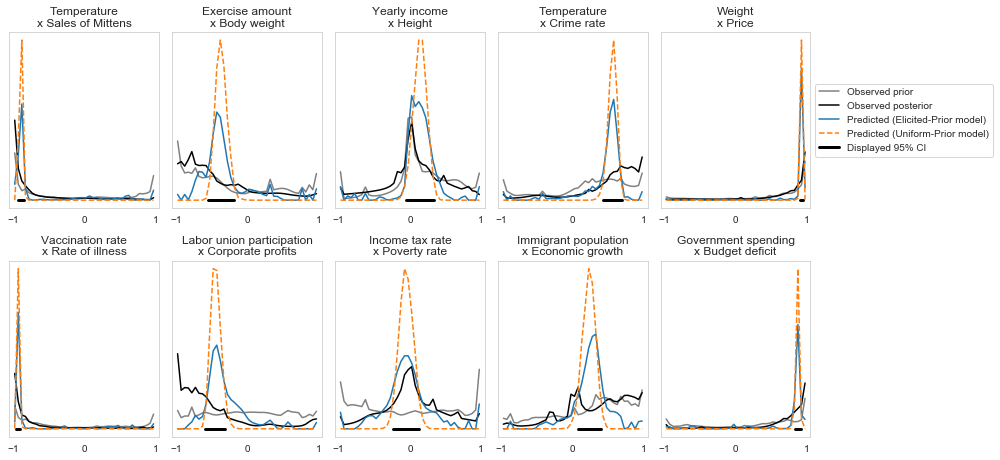

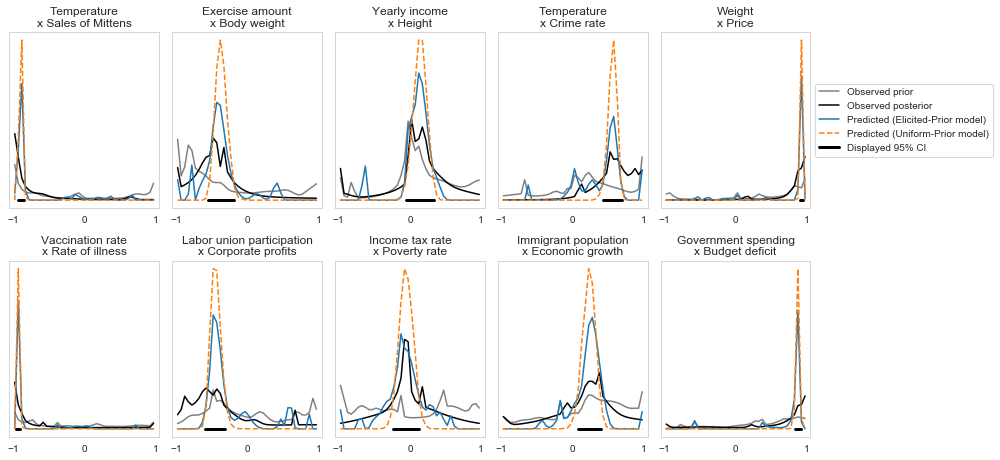

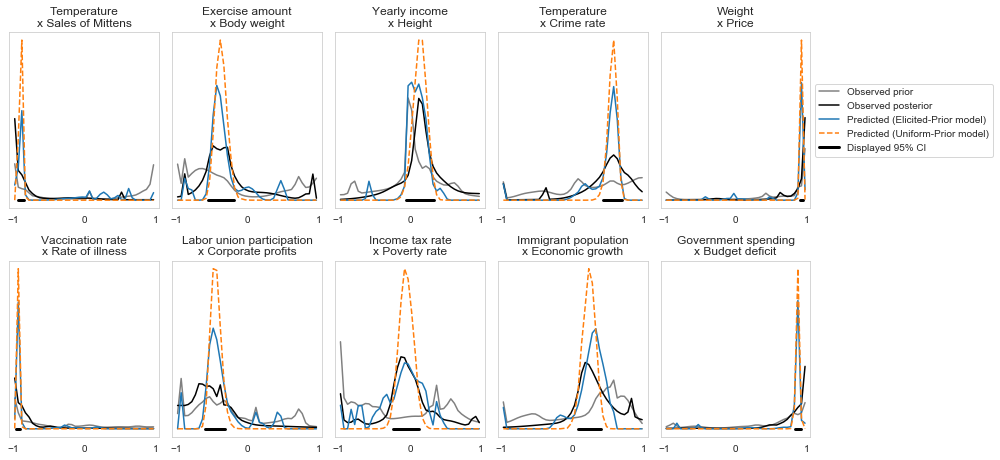

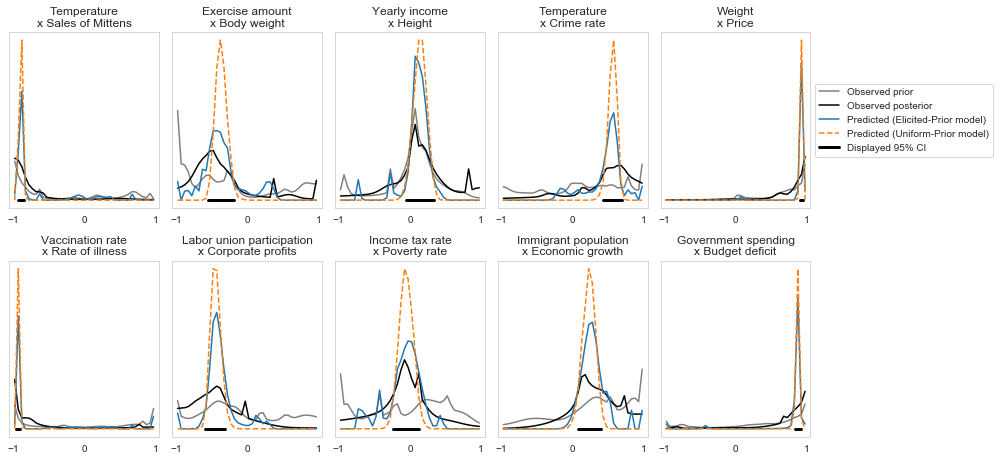

In [ ]:
dx = .05
bins = np.arange(-1, 1 + dx, dx)

klarr = []
for visGroup in ['scatter', 'line', 'band', 'hop']:
    
    ss = aggdf[aggdf.visGroup==visGroup]
    
    
    # aggregate elicited priors
    composite_prior = {}
    composite_prior_mean = {vs: [] for vs in var_sets}
    #composite_prior_sd = {vs: [] for vs in var_sets}
    arr = {vs: [] for vs in var_sets}
    for i, row in ss.iterrows():
        sid = row['usertoken']
        vs = row['vars']

        normal_prior = row[['prior_belief', 'prior_sd']].values
        if not np.isnan(normal_prior[0]) and not np.isnan(normal_prior[1]):
            cdf = norm.cdf(bins, normal_prior[0], normal_prior[1])
            prior = np.diff(cdf)
            prior = prior/prior.sum()
            
            #print(bins)
            #print(cdf)
            #print(prior)
            arr[vs].append(prior)
            
            
            #print(np.dot(prior, bins[:-1] + dx/2))
            #print(dummy)
            
            composite_prior_mean[vs].append(np.dot(prior, bins[:-1] + dx/2))
            
            #sd = np.sqrt(truncnorm.stats(-1, 1, loc=normal_prior[0], scale=normal_prior[1], moments='v'))

    

    for vs in var_sets:
        composite_prior[vs] = np.array(arr[vs]).mean(0)
        #composite_prior_mean[vs] = ss[ss.vars==vs].prior_belief.mean()
        composite_prior_mean[vs] = np.mean(composite_prior_mean[vs])
    
    # aggregate elicited posteriors
    composite_post = {}
    #composite_mean = {}
    composite_post_mean = {vs: [] for vs in var_sets}


    arr = {vs: [] for vs in var_sets}
    for i, row in ss.iterrows():
        sid = row['usertoken']
        vs = row['vars']

        normal_post = row[['post_belief', 'post_sd']].values
        if not np.isnan(normal_post[0]) and not np.isnan(normal_post[1]):
            cdf = norm.cdf(bins, normal_post[0], normal_post[1])
            post = np.diff(cdf)
            post = post/post.sum()
            arr[vs].append(post)
            composite_post_mean[vs].append(np.dot(post, bins[:-1]+dx/2))


    for vs in var_sets:
        composite_post[vs] = np.array(arr[vs]).mean(0)
        #composite_mean[vs] = ss[ss.vars==vs].post_belief.mean()
        composite_post_mean[vs] = np.mean(composite_post_mean[vs])


    # get aggregate prediction for Elicited-Prior
    composite_predicted_post = {}

    arr = {vs: [] for vs in var_sets}
    composite_predicted_mn = {vs: [] for vs in var_sets}
    for i, row in ss.iterrows():
        sid = row['usertoken']
        vs = row['vars']
        k = (sid, vs)
        if k in predictions:
            hist = np.histogram(predictions[k]['pred'], bins=bins)
            arr[vs].append(hist)
            composite_predicted_mn[vs].append(predictions[k]['pred'].mean())

    for vs in var_sets:
        composite_predicted_post[vs] = np.array(arr[vs]).mean(axis=0)
        composite_predicted_mn[vs] = np.mean(composite_predicted_mn[vs])

        

    fig, ax = plt.subplots(2, 5, figsize=(14,6.5))
    xs = bins[:-1] + dx/2


    for i in range(2):
        for j, vs in enumerate(var_sets_srted[i]):

            axi = ax[i][j]

            comp_prior = composite_prior[vs]
            comp_prior = comp_prior/comp_prior.sum()
            axi.plot(xs, comp_prior,
                    color='gray', label='Observed prior')


            comp_post = composite_post[vs]
            comp_post = comp_post/comp_post.sum()
            axi.plot(xs, comp_post,
                    color='black', label='Observed posterior')


            comp_post_pred = composite_predicted_post[vs][0]
            comp_post_pred = comp_post_pred/comp_post_pred.sum()
            axi.plot(xs, comp_post_pred, '-',
                     label='Predicted (Elicited-Prior model)')


            unif_pred = predictions_uniform[vs]
            hist = np.histogram(unif_pred, bins=bins)[0]
            hist = hist/hist.sum()
            axi.plot(xs, hist, '--',
                     label='Predicted (Uniform-Prior model)')

            comp_post = np.clip(comp_post, 1e-4, 1-1e-4)
            comp_post_pred = np.clip(comp_post_pred, 1e-4, 1-1e-4)
            hist = np.clip(hist, 1e-4, 1-1e-4)
            
            klarr.append([visGroup, vs, pop_corr[vs], sample_corr[vs],
                          'prior', np.abs(composite_post_mean[vs] - composite_prior_mean[vs]),
                          entropy(comp_post, comp_prior)])

            klarr.append([visGroup, vs, pop_corr[vs], sample_corr[vs],
                          'elicited-prior', np.abs(composite_post_mean[vs] - composite_predicted_mn[vs]),
                          entropy(comp_post, comp_post_pred)])
            klarr.append([visGroup, vs, pop_corr[vs], sample_corr[vs],
                          'uniform-prior', np.abs(composite_post_mean[vs] - predictions_uniform[vs].mean()),
                          entropy(comp_post, hist)])
            
            
            bs_i = bs_corr[vs]
            axi.plot([bs_i['lower'], bs_i['upper']], [0, 0], '-', 
                     color='black', linewidth=3, label='Displayed 95% CI')


            axi.grid(False)
            if i==0 and j==4:
                axi.legend(loc='center left', bbox_to_anchor=(1, .5))

            axi.set_yticks([])
            axi.set_title(varlabel(vs))
            axi.set_xlim(-1.05, 1.05)


    plt.tight_layout()
    plt.show()
    fig.savefig(f'results_figures/model_aggregate_{visGroup}.pdf', bbox_inches='tight')

In [ ]:
kldf = pd.DataFrame(klarr, columns=['visGroup', 'vars', 'pop_corr', 'sample_corr', 'model', 'abs_err', 'kl'])
kldf['log_kl'] = np.log(np.clip(kldf.kl, 1e-4, None))

In [ ]:
kldf.to_csv('data_proc/modeldata_aggregate.csv')

In [ ]:
agg = kldf.groupby(['visGroup', 'pop_corr', 'model']).agg(np.mean).reset_index()

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


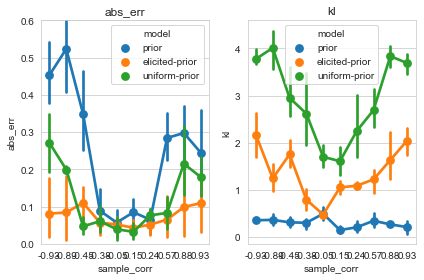

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(6, 4))

for i, outcome in enumerate(['abs_err', 'kl']):
    axi = ax[i]

    sns.pointplot(data=kldf, x='sample_corr', y=outcome, hue='model', ax=axi,
                  hue_order=['prior', 'elicited-prior', 'uniform-prior'])
    #sns.pointplot(data=agg, x='pop_corr', y=outcome, hue='model', ax=axi)


    #sns.regplot(data=kldf, x='sample_corr', y=outcome, hue='model', order=2, ax=axi)
    
    axi.set_title(outcome)

    if outcome is 'abs_err':
        axi.set_ylim(0, .6)
    #else:
    #    axi.set_ylim(0, 4.5)

plt.tight_layout()
plt.show()
#fig.savefig('results_figures/models_aggregate.pdf', bbox_inches='tight')

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


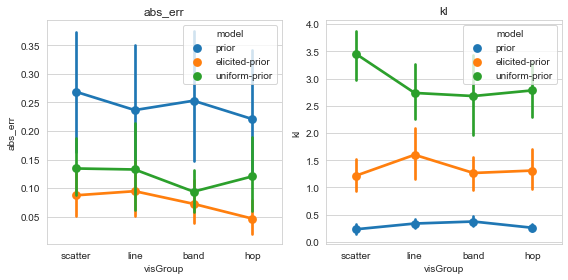

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(8, 4))

for i, outcome in enumerate(['abs_err', 'kl']):
    axi = ax[i]

    sns.pointplot(data=kldf, x='visGroup', y=outcome, hue='model', 
                  order=['scatter', 'line', 'band', 'hop'],
                  hue_order=['prior', 'elicited-prior', 'uniform-prior'],
                  ax=axi)

    axi.set_title(outcome)

    #if outcome is 'mae':
    #    axi.set_ylim(0, .6)
    #else:
    #    axi.set_ylim(0, 4.5)

plt.tight_layout()
plt.show()
#fig.savefig('results_figures/models_individual_by_model.pdf', bbox_inches='tight')

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; u

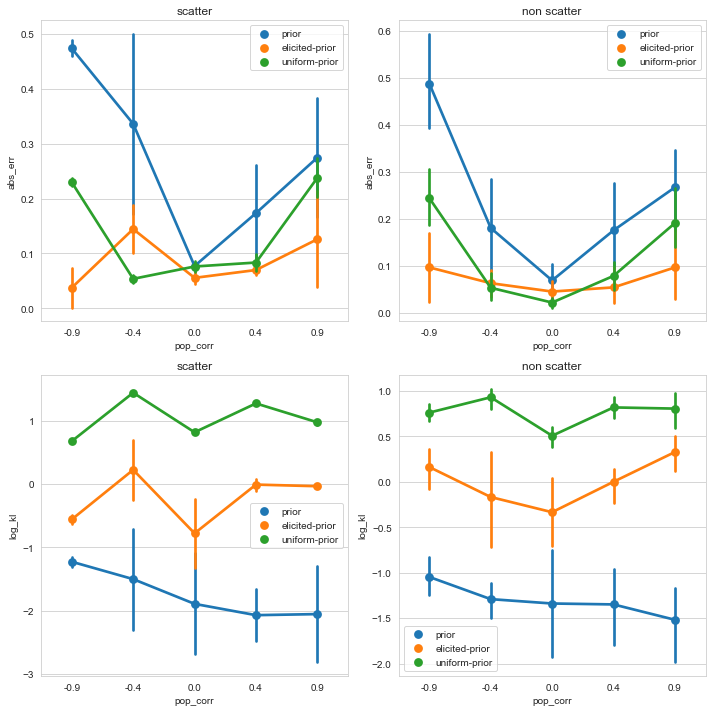

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(10, 10))

for i, outcome in enumerate(['abs_err', 'log_kl']):
    for j in [0, 1]:
        axi = ax[i][j]
        
        if j == 0:
            ss = kldf[kldf.visGroup=='scatter']
        else:
            ss = kldf[kldf.visGroup!='scatter']
        
        sns.pointplot(data=ss, x='pop_corr', y=outcome, hue='model', ax=axi)
        
        axi.set_title(['scatter', 'non scatter'][j])
        
        if outcome is 'mae':
            axi.set_ylim(0, .7)
        #else:
        #    axi.set_ylim(0, 5)
            
        axi.legend()

plt.tight_layout()
plt.show()

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; u

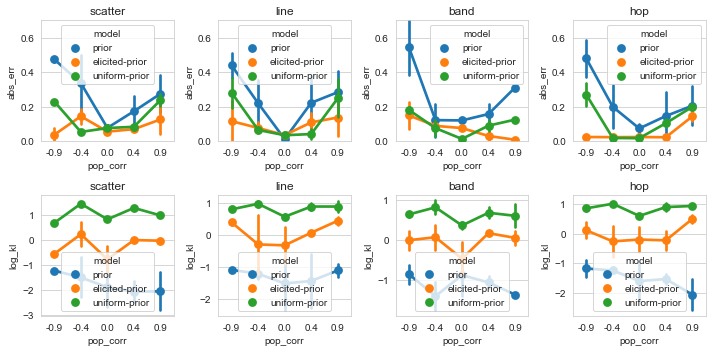

In [ ]:
fig, ax = plt.subplots(2, 4, figsize=(10, 5))

for i, outcome in enumerate(['abs_err', 'log_kl']):
    for j, vg in enumerate(['scatter', 'line', 'band', 'hop']):
        axi = ax[i][j]
        
        ss = kldf[kldf.visGroup==vg]
        
        sns.pointplot(data=ss, x='pop_corr', y=outcome, hue='model', ax=axi)
        
        axi.set_title(vg)
        
        if outcome is 'abs_err':
            axi.set_ylim(0, .7)
        #else:
        #    axi.set_ylim(0, 5)

plt.tight_layout()
plt.show()

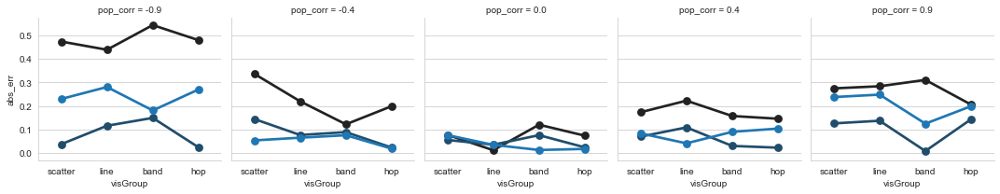

In [ ]:
g = sns.FacetGrid(agg, col="pop_corr")
g.map(sns.pointplot, "visGroup", "abs_err", "model", 
      order=['scatter', 'line', 'band', 'hop'],
      hue_order=['prior', 'elicited-prior', 'uniform-prior'])

### By individual

In [ ]:
dx = .05
bins = np.arange(-1, 1 + dx, dx)

In [ ]:
# how different are the predictions?
arr = []
for i, row in aggdf.iterrows():
    sid = row['usertoken']
    vs = row['vars']
    cond = row['visGroup']
    k = (sid, vs)

    dist = predictions[k]['pred'].mean() - predictions_uniform[vs].mean()
    
    
    # elicited-prior
    prior_hist = np.histogram(predictions[k]['pred'], bins=bins)[0]
    prior_hist = prior_hist/prior_hist.sum()
    prior_err = np.abs(row[['post_belief']].values[0] - predictions[k]['pred'].mean())
    
    # uniform-prior
    unif_hist = np.histogram(predictions_uniform[vs], bins=bins)[0]
    unif_hist = unif_hist/unif_hist.sum()
    unif_err = np.abs(row[['post_belief']].values[0] - predictions_uniform[vs].mean())
    
    unif_hist = np.clip(unif_hist, 1e-4, 1-(1e-4))
    prior_hist = np.clip(prior_hist, 1e-4, 1-(1e-4))

    ent = entropy(prior_hist, unif_hist)
    
    arr.append([sid, vs, pop_corr[vs], cond, dist, np.log(ent)])


distdf = pd.DataFrame(arr, columns=['sid', 'vars', 'pop_corr', 'visGroup', 'dist', 'log_kl'])

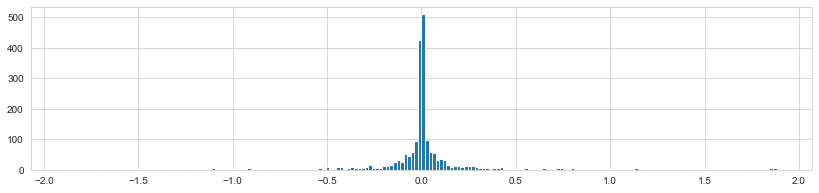

In [ ]:
distdf.dist.hist(bins=200, figsize=(14,3))

In [ ]:
n_eq = distdf[(distdf.dist >= -.1) & (distdf.dist <= .1)].shape[0]
print(n_eq, np.round(n_eq/distdf.shape[0], 2))

1453 0.69


In [ ]:
n_eq = distdf[(distdf.dist >= -.2) & (distdf.dist <= .2)].shape[0]
print(n_eq, np.round(n_eq/distdf.shape[0], 2))

1652 0.78


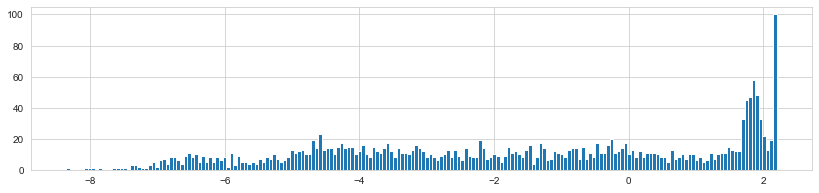

In [ ]:
distdf.log_kl.hist(bins=200, figsize=(14,3))

In [ ]:
arr = []
for i, row in aggdf.iterrows():
    sid = row['usertoken']
    vs = row['vars']
    cond = row['visGroup']
    k = (sid, vs)

    
    # observed prior
    normal_prior = row[['prior_belief', 'prior_sd']].values
    cdf = norm.cdf(bins, normal_prior[0], normal_prior[1])
    prior = np.diff(cdf)
    prior = prior/prior.sum()
    prior_mn = np.dot(prior, bins[:-1] + dx/2)

    prior_sd = np.sqrt(truncnorm.stats(-1, 1, loc=normal_prior[0], scale=normal_prior[1], moments='v'))

    prior_err = np.abs(row['prior_belief'] - sample_corr[vs])
    
    if not np.isnan(normal_prior[0]):


        # observed posterior
        normal_post = row[['post_belief', 'post_sd']].values
        cdf = norm.cdf(bins, normal_post[0], normal_post[1])
        post = np.diff(cdf)
        post = post/post.sum()
        post_mn = np.dot(post, bins[:-1] + dx/2)
        post_sd = np.sqrt(truncnorm.stats(-1, 1, loc=normal_post[0], scale=normal_post[1], moments='v'))


        # elicited-prior
        elicitedPrior_sd = np.std(predictions[k]['pred'])
        prior_hist = np.histogram(predictions[k]['pred'], bins=bins)[0]
        prior_hist = prior_hist/prior_hist.sum()
        
        elicitedPrior_err = np.abs(post_mn - predictions[k]['pred'].mean())

        # uniform-prior
        uniformPrior_sd = np.std(predictions_uniform[vs])
        unif_hist = np.histogram(predictions_uniform[vs], bins=bins)[0]
        unif_hist = unif_hist/unif_hist.sum()
        unif_err = np.abs(post_mn - predictions_uniform[vs].mean())

        post = np.clip(post, 1e-4, 1-(1e-4))
        prior = np.clip(prior, 1e-4, 1-(1e-4))
        unif_hist = np.clip(unif_hist, 1e-4, 1-(1e-4))
        prior_hist = np.clip(prior_hist, 1e-4, 1-(1e-4))

        arr.append([sid, vs, pop_corr[vs], cond, 'prior', prior_err,
                    np.abs(post_mn - prior_mn), 
                    post_sd - prior_sd,
                    entropy(prior, post)])
        arr.append([sid, vs, pop_corr[vs], cond, 'uniform-prior', prior_err,
                    unif_err,
                    post_sd - uniformPrior_sd,
                    entropy(unif_hist, post)])
        arr.append([sid, vs, pop_corr[vs], cond, 'elicited-prior', prior_err,
                    elicitedPrior_err, 
                    post_sd - elicitedPrior_sd,
                    entropy(prior_hist, post)])
    
kldf = pd.DataFrame(arr, columns=['sid', 'vars', 'pop_corr', 'visGroup', 'model', 'prior_err', 'mae', 'sddiff', 'kl'])
kldf['log_kl'] = np.log(np.clip(kldf.kl, 1e-4, None))
kldf.to_csv('data_proc/modeldata_individual.csv')

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; u

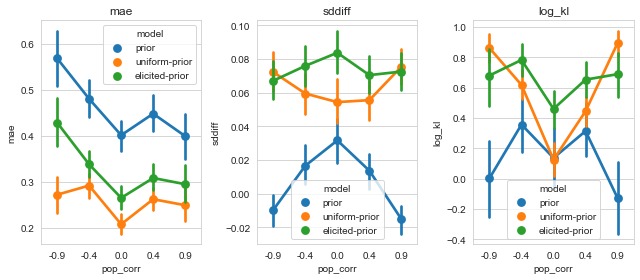

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(9, 4))

for i, outcome in enumerate(['mae', 'sddiff', 'log_kl']):
    axi = ax[i]

    sns.pointplot(data=kldf, x='pop_corr', y=outcome, hue='model', ax=axi)

    axi.set_title(outcome)

    #if outcome is 'mae':
    #    axi.set_ylim(0, .6)
    #else:
    #    axi.set_ylim(0, 4.5)

plt.tight_layout()
plt.show()
fig.savefig('results_figures/models_individual.pdf', bbox_inches='tight')

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; u

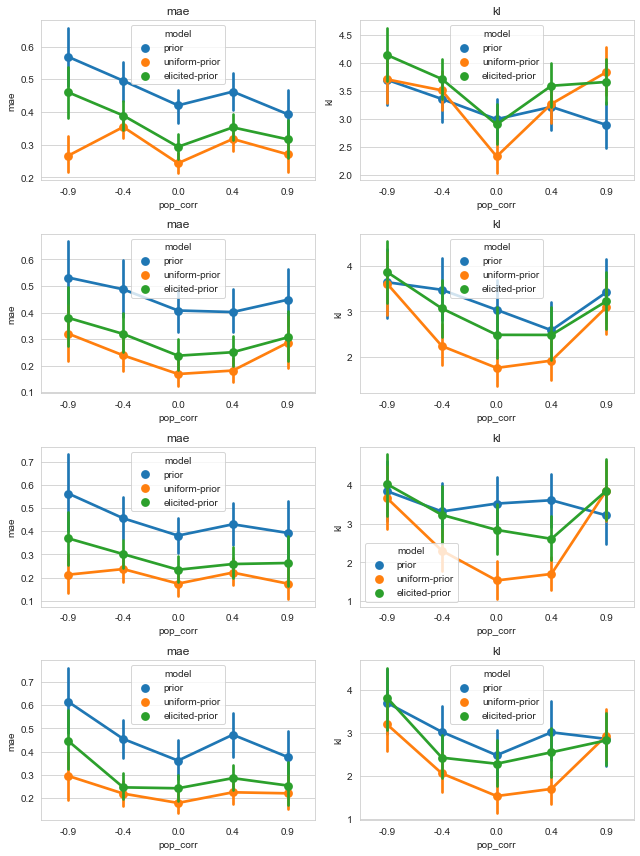

In [ ]:
fig, ax = plt.subplots(4, 2, figsize=(9, 12))

for i, vg in enumerate(['scatter', 'line', 'band', 'hop']):


    for j, outcome in enumerate(['mae', 'kl']):
        axi = ax[i][j]

        sns.pointplot(data=kldf[kldf.visGroup==vg], x='pop_corr', y=outcome, hue='model', ax=axi)

        axi.set_title(outcome)

        #if outcome is 'mae':
        #    axi.set_ylim(0, .6)
        #else:
        #    axi.set_ylim(0, 4.5)

plt.tight_layout()
plt.show()
#fig.savefig('results_figures/models_individual.pdf', bbox_inches='tight')

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; u

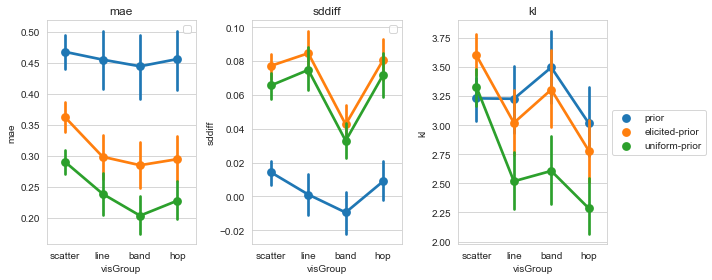

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(10, 4))

for i, outcome in enumerate(['mae', 'sddiff', 'kl']):
    axi = ax[i]

    sns.pointplot(data=kldf, x='visGroup', y=outcome, hue='model', 
                  order=['scatter', 'line', 'band', 'hop'],
                  hue_order=['prior', 'elicited-prior', 'uniform-prior'],
                  ax=axi)

    axi.set_title(outcome)

    #if outcome is 'mae':
    #    axi.set_ylim(0, .6)
    #else:
    #    axi.set_ylim(0, 4.5)

    if i==2:
        axi.legend(loc='center left', bbox_to_anchor=(1,.5))
    else:
        axi.legend([])
    
plt.tight_layout()
plt.show()
fig.savefig('results_figures/models_individual_by_group.pdf', bbox_inches='tight')

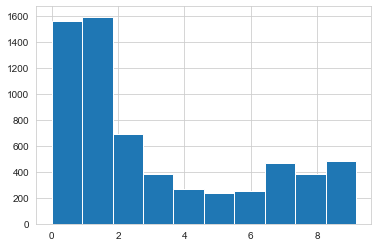

In [ ]:
kldf.kl.hist()

In [ ]:
agg = kldf.groupby(['sid', 'visGroup', 'model']).agg(np.mean).reset_index()

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


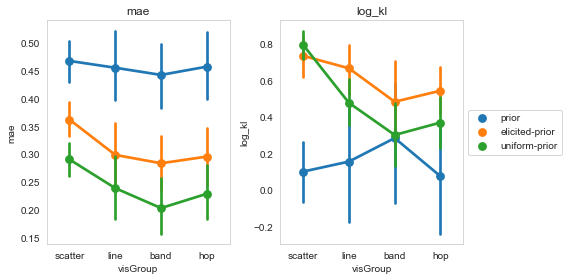

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(8, 4))

for i, outcome in enumerate(['mae', 'log_kl']):
    axi = ax[i]

    sns.pointplot(data=agg, x='visGroup', y=outcome, hue='model', 
                  order=['scatter', 'line', 'band', 'hop'],
                  hue_order=['prior', 'elicited-prior', 'uniform-prior'],
                  ax=axi)

    axi.set_title(outcome)
    axi.grid(False)

    #if outcome is 'mae':
    #    axi.set_ylim(0, .6)
    #else:
    #    axi.set_ylim(0, 4.5)

    if i==1:
        axi.legend(loc='center left', bbox_to_anchor=(1,.5))
    else:
        axi.legend([], frameon=False)
    
plt.tight_layout()
plt.show()
fig.savefig('results_figures/models_individual_by_group.pdf', bbox_inches='tight')

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; u

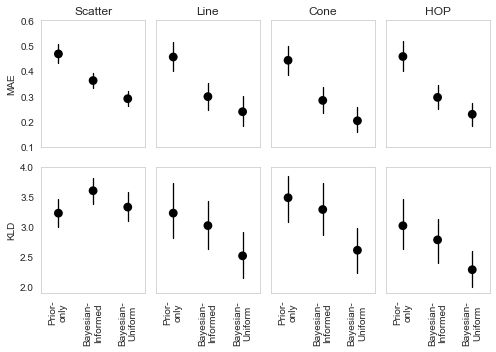

In [ ]:
titles = ['Scatter', 'Line', 'Cone', 'HOP']

fig, ax = plt.subplots(2, 4, figsize=(7, 5))

for i, outcome in enumerate(['mae', 'kl']):
    for j, vg in enumerate(['scatter', 'line', 'band', 'hop']):
        axi = ax[i][j]

        sns.pointplot(data=agg[agg.visGroup==vg], x='model', y=outcome, 
                      order=['prior', 'elicited-prior', 'uniform-prior'],
                      color='black',
                      join=False,
                      marker='o',
                      errwidth=1.3,
                      s=.1,
                      ax=axi)

        if i==0:
            axi.set_title(titles[j])
            axi.set_ylim(.1,.6)
            axi.set_xticklabels([])
            axi.set_ylabel('MAE')
            
        else:
            axi.set_ylim(1.9,4)
            axi.set_xticklabels(['Prior-\nonly', 'Bayesian-\nInformed', 'Bayesian-\nUniform'], rotation=90)
            axi.set_ylabel('KLD')
            
        if j!=0:
            axi.set_ylabel(None)
            axi.set_yticklabels([])
            
        axi.set_xlabel(None)
        axi.grid(False)

        #if outcome is 'mae':
        #    axi.set_ylim(0, .6)
        #else:
        #    axi.set_ylim(0, 4.5)

    
plt.tight_layout()
plt.show()
fig.savefig('results_figures/models_individual_by_group_faceted.pdf', bbox_inches='tight')

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; u

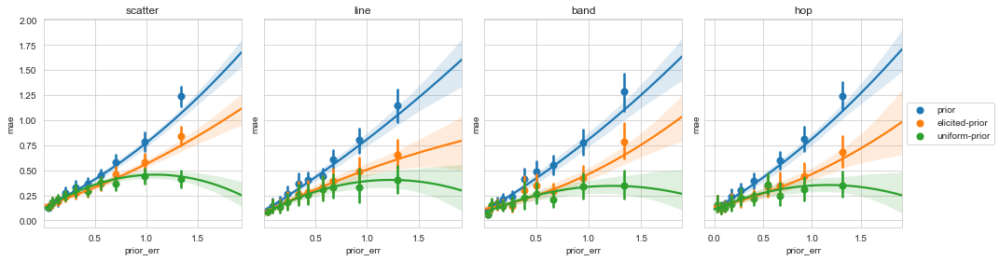

In [ ]:
fig, ax = plt.subplots(1, 4, figsize=(15,4), sharey=True)

for i, vg in enumerate(['scatter', 'line', 'band', 'hop']):

    axi = ax[i]

    ss = kldf[(kldf.model=='prior') & (kldf.visGroup==vg)]
    sns.regplot(data=ss, x='prior_err', y='mae', order=2, x_bins=10, ax=axi, label='prior')


    ss = kldf[(kldf.model=='elicited-prior') & (kldf.visGroup==vg)]
    sns.regplot(data=ss, x='prior_err', y='mae', order=2, x_bins=10, ax=axi, label='elicited-prior')

    ss = kldf[(kldf.model=='uniform-prior') & (kldf.visGroup==vg)]
    sns.regplot(data=ss, x='prior_err', y='mae', order=2, x_bins=10, ax=axi, label='uniform-prior')

    
    axi.set_title(vg)
    
    if i==3:
        axi.legend(loc='center left', bbox_to_anchor=(1,.5))
    
plt.tight_layout()
plt.show()

fig.savefig('results_figures/models_mae_by_prior_err.pdf', bbox_inches='tight')

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; u

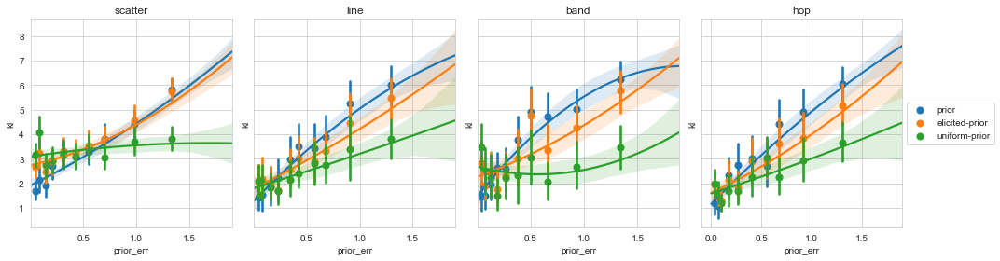

In [ ]:
fig, ax = plt.subplots(1, 4, figsize=(15,4), sharey=True)

for i, vg in enumerate(['scatter', 'line', 'band', 'hop']):

    axi = ax[i]

    ss = kldf[(kldf.model=='prior') & (kldf.visGroup==vg)]
    sns.regplot(data=ss, x='prior_err', y='kl', order=2, x_bins=10, ax=axi, label='prior')


    ss = kldf[(kldf.model=='elicited-prior') & (kldf.visGroup==vg)]
    sns.regplot(data=ss, x='prior_err', y='kl', order=2, x_bins=10, ax=axi, label='elicited-prior')

    ss = kldf[(kldf.model=='uniform-prior') & (kldf.visGroup==vg)]
    sns.regplot(data=ss, x='prior_err', y='kl', order=2, x_bins=10, ax=axi, label='uniform-prior')

    
    axi.set_title(vg)
    
    if i==3:
        axi.legend(loc='center left', bbox_to_anchor=(1,.5))
    
plt.tight_layout()
plt.show()
#fig.savefig('results_figures/models_kld_by_prior_err.pdf', bbox_inches='tight')

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; u

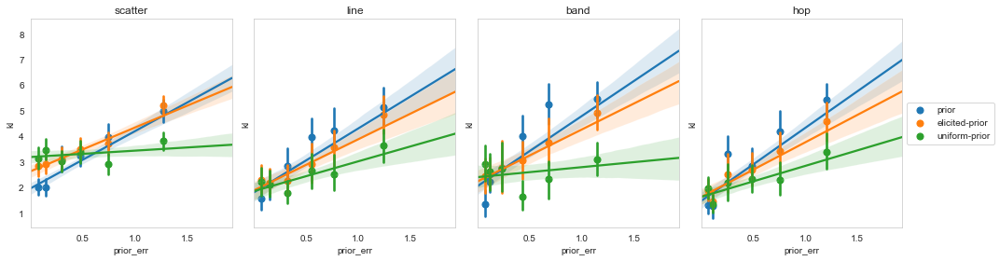

In [ ]:
fig, ax = plt.subplots(1, 4, figsize=(15,4), sharey=True)

for i, vg in enumerate(['scatter', 'line', 'band', 'hop']):

    axi = ax[i]

    ss = kldf[(kldf.model=='prior') & (kldf.visGroup==vg)]
    sns.regplot(data=ss, x='prior_err', y='kl', order=1, x_bins=6, ax=axi, label='prior')


    ss = kldf[(kldf.model=='elicited-prior') & (kldf.visGroup==vg)]
    sns.regplot(data=ss, x='prior_err', y='kl', order=1, x_bins=6, ax=axi, label='elicited-prior')

    ss = kldf[(kldf.model=='uniform-prior') & (kldf.visGroup==vg)]
    sns.regplot(data=ss, x='prior_err', y='kl', order=1, x_bins=6, ax=axi, label='uniform-prior')

    
    axi.set_title(vg)
    axi.grid(False)
    
    if i==3:
        axi.legend(loc='center left', bbox_to_anchor=(1,.5))
    
plt.tight_layout()
plt.show()
fig.savefig('results_figures/models_kld_by_prior_err.pdf', bbox_inches='tight')

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; u

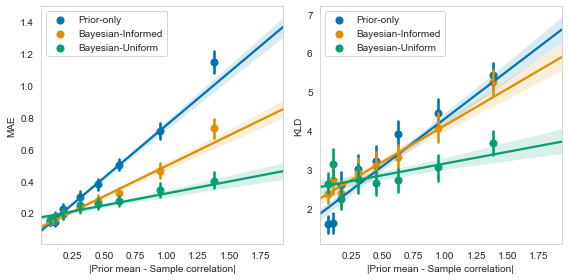

In [ ]:
n_bins = 8

fig, ax = plt.subplots(1, 2, figsize=(8,4))


axi = ax[0]

ss = kldf[(kldf.model=='prior')]
sns.regplot(data=ss, x='prior_err', y='mae', order=1, x_bins=n_bins, ax=axi, label='Prior-only')

ss = kldf[(kldf.model=='elicited-prior')]
sns.regplot(data=ss, x='prior_err', y='mae', order=1, x_bins=n_bins, ax=axi, label='Bayesian-Informed')

ss = kldf[(kldf.model=='uniform-prior')]
sns.regplot(data=ss, x='prior_err', y='mae', order=1, x_bins=n_bins, ax=axi, label='Bayesian-Uniform')
axi.grid(False)
axi.set_ylabel('MAE')
axi.legend(loc='upper left')



axi = ax[1]

ss = kldf[(kldf.model=='prior')]
sns.regplot(data=ss, x='prior_err', y='kl', order=1, x_bins=n_bins, ax=axi, label='Prior-only')

ss = kldf[(kldf.model=='elicited-prior')]
sns.regplot(data=ss, x='prior_err', y='kl', order=1, x_bins=n_bins, ax=axi, label='Bayesian-Informed')

ss = kldf[(kldf.model=='uniform-prior')]
sns.regplot(data=ss, x='prior_err', y='kl', order=1, x_bins=n_bins, ax=axi, label='Bayesian-Uniform')
axi.set_ylabel('KLD')

#axi.set_title(vg)
axi.grid(False)

for axi in ax:
    axi.set_xlabel('|Prior mean - Sample correlation|')

axi.legend(loc='upper left')


#if i==1:
#    axi.legend(loc='center left', bbox_to_anchor=(1,.5))
    
# bb = (fig.subplotpars.left, fig.subplotpars.bottom - 0.2, 
#       fig.subplotpars.right-fig.subplotpars.left, .1)

# ax[0].legend(bbox_to_anchor=bb, mode="expand", loc="lower left",
#              ncol=2, borderaxespad=0., bbox_transform=fig.transFigure)


plt.tight_layout()
plt.show()
fig.savefig('results_figures/study2_models_by_prior_err.pdf', bbox_inches='tight')

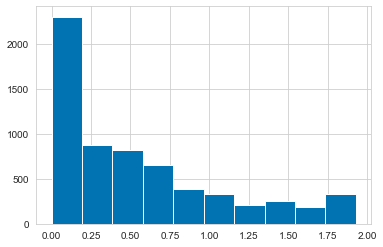

In [ ]:
kldf.prior_err.hist() fi

In [ ]:
sns.set_palette('colorblind')

In [ ]:
sns.palplot(sns.palettes.xkcd_palette)

TypeError: object of type 'function' has no len()

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; u

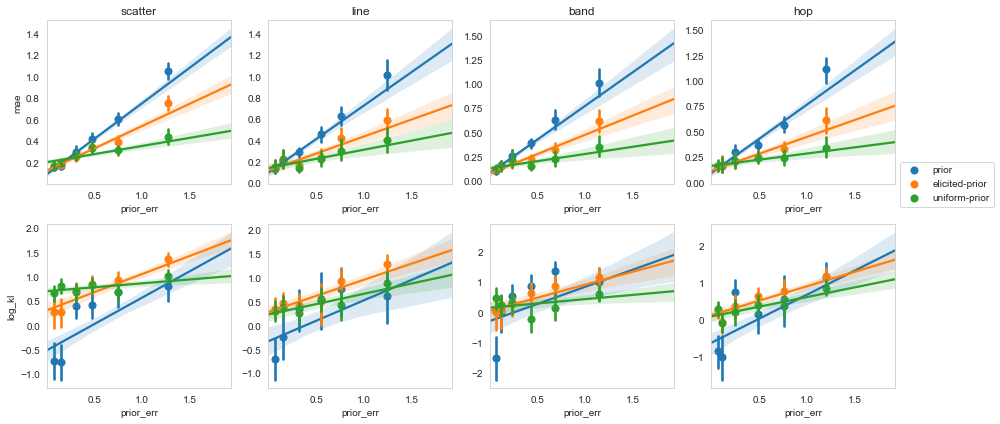

In [ ]:
n_bins = 6

fig, ax = plt.subplots(2, 4, figsize=(14,6))

for i, vg in enumerate(['scatter', 'line', 'band', 'hop']):


    axi = ax[0][i]

    ss = kldf[(kldf.model=='prior') & (kldf.visGroup==vg)]
    sns.regplot(data=ss, x='prior_err', y='mae', order=1, x_bins=n_bins, ax=axi, label='prior')

    ss = kldf[(kldf.model=='elicited-prior') & (kldf.visGroup==vg)]
    sns.regplot(data=ss, x='prior_err', y='mae', order=1, x_bins=n_bins, ax=axi, label='elicited-prior')

    ss = kldf[(kldf.model=='uniform-prior') & (kldf.visGroup==vg)]
    sns.regplot(data=ss, x='prior_err', y='mae', order=1, x_bins=n_bins, ax=axi, label='uniform-prior')
    axi.grid(False)

    axi.set_title(vg)
    if i==3:
        axi.legend(loc='center left', bbox_to_anchor=(1,0))

    if i!=0:
        axi.set_ylabel(None)

    
    axi = ax[1][i]

    ss = kldf[(kldf.model=='prior') & (kldf.visGroup==vg)]
    sns.regplot(data=ss, x='prior_err', y='log_kl', order=1, x_bins=n_bins, ax=axi, label='prior')

    ss = kldf[(kldf.model=='elicited-prior') & (kldf.visGroup==vg)]
    sns.regplot(data=ss, x='prior_err', y='log_kl', order=1, x_bins=n_bins, ax=axi, label='elicited-prior')

    ss = kldf[(kldf.model=='uniform-prior') & (kldf.visGroup==vg)]
    sns.regplot(data=ss, x='prior_err', y='log_kl', order=1, x_bins=n_bins, ax=axi, label='uniform-prior')

    if i!=0:
        axi.set_ylabel(None)


    
    axi.grid(False)

    
plt.tight_layout()
plt.show()
fig.savefig('results_figures/models_by_prior_err.pdf', bbox_inches='tight')

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


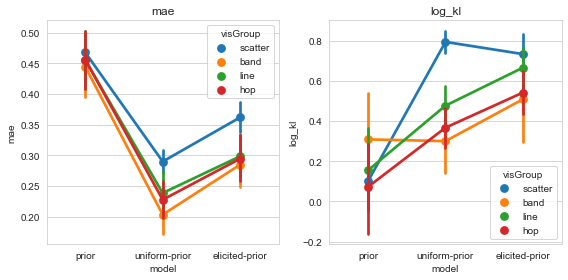

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(8, 4))

for i, outcome in enumerate(['mae', 'log_kl']):
    axi = ax[i]

    sns.pointplot(data=kldf, x='model', y=outcome, hue='visGroup', ax=axi)

    axi.set_title(outcome)

    #if outcome is 'mae':
    #    axi.set_ylim(0, .6)
    #else:
    #    axi.set_ylim(0, 4.5)

plt.tight_layout()
plt.show()
#fig.savefig('results_figures/models_individual_by_model.pdf', bbox_inches='tight')

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


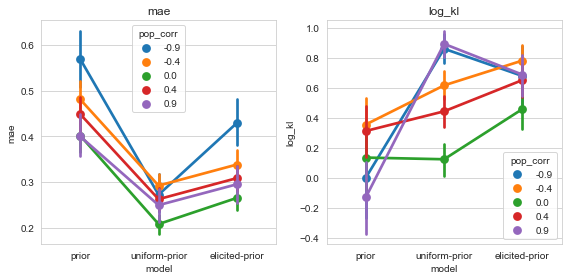

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(8, 4))

for i, outcome in enumerate(['mae', 'log_kl']):
    axi = ax[i]

    sns.pointplot(data=kldf, x='model', y=outcome, hue='pop_corr', ax=axi)

    axi.set_title(outcome)

    #if outcome is 'mae':
    #    axi.set_ylim(0, .6)
    #else:
    #    axi.set_ylim(0, 4.5)

plt.tight_layout()
plt.show()
fig.savefig('results_figures/models_individual_by_model.pdf', bbox_inches='tight')

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; u

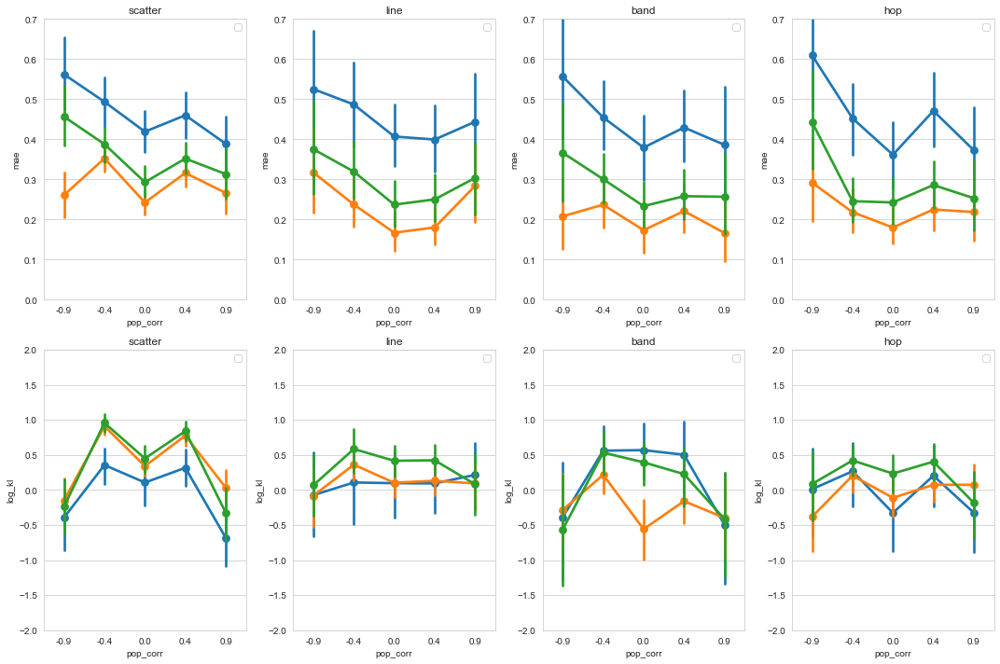

In [ ]:
fig, ax = plt.subplots(2, 4, figsize=(15, 10))

for i, outcome in enumerate(['mae', 'log_kl']):
    for j, vg in enumerate(['scatter', 'line', 'band', 'hop']):
        axi = ax[i][j]
        
        ss = kldf[kldf.visGroup==vg]
        
        sns.pointplot(data=ss, x='pop_corr', y=outcome, hue='model', ax=axi)
        
        axi.set_title(vg)
        
        if outcome is 'mae':
            axi.set_ylim(0, .7)
        else:
            axi.set_ylim(-2, 2)
            
        axi.legend([])

plt.tight_layout()
plt.show()

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; u

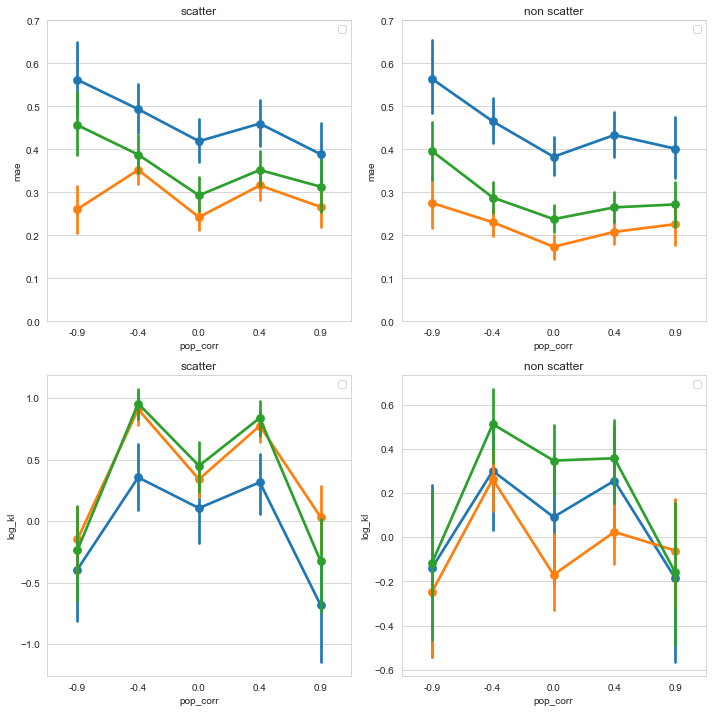

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(10, 10))

for i, outcome in enumerate(['mae', 'log_kl']):
    for j in [0, 1]:
        axi = ax[i][j]
        
        if j == 0:
            ss = kldf[kldf.visGroup=='scatter']
        else:
            ss = kldf[kldf.visGroup!='scatter']
        
        sns.pointplot(data=ss, x='pop_corr', y=outcome, hue='model', ax=axi)
        
        axi.set_title(['scatter', 'non scatter'][j])
        
        if outcome is 'mae':
            axi.set_ylim(0, .7)
        #else:
        #    axi.set_ylim(0, 5)
            
        axi.legend([])

plt.tight_layout()
plt.show()

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; u

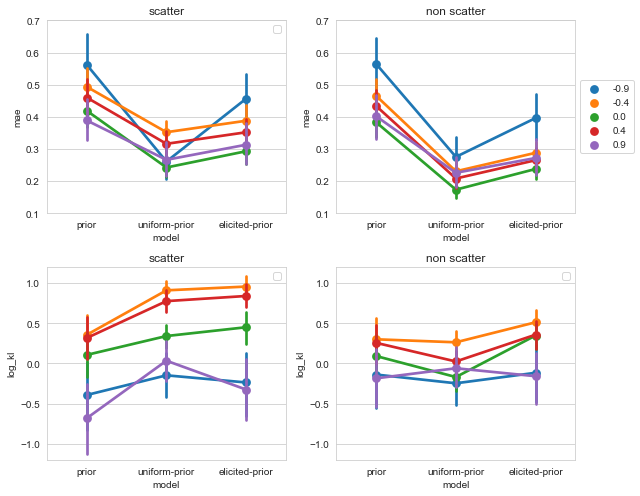

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(9, 7))

for i, outcome in enumerate(['mae', 'log_kl']):
    for j in [0, 1]:
        axi = ax[i][j]
        
        if j == 0:
            ss = kldf[kldf.visGroup=='scatter']
        else:
            ss = kldf[kldf.visGroup!='scatter']
        
        sns.pointplot(data=ss, x='model', y=outcome, hue='pop_corr', ax=axi)
        
        axi.set_title(['scatter', 'non scatter'][j])
        
        if outcome is 'mae':
            axi.set_ylim(0.1, .7)
        else:
            axi.set_ylim(-1.2, 1.2)
        
        if i==0 and j==1:
            axi.legend(loc='center left', bbox_to_anchor=(1,.5))
        else:
            axi.legend([])

plt.tight_layout()
plt.show()

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


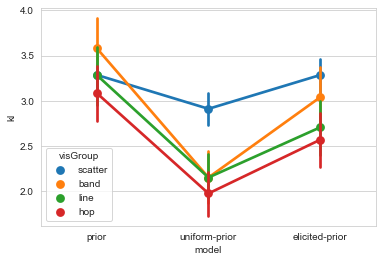

In [ ]:
sns.pointplot(data=kldf, x='model', y='kl', hue='visGroup')

In [ ]:
kldiff = kldf.groupby(['sid', 'visGroup']).apply(lambda d: pd.Series({'errdiff': d[d.model=='uniform-prior'].mae.values[0] - d[d.model=='elicited-prior'].mae.values[0],
                                                                      'kldiff': d[d.model=='uniform-prior'].kl.values[0] - d[d.model=='elicited-prior'].kl.values[0]})).reset_index()

In [ ]:
kldiff.groupby('visGroup').apply(lambda d: np.sum(d.kldiff > 0)/d.shape[0])

visGroup
band       0.484375
hop        0.459459
line       0.500000
scatter    0.561321
dtype: float64

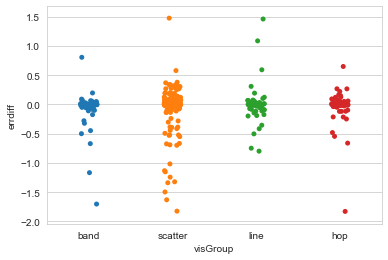

In [ ]:
sns.stripplot(data=kldiff, x='visGroup', y='errdiff')

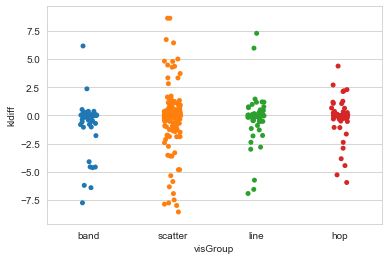

In [ ]:
sns.stripplot(data=kldiff, x='visGroup', y='kldiff')

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


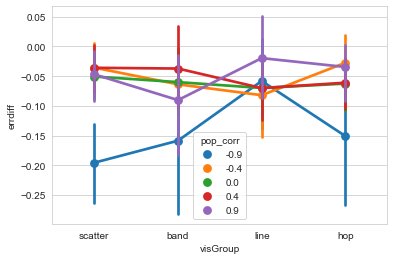

In [ ]:
sns.pointplot(data=kldiff, x='visGroup', y='errdiff', hue='pop_corr')

In [ ]:
kldf.head()

,sid,vars,pop_corr,visGroup,model,mae,sddiff,kl,log_kl
0,08zKHo8E,Exercise amount_Body weight,-0.4,scatter,prior,0.184457,-0.022039,1.604239,0.472650
1,08zKHo8E,Exercise amount_Body weight,-0.4,scatter,uniform-prior,0.100278,-0.026673,0.503379,-0.686412
2,08zKHo8E,Exercise amount_Body weight,-0.4,scatter,elicited-prior,0.117044,-0.019305,0.696391,-0.361844
3,08zKHo8E,Government spending_Budget deficit,0.9,band,prior,0.339675,-0.056019,7.408308,2.002602
4,08zKHo8E,Government spending_Budget deficit,0.9,band,uniform-prior,0.076625,-0.004756,8.512250,2.141506


In [ ]:
kldiff = kldiff.groupby(['sid', 'visGroup', 'pop_corr']).apply(lambda d: pd.Series({'kldiff': d.kldiff.mean(),
                                                                                    'errdiff': d.errdiff.mean()})).reset_index()

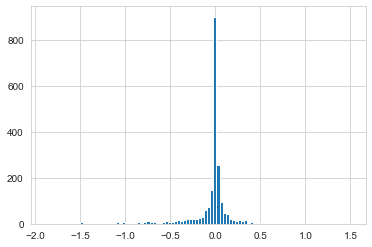

In [ ]:
kldiff.errdiff.hist(bins=100)

In [ ]:
c = .1
n_equal = kldiff[(kldiff.errdiff >= -c) & (kldiff.errdiff <= c)].shape[0]
n_unif = kldiff[(kldiff.errdiff < -c)].shape[0]
n_elic = kldiff[(kldiff.errdiff > c)].shape[0]
print(n_equal, n_elic, n_unif)
print(np.round(n_equal/kldiff.shape[0], 2), np.round(n_elic/kldiff.shape[0], 2), np.round(n_unif/kldiff.shape[0], 2))

1518 193 403
0.72 0.09 0.19


In [ ]:
agg2 = kldiff.groupby(['sid']).apply(lambda d: pd.Series({'kldiff': d.kldiff.mean(),
                                                          'errdiff': d.errdiff.mean()})).reset_index()

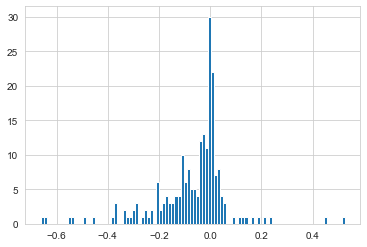

In [ ]:
agg2.errdiff.hist(bins=100)

In [ ]:
c = .1
n_equal = agg2[(agg2.errdiff >= -c) & (agg2.errdiff <= c)].shape[0]
n_unif = agg2[(agg2.errdiff < -c)].shape[0]
n_elic = agg2[(agg2.errdiff > c)].shape[0]
print(n_equal, n_elic, n_unif)
print(np.round(n_equal/212., 2), np.round(n_elic/212., 2), np.round(n_unif/212., 2))

142 8 62
0.67 0.04 0.29


In [ ]:
agg2 = kldiff.groupby(['sid', 'visGroup', 'pop_corr']).apply(lambda d: pd.Series({'kldiff': d.kldiff.mean(),
                                                                                  'errdiff': d.errdiff.mean()})).reset_index()

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


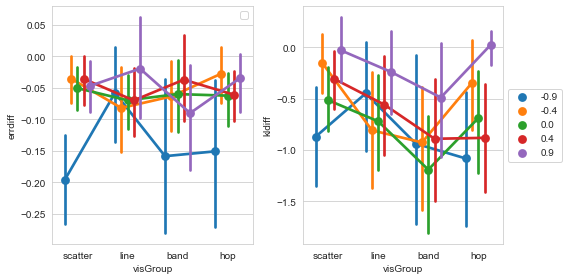

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(8,4))

axi = ax[0]
sns.pointplot(data=agg2, x='visGroup', y='errdiff', hue='pop_corr',
              order=['scatter', 'line', 'band', 'hop'], markers='o',
              dodge=.5,
              ax=axi)

#axi.set_ylabel(r'$MAE_{Uniform} - MAE_{Elicited}$')
axi.legend([])

axi = ax[1]
sns.pointplot(data=agg2, x='visGroup', y='kldiff', hue='pop_corr',
              order=['scatter', 'line', 'band', 'hop'], markers='o',
              dodge=.5,
              ax=axi)

#axi.set_ylabel(r'$KL_{Uniform} - KL_{Elicited}$')
axi.legend(loc='center left', bbox_to_anchor=(1, .5))

plt.tight_layout()
plt.show()
fig.savefig('results_figures/KL_difference_individual.pdf', bbox_inches='tight')

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


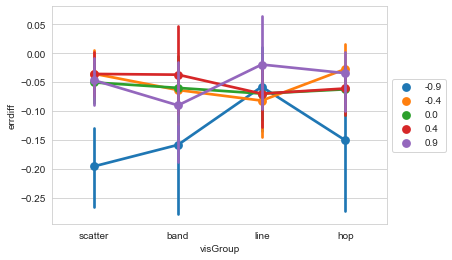

In [ ]:
fig, ax = plt.subplots()
sns.pointplot(data=kldiff, x='visGroup', y='errdiff', hue='pop_corr', ax=ax)
ax.legend(loc='center left', bbox_to_anchor=(1, .5))
plt.show()

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


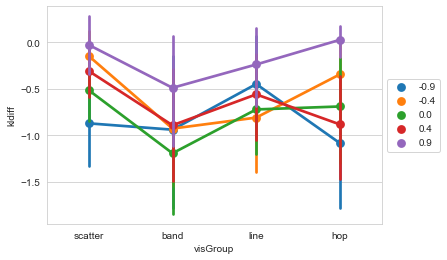

In [ ]:
fig, ax = plt.subplots()
sns.pointplot(data=kldiff, x='visGroup', y='kldiff', hue='pop_corr', ax=ax)
ax.legend(loc='center left', bbox_to_anchor=(1, .5))
plt.show()

In [ ]:
kldf['log_kl'] = np.log(kldf['kl'])
kldf.loc[kldf.kl==0.,'log_kl'] = np.log(.001)

/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


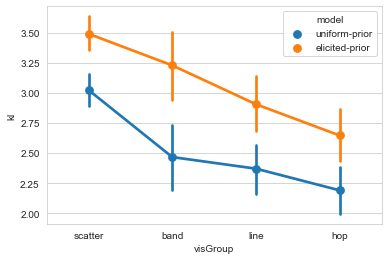

In [ ]:
sns.pointplot(data=kldf, x='visGroup', y='kl', hue='model')

In [ ]:
# positive number means better fit of elicited prior model
kldiff = kldf.groupby(['sid', 'vars', 'visGroup']).apply(lambda d: d[d.model=='uniform-prior'].kl.values[0] - d[d.model=='elicited-prior'].kl.values[0]).reset_index()
kldiff.columns = ['usertoken', 'vars', 'visGroup', 'kldiff']
aggkl = aggdf.merge(kldiff, on=['usertoken', 'visGroup', 'vars'])

In [ ]:
agg2 = aggkl.groupby(['usertoken', 'visGroup']).apply(lambda d: pd.Series({'kldiff': d.kldiff.sum()})).reset_index()

In [ ]:
agg2 = aggkl.groupby(['usertoken']).apply(lambda d: pd.Series({'kldiff': d.kldiff.mean()})).reset_index()

In [ ]:
n_equal = agg2[(agg2.kldiff >= -.5) & (agg2.kldiff <= .5)].shape[0]
n_unif = agg2[(agg2.kldiff < -.5)].shape[0]
n_elic = agg2[(agg2.kldiff > .5)].shape[0]
print(n_equal, n_elic, n_unif)

116 5 91


/anaconda2/envs/py37/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


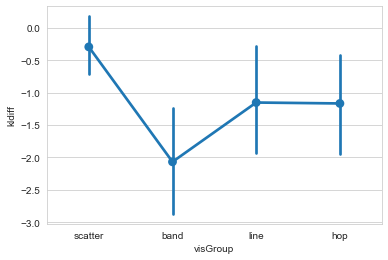

In [ ]:
sns.pointplot(data=agg2, x='visGroup', y='kldiff', order=['scatter', 'band', 'line', 'hop'])

In [ ]:
agg2.sort_values(by='err')

,usertoken,err
121,WK6FoEf7,-1.428695
163,ib8fhchj,-0.989008
24,7oe2yDye,-0.598200
5,0ZjAFmDL,-0.488117
76,LFUXivW2,-0.480966
160,hxRe3YWh,-0.474364
94,OZ4xrqij,-0.467049
210,zokN7Ne2,-0.458221
155,fOOeNv2Q,-0.442165
43,CD9szYJT,-0.422227


## Individual plots

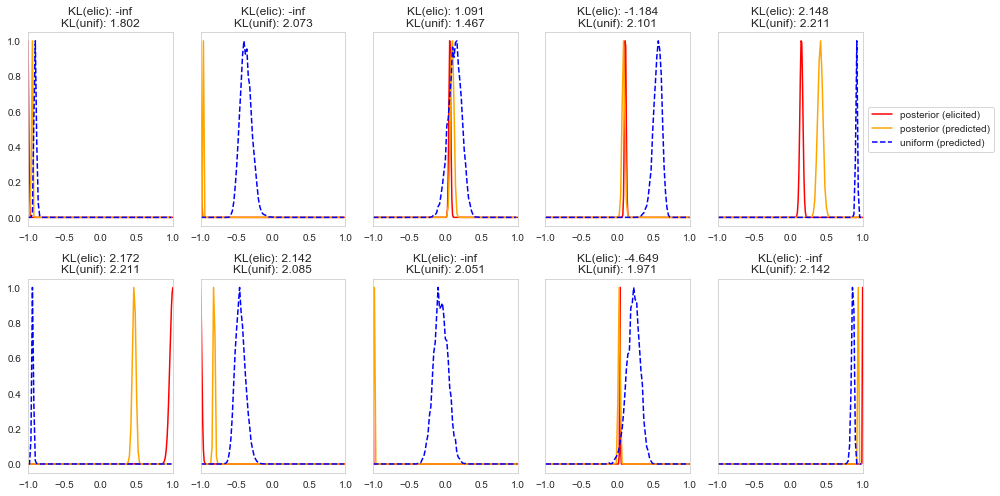

In [ ]:
sids = ['WK6FoEf7']

for i, grp in aggdf[np.isin(aggdf.usertoken, sids)].groupby('usertoken'):
        
    fig, ax = plt.subplots(2, 5, figsize=(14,7), sharey=True)
    xs = np.arange(-1, 1.01, .01)


    for i in range(2):
        for j, vs in enumerate(var_sets_srted[i]):

            axi = ax[i][j]

            row = grp[grp.vars==vs]

            kl = kldf[(kldf.sid==row['usertoken'].values[0]) & (kldf.vars==row['vars'].values[0])]
            kl_prior = np.round(kl[kl.model=='elicited-prior']['kl'].values[0], 3)
            kl_uniform = np.round(kl[kl.model=='uniform-prior']['kl'].values[0], 3)

            normal_prior = row[['prior_belief', 'prior_sd']].values[0]
            normal_post  = row[['post_belief', 'post_sd']].values[0]


            prior = norm.pdf(xs, normal_prior[0], normal_prior[1])
            prior = prior/prior.max()

            post = norm.pdf(xs, normal_post[0], normal_post[1])
            post = post/post.max()

            #axi = ax[j]
            #axi.plot(xs, prior, color='blue', label='prior (elicited)')
            axi.plot(xs, post, color='red', label='posterior (elicited)')

            pred = predictions[(row['usertoken'].values[0], row['vars'].values[0])]['pred']
            hist = np.histogram(pred, bins=100, range=(-1, 1))
            axi.plot(hist[1][:-1], hist[0]/hist[0].max(), color='orange', label='posterior (predicted)')

            pred = predictions_uniform[vs]
            hist = np.histogram(pred, bins=100, range=(-1, 1))
            axi.plot(hist[1][:-1], hist[0]/hist[0].max(), '--', color='blue', label='uniform (predicted)')


            axi.set_xlim(-1, 1)
            #ax.hist(tr['r'])
            #axi.legend()
            axi.grid(False)
            axi.set_title(f'KL(elic): {kl_prior}\nKL(unif): {kl_uniform}')

            if i==0 and j==4:
                axi.legend(loc='center left', bbox_to_anchor=(1, .5))



    plt.tight_layout()
    plt.show()
    

[0.4135270357549492 0.1256265423738847]
[0.1465124078347635 0.08670260071072344]
0.4


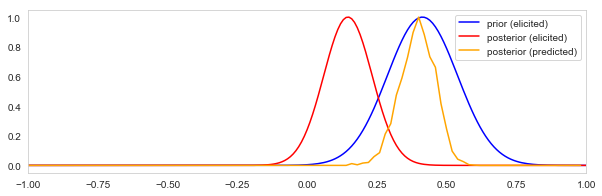

[0.4492299325003992 0.18742362856390393]
[0.20330535952842888 0.39834732023578556]
0.4


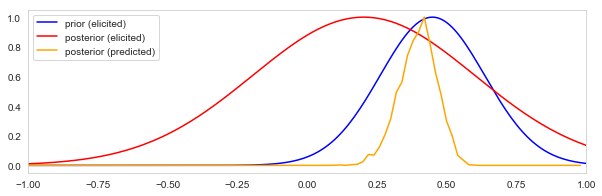

[0.4768060236496834 0.08363927991530448]
[0.6056268667574956 0.19718656662125245]
0.4


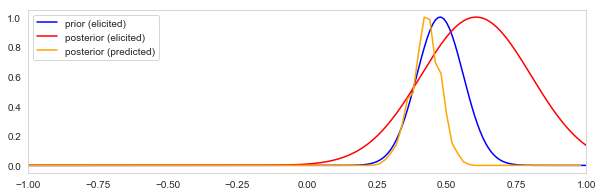

[0.2134664624311835 0.15835099764763727]
[0.005652800174806405 0.2407220505501354]
0.4


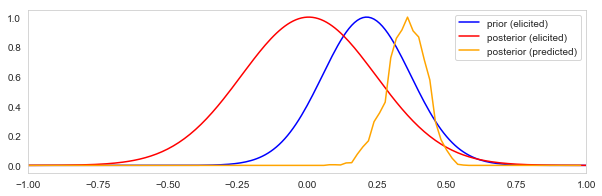

[-0.6952959189540677 0.04248549812765745]
[-0.7713481828622304 0.6424064767882411]
0.4


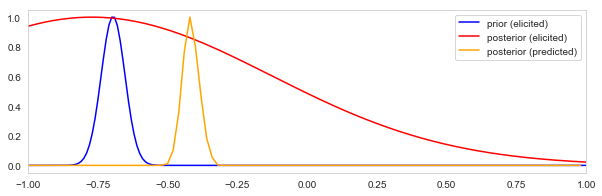

[-0.32665930420347 0.10458334773536357]
[0.808082543054025 0.07842816616491666]
0.4


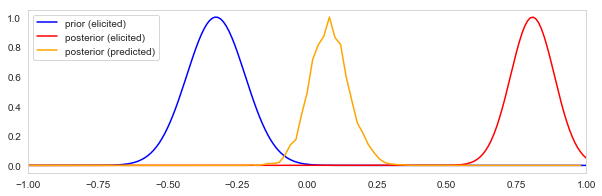

[1.0 0.08716401046992817]
[1.0 0.7977304553365177]
0.4


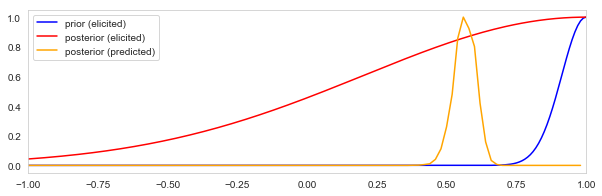

[0.24144659271613644 0.24205981608653948]
[0.4721570195505529 0.05435010297843079]
0.4


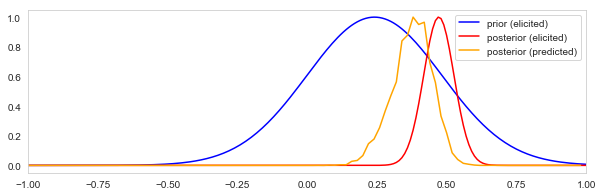

[0.6648553179750227 0.12443282878755282]
[0.8512482247681343 0.862861753578094]
0.4


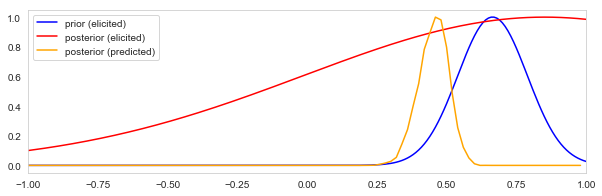

[0.4300562627488296 0.1635841153987354]
[0.0070745946104806565 0.4964627026947597]
0.4


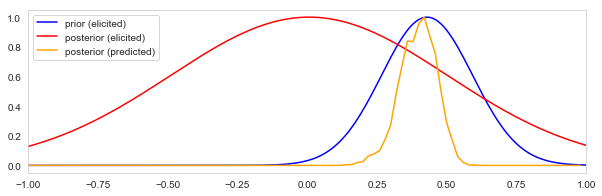

[0.7955197661529838 0.038188287039257474]
[0.5179010684881016 0.03997658773772106]
0.4


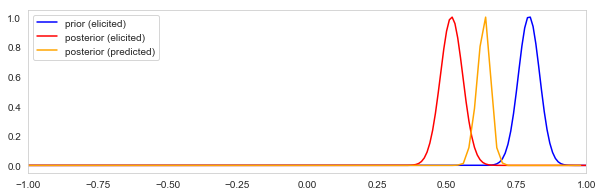

[-1.0 0.35623880420954945]
[0.532802509630407 0.08646291542515383]
0.4


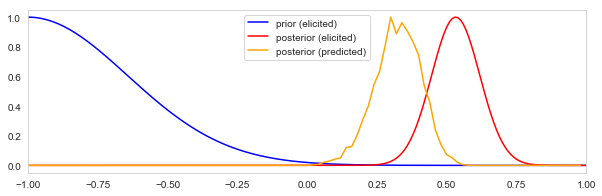

[0.9422588679041096 0.04137845698971171]
[0.06271935193711209 0.07109623727697159]
0.4


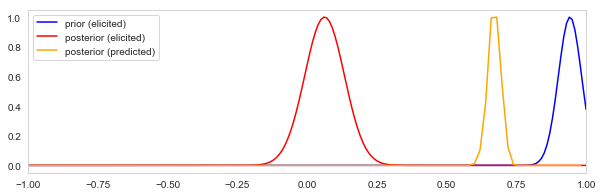

[0.78860169353001 0.7793223986705523]
[-0.3709929554743361 0.685496477737168]
0.4


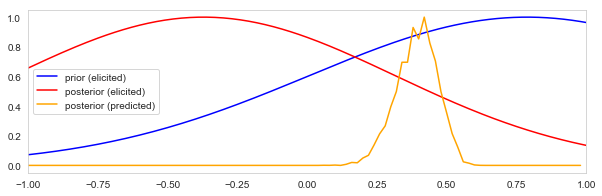

[-0.4810724837008742 0.08454223866906119]
[0.1066850282126417 0.2592884708668855]
0.4


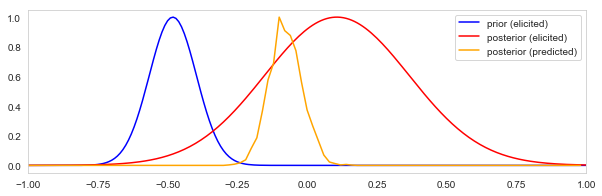

[0.42791668548797657 0.2860416572560117]
[0.8290708776123095 0.7232457322751469]
0.4


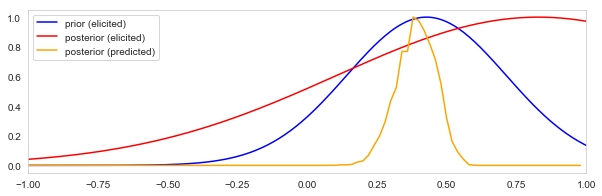

[0.2064225042883252 0.16757657272646043]
[1.0 0.45422209799107893]
0.4


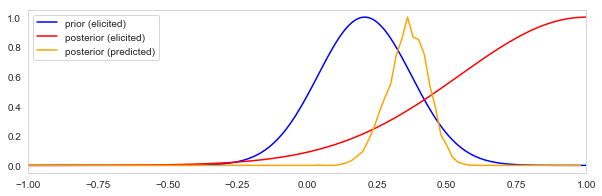

[1.0 0.0019848599411957935]
[0.7963201794206245 0.4227528781176667]
0.4


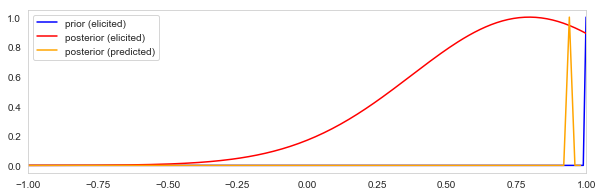

[0.38646733582729054 0.11431362144198831]
[0.018980639355042683 0.37721431124852]
0.4


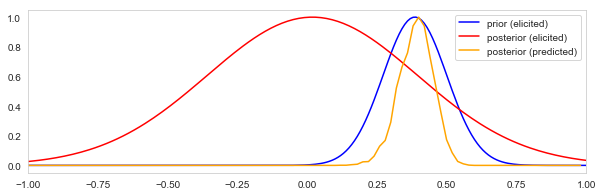

[-0.6013661475781544 0.20799408500085537]
[0.17238678927527662 0.10018856566207901]
0.4


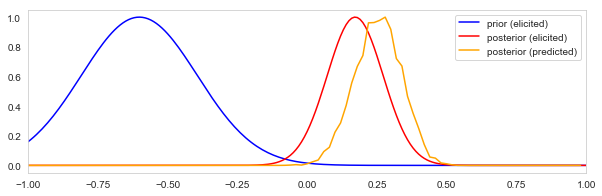

[-0.12295221790167955 0.13231605830550722]
[0.37776573888851184 0.062032972235646744]
0.4


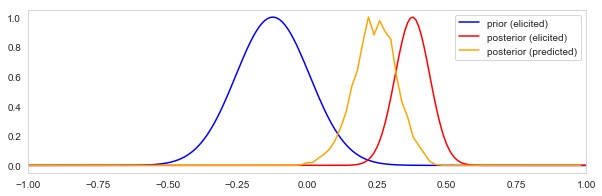

[0.6815910065195376 0.8407955032597688]
[0.9067463067352876 0.8443801813231555]
0.4


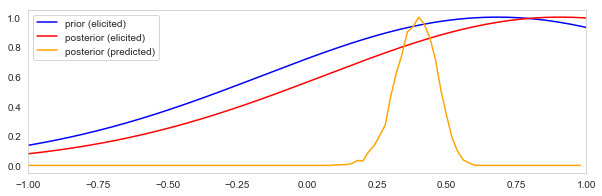

[0.3548004752172622 0.16723599526225452]
[0.28726141147038176 0.6436307057351909]
0.4


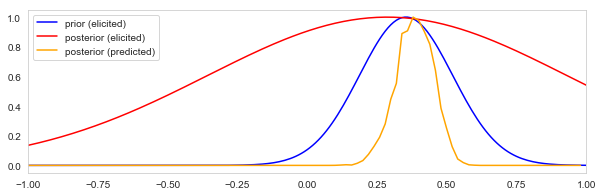

[1.0 0.001]
[-0.3521221690113129 0.5346978463065315]
0.4


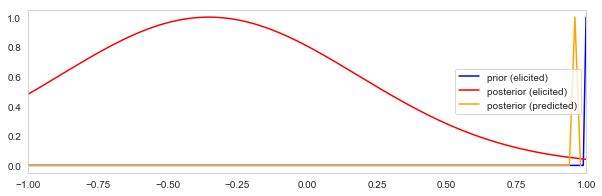

[-0.7157582399742637 0.10230035377634394]
[0.3113827905475577 0.6098418078027503]
0.4


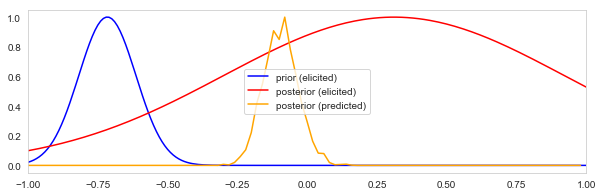

[-0.29657106476784634 0.19894636903442708]
[0.5164028424510165 0.23437095691341053]
0.4


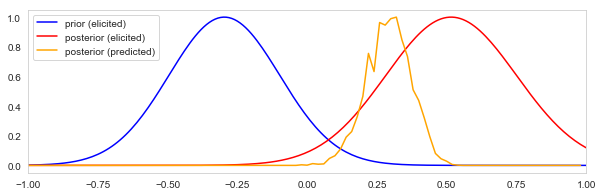

[-0.4452231883918185 0.27738840580409074]
[0.4076469114516215 0.2448444484056763]
0.4


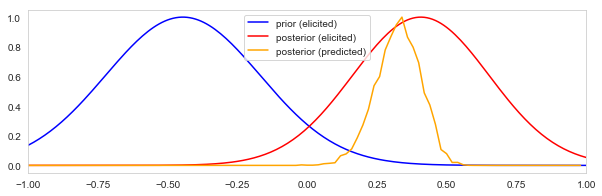

[-0.07900146650729845 0.2837078044286636]
[0.11829374208530186 0.4156258545945929]
0.4


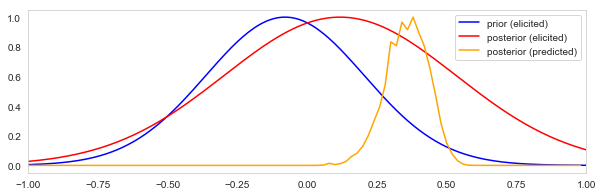

[0.20975838274660766 0.09562134083228858]
[0.36040622940678935 0.2281734707469589]
0.4


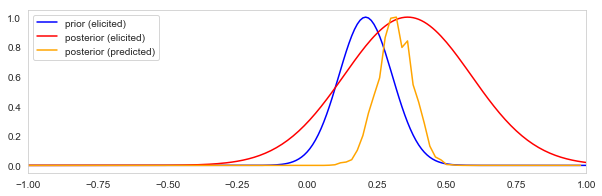

[0.037074254000238005 0.3103591635914469]
[0.4856583431976109 0.1602579032340038]
0.4


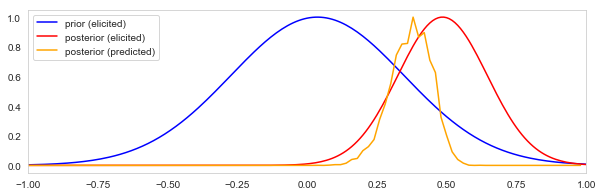

[0.9352845165102096 0.1877763388950195]
[1.0 0.11812172583796432]
0.4


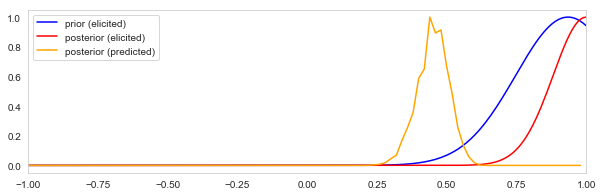

[0.9837863881778596 0.2658209988993728]
[0.9380775108204464 0.17327865524204766]
0.4


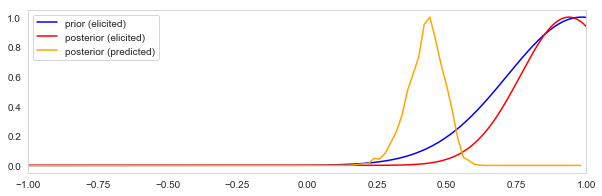

[0.8942429083451335 0.12566222501781654]
[0.2915248638348462 0.16292052045115468]
0.4


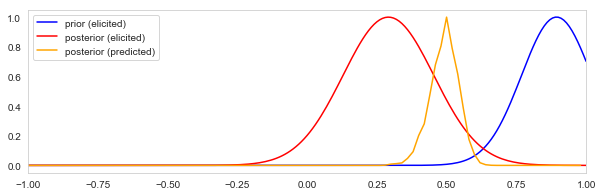

[-0.13837917914601938 0.07636073251667422]
[0.2468559944964979 0.1409631405042195]
0.4


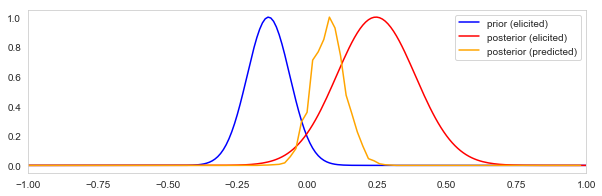

[0.11299912454937378 0.21749404963876495]
[0.4766163628245637 0.22860436331161296]
0.4


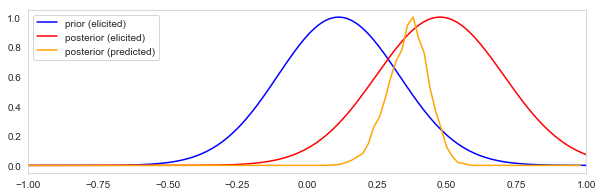

[-0.37644080521951584 0.5865119477793683]
[-0.3239490094291759 0.3752227699132752]
0.4


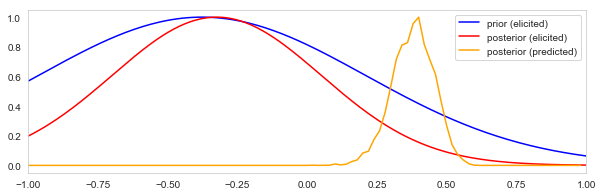

[-0.3020548192721164 0.19287722628862702]
[-0.383228879886554 0.09714249834289926]
0.4


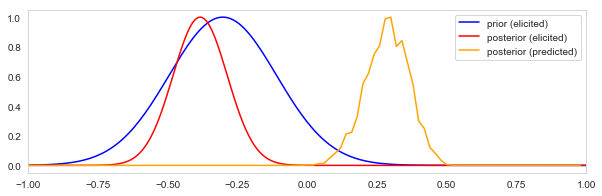

[0.006166838320946111 0.06673011246759111]
[0.1838413743311611 0.14311664242567015]
0.4


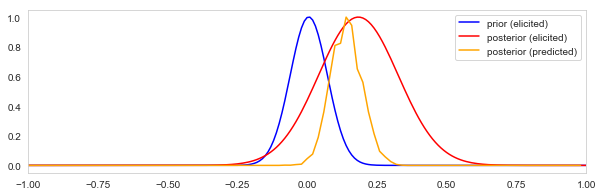

[0.69187313593786 0.15602674309676712]
[0.2443187288737205 0.07252581418771721]
0.4


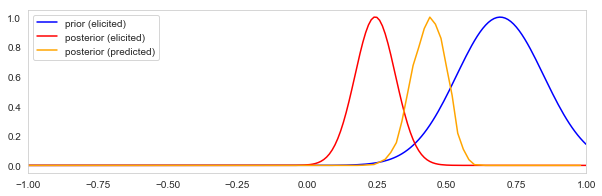

[0.4001027389432399 0.08877540848423095]
[0.6485630667549052 0.19669427969963516]
0.4


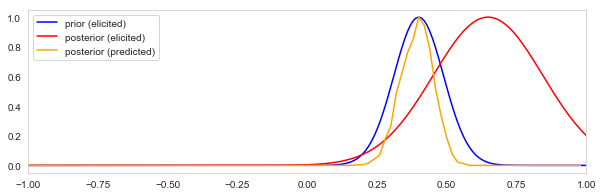

[-0.5713707564118389 0.04748861873179622]
[0.8628476576361386 0.3473498159250673]
0.4


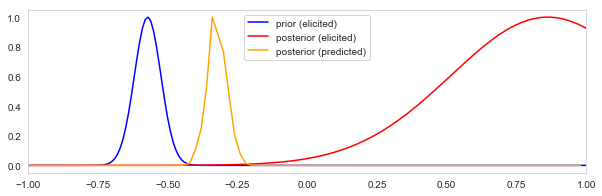

[0.6373962549345378 0.1728888851431919]
[-0.6687040261049431 0.16564798694752847]
0.4


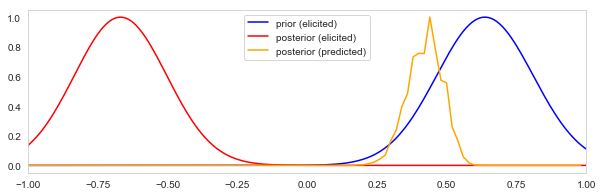

[-0.16648437753708345 0.4167578112314583]
[0.5169742649047488 0.7456083105387806]
0.4


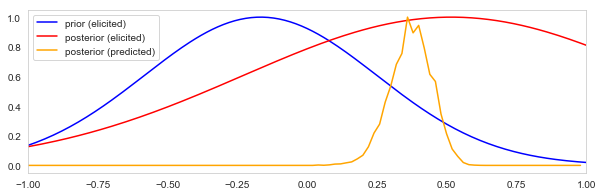

[0.13287855310112606 0.16333891990684324]
[-0.002402299394568264 0.001]
0.4


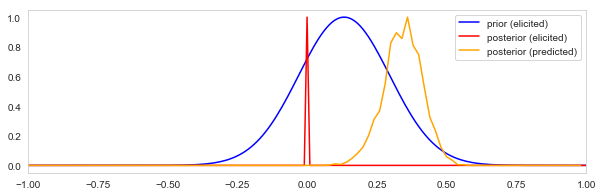

[0.27853735285636994 0.18907039926828695]
[0.7926506365288346 0.27560104167494015]
0.4


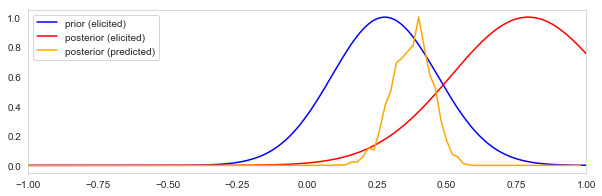

[-0.6748698342897645 0.11292598048127955]
[0.667599132973103 0.3120055868824648]
0.4


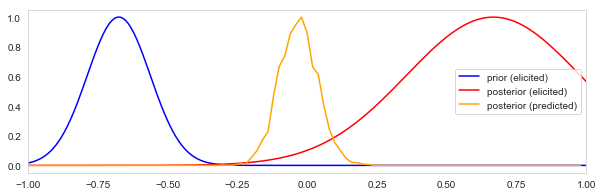

[0.04586960674023266 0.10867326570731003]
[0.5911861319741811 0.18602785792013904]
0.4


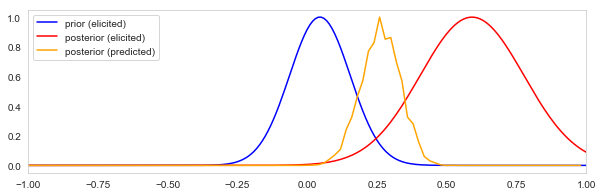

[-0.5854311177531719 0.1758212155931559]
[0.38522338892890573 0.492906583622228]
0.4


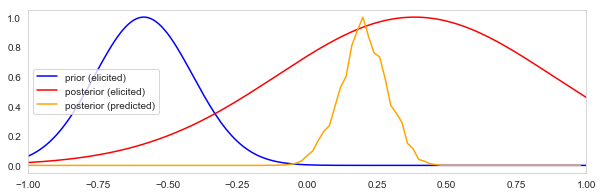

[0.23746409118016956 0.08612488200319458]
[0.35831384755738993 0.11323323590471057]
0.4


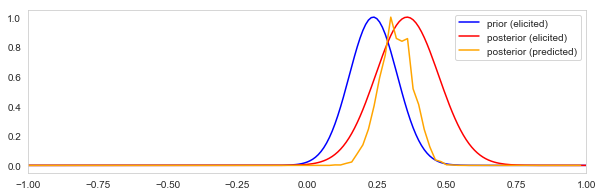

[0.18415353853103134 0.40792323073448433]
[0.16578529170434184 0.41710735414782907]
0.4


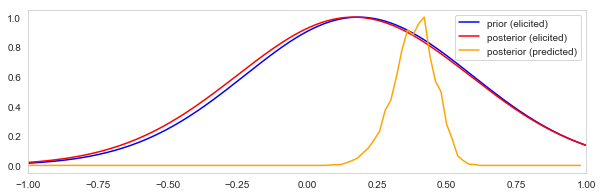

[0.24766292927826086 0.14434033201933383]
[0.29803992308736604 0.10883620990504883]
0.4


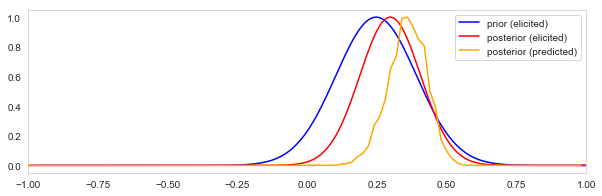

[0.33736727931767163 0.08134768943149029]
[0.004329809604123325 0.21735816433993746]
0.4


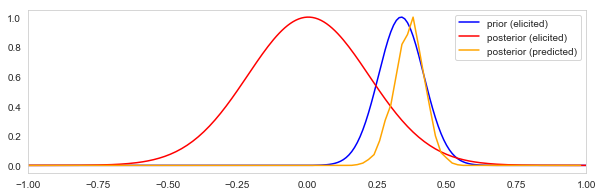

[0.7631917139875708 0.31014458637550546]
[0.5532926638274451 0.7766463319137226]
0.4


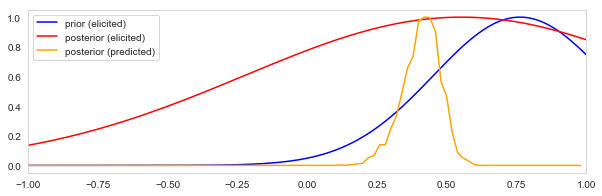

[-0.8836447638937728 0.001]
[-1.0 0.14770469566933253]
0.4


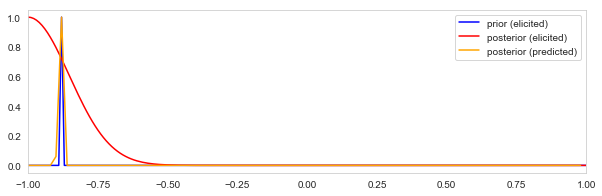

[-0.8533851055628279 0.5540351631284582]
[-0.05564801937123831 0.47217599031438084]
0.4


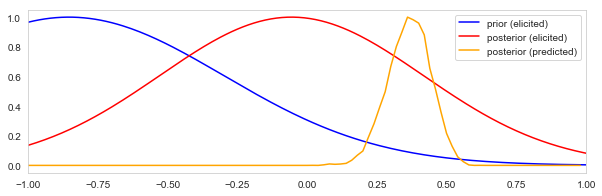

[-0.19777669352273186 0.001]
[0.3872426466569985 0.001]
0.4


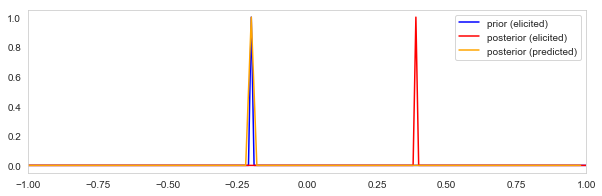

[0.6081603951388166 0.259980793197342]
[0.35625843004295094 0.45505429679917664]
0.4


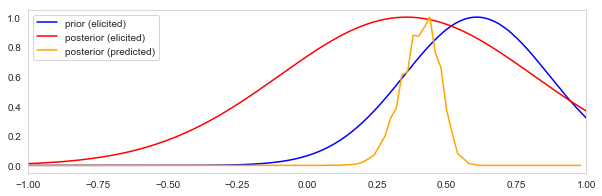

[0.4112693572947468 0.17541916133296542]
[0.6813968805289745 0.15930155973551274]
0.4


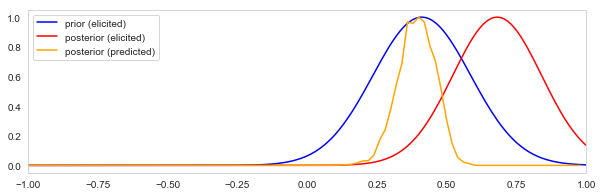

[0.5306167895997331 0.11384754641200992]
[0.1915979717305254 0.3351263412061064]
0.4


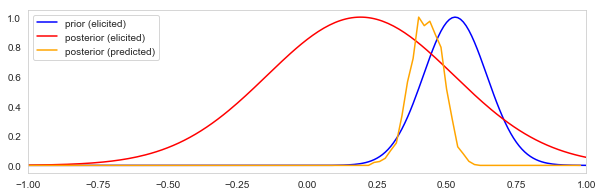

[0.6887462934840585 0.1217065175862625]
[0.18289932287623167 0.06848065728498876]
0.4


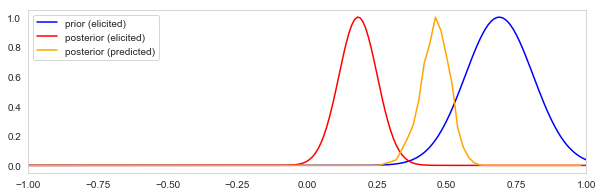

[0.8844905040685218 0.4149797833507949]
[0.4061879291835597 0.29690603540822014]
0.4


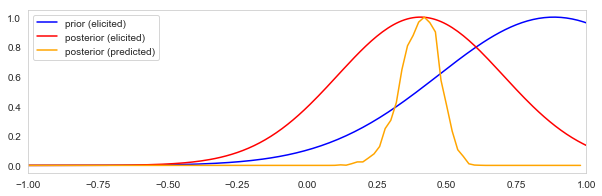

[0.8584591868064932 0.008067557596943553]
[0.7426972761732713 0.03904992241856842]
0.4


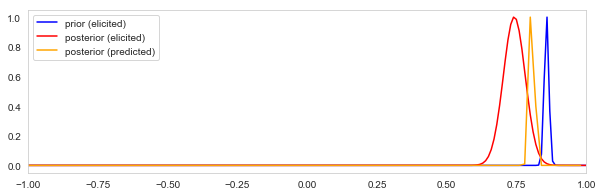

[-1.0 1.0]
[1.0 0.18713415874156436]
0.4


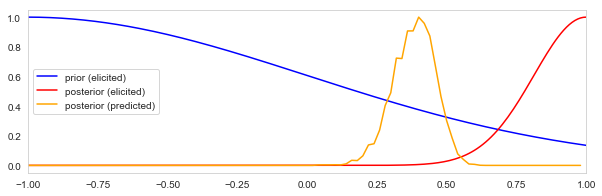

[-0.7312915477862183 0.1497858238451077]
[0.28725221761020103 0.1041308701788003]
0.4


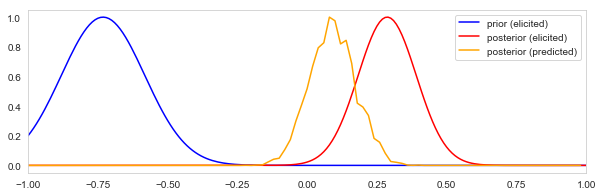

[-0.4676847148322521 0.07497398019517157]
[0.5260382097240568 0.09880108280911115]
0.4


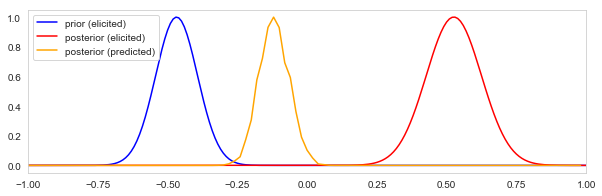

[0.30726410019104944 0.14044223212448903]
[0.3140697749440633 0.11828597955155473]
0.4


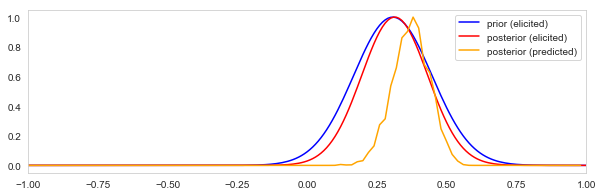

[0.4584856986693315 0.0813905116211181]
[-0.013561167579839885 0.001]
0.4


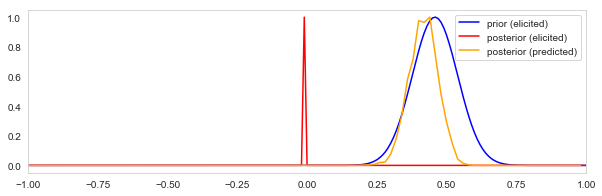

[0.4565912142382369 0.12794362469283993]
[0.2317489686714791 0.11772848292968294]
0.4


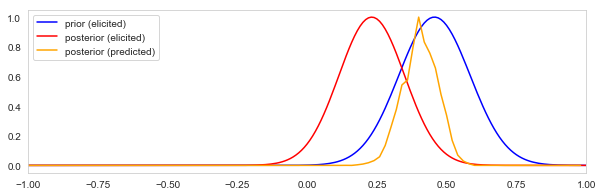

[0.904136115908476 0.09724909678207594]
[0.1748276135521365 0.30173106664383464]
0.4


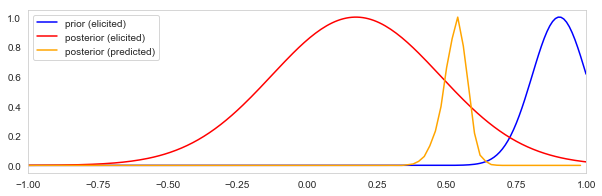

[-0.6982973224187743 0.20298486882971734]
[0.2249849087239979 0.26957137720266644]
0.4


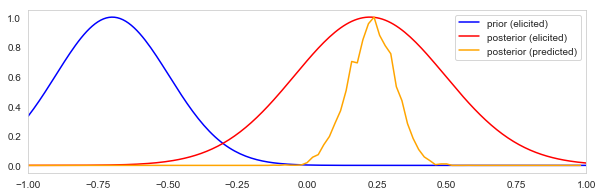

[0.42127292297486063 0.0825323234711306]
[0.5146235691713843 0.1851822244925473]
0.4


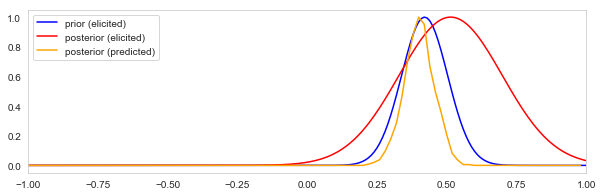

[0.4762120927214024 0.10833529438393463]
[0.1308826506671832 0.08132598351077722]
0.4


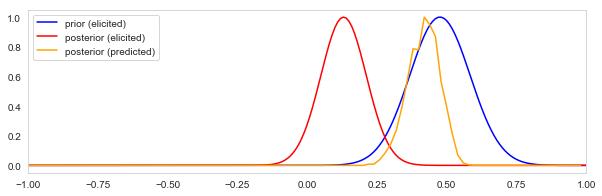

[-1.0 0.08644365157966794]
[-0.5775913159955239 0.15979138028461715]
0.4


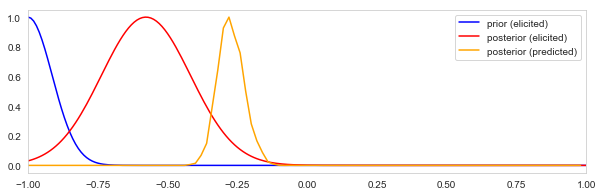

[0.4649808730935989 0.318208235934094]
[0.5789255486629161 0.361267364622602]
0.4


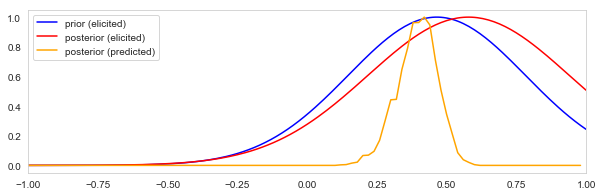

[0.19303010180525848 0.1265019031478011]
[0.2481084483899687 0.13139951099037805]
0.4


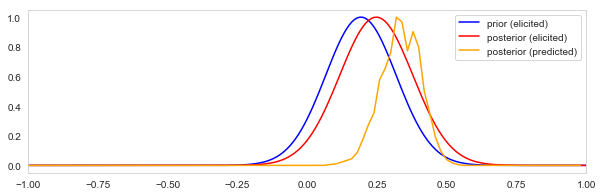

[0.7176149154628968 0.09035567755057539]
[0.7144491172406586 0.08372655249488681]
0.4


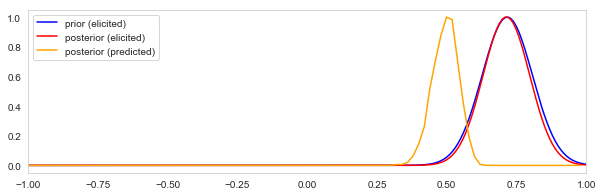

[0.4690585529590214 0.1668445660714555]
[0.19301716627711674 0.039351006256589605]
0.4


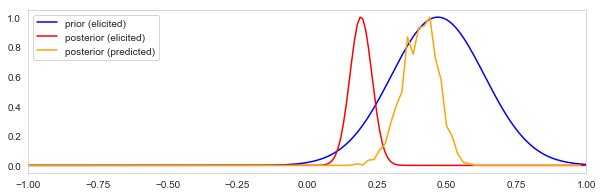

[0.5105133975197236 0.08035508371817901]
[0.8170925800010189 0.01644646443560749]
0.4


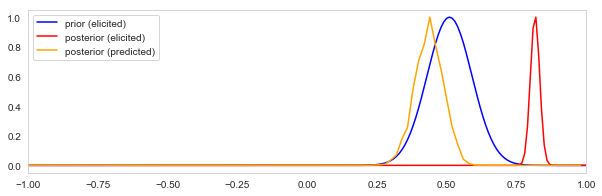

[1.0 0.9093009828992493]
[0.8623236536313349 0.9101803375465636]
0.4


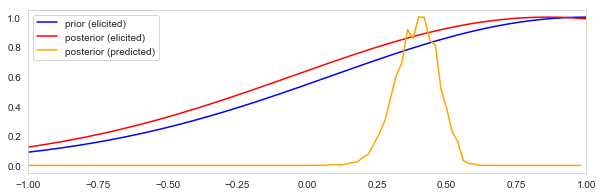

[0.21193063060045286 0.3626674324136663]
[0.2461815629984707 0.17046865845710918]
0.4


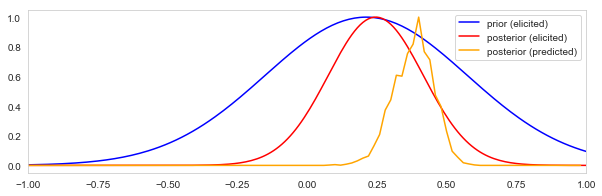

[0.5821596286221379 0.2165602814753949]
[1.0 1.0]
0.4


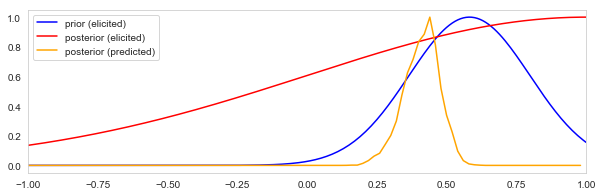

[0.2956412159678956 0.16391078391445038]
[0.15114680437714956 0.15385932355257237]
0.4


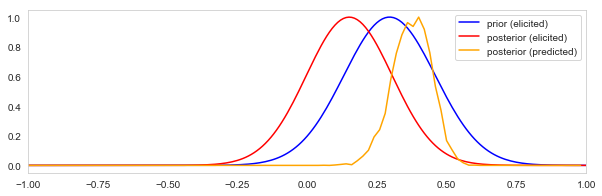

[0.6515960219725423 0.5605779284070089]
[0.7660580648001807 0.8830290324000903]
0.4


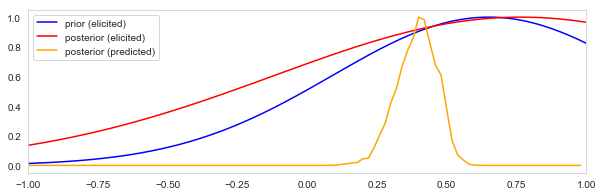

[0.7239440251483169 0.14310702408548526]
[0.2038734580334658 0.080869600080959]
0.4


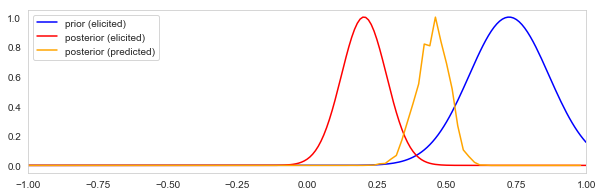

[0.17413708002442885 0.19597406051230926]
[1.0 0.44278537909062454]
0.4


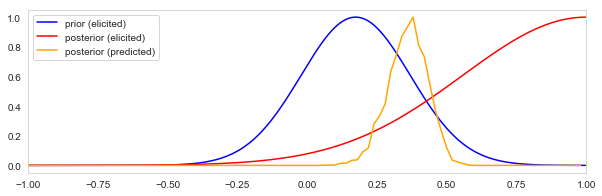

[0.3624688691779647 0.11241709993022608]
[1.0 0.09710718937713081]
0.4


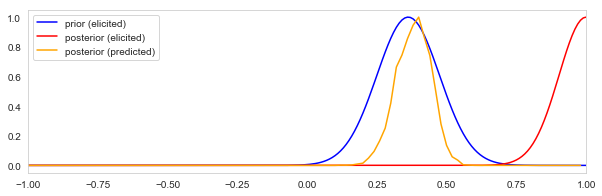

[0.7342774535785528 0.08845233643111028]
[0.6977913612738431 0.3330069230021607]
0.4


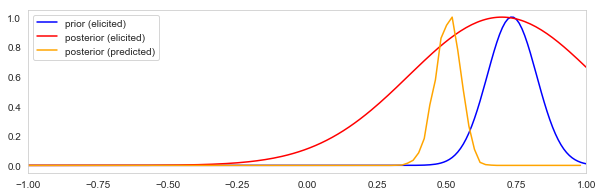

[0.34843386938709386 0.1398699875957593]
[0.3096297090271358 0.09767634582135265]
0.4


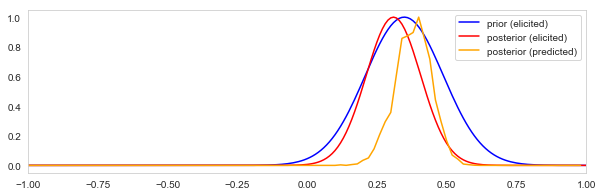

[0.32694736038773353 0.001]
[1.0 0.001]
0.4


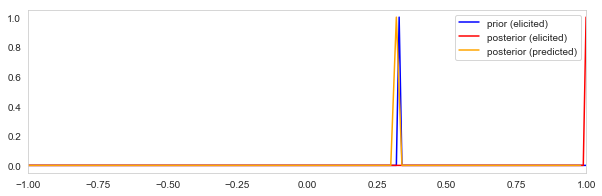

[0.677144112798618 0.838572056399309]
[0.2543018138998083 0.3747459128159605]
0.4


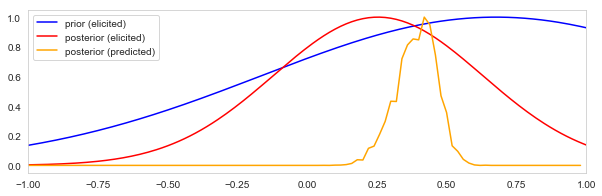

[0.9836716531920482 0.2875207791362726]
[0.05639476197738924 0.1475603372571641]
0.4


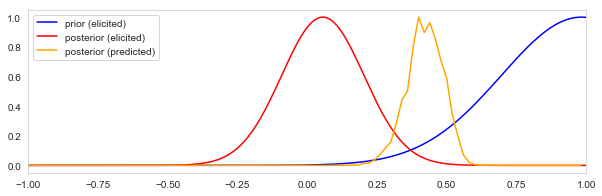

[1.0 0.07373849209792671]
[0.0977698278841268 0.03154542351600831]
0.4


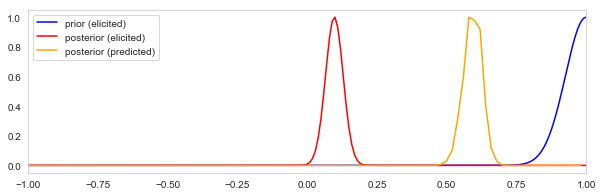

[0.2989550552016942 0.07699963805783927]
[0.16718200365605496 0.13360254369295022]
0.4


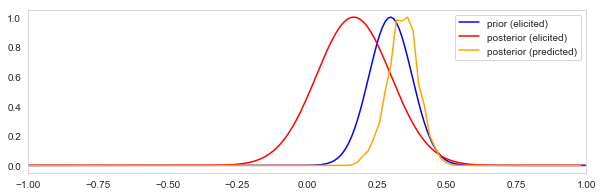

[0.28591795452519353 0.06005973339517348]
[0.15111688582604502 0.07358180148861813]
0.4


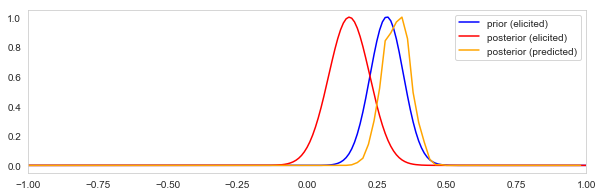

[0.9728163539854116 0.09209791183522376]
[0.9268225426123768 0.25675927146517663]
0.4


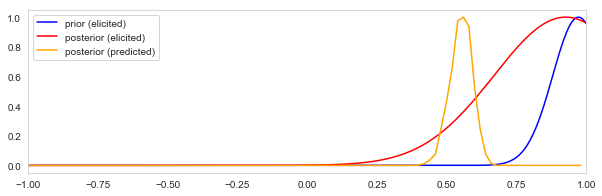

[0.8906350040222195 0.32865751920185204]
[0.9594901370925356 0.35113562869760817]
0.4


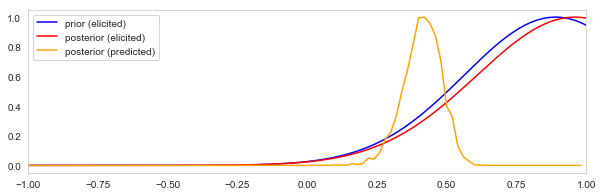

[0.478335460896709 0.07776642802374456]
[0.0111904055173353 0.037061126995842186]
0.4


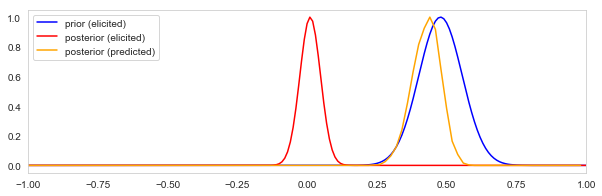

[1.0 0.013636322691027325]
[0.4305620567683055 0.058353647515591245]
0.4


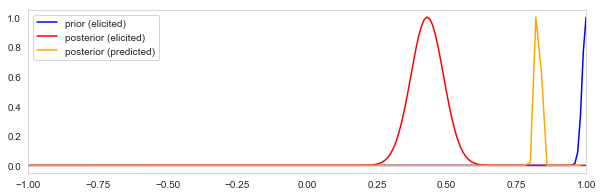

[-0.5076750501293963 0.17630778431707164]
[-0.16254196479338612 0.2293883071071655]
0.4


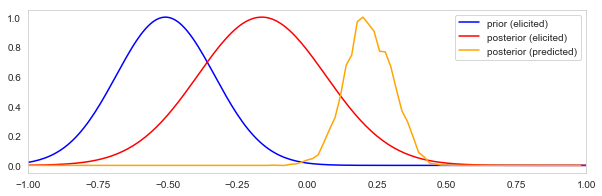

[-1.0 0.32461301133037446]
[0.2567181485179073 0.1422002149956999]
0.4


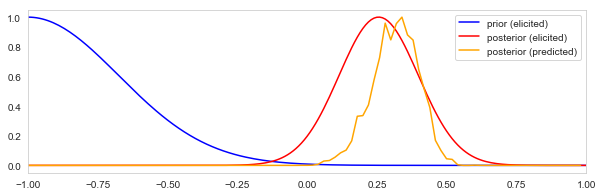

[-0.5357613782351665 0.578076648516524]
[-0.3666583304942763 0.6833291652471382]
0.4


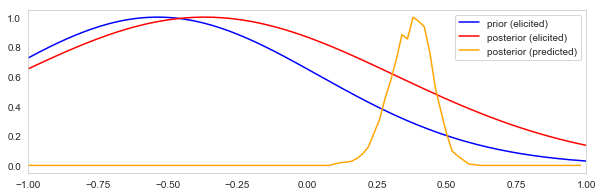

[-0.7714700196484614 0.001]
[-0.7265885295011694 0.001]
0.4


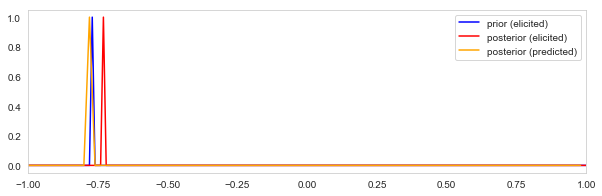

[0.5547406472218268 0.10808454809927259]
[0.8187385705222261 0.09063071473888701]
0.4


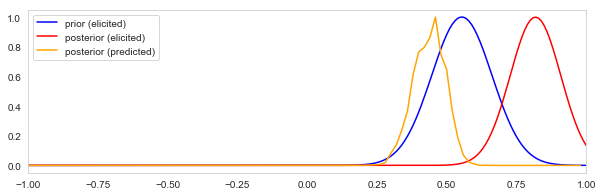

[1.0 0.18652214244724857]
[0.7677714431578087 0.1440675098767661]
0.4


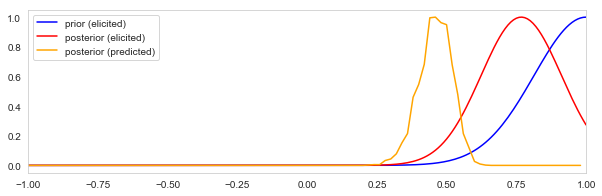

[0.01630962247359791 0.49184518876320105]
[0.2916716317438748 0.3541641841280626]
0.4


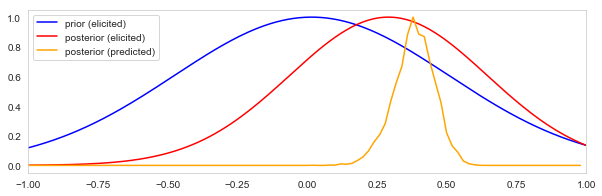

[0.3659548261611021 0.05855254426427224]
[0.3586480540780719 0.1269865762687854]
0.4


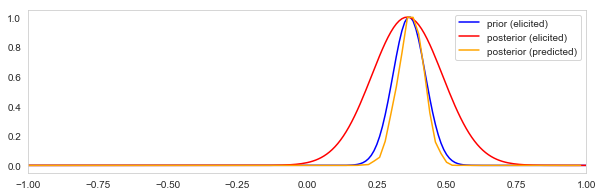

[1.0 0.7364823195187327]
[0.7824165313972489 0.7266705579765215]
0.4


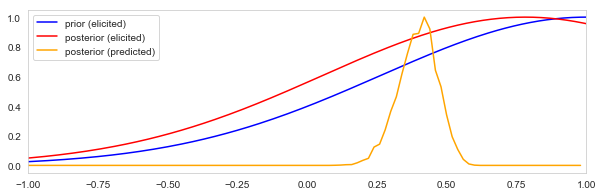

[0.4660200906325278 0.08772776603212051]
[0.11494667763889188 0.15221735542834058]
0.4


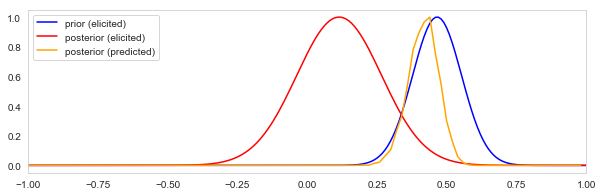

[1.0 0.001]
[0.1344029197729153 0.04568227760935108]
0.4


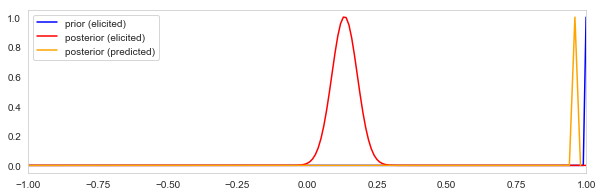

[0.02674522450343897 0.011421358718950114]
[0.0304300290646895 0.004241391881723126]
0.4


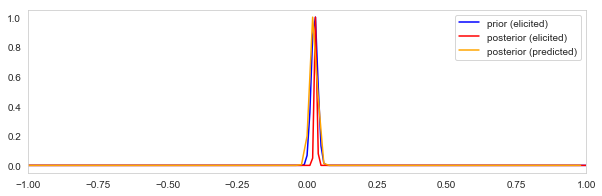

[0.7310557024328486 0.04123657207674969]
[0.404539181894146 0.2013634097629219]
0.4


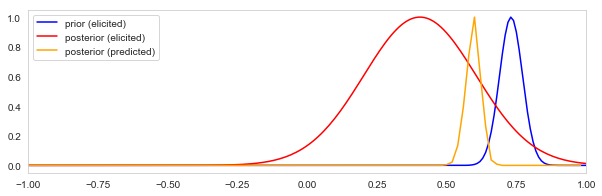

[0.0969472198683654 0.24289529723275896]
[0.197781888775616 0.401109055612192]
0.4


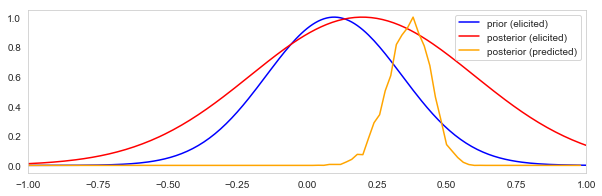

[0.5465788447378441 0.14156637365262115]
[0.2939827680092737 0.1197525085099913]
0.4


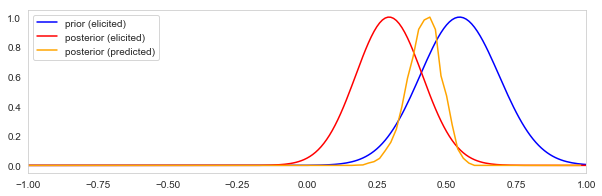

[0.2200820494251039 0.12309192492844481]
[-0.08532359258157496 0.03325767578944347]
0.4


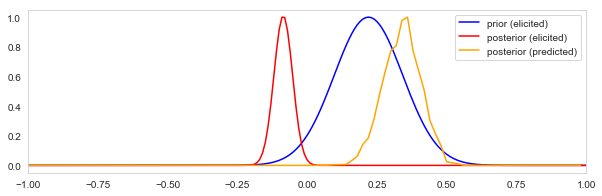

[0.11365232702348793 0.44317383648825603]
[0.4580925188846572 0.3305022389146801]
0.4


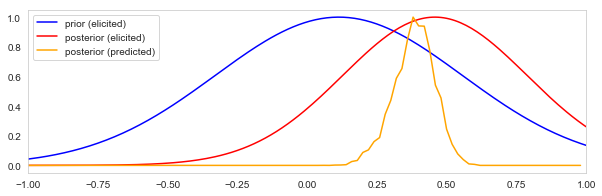

[0.3390026378457276 0.19216538654595183]
[0.09927020136420617 0.1632147521669488]
0.4


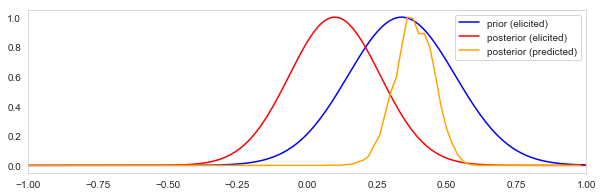

[0.63040732778664 0.11825674545101306]
[0.4016282720676114 0.3183505968953386]
0.4


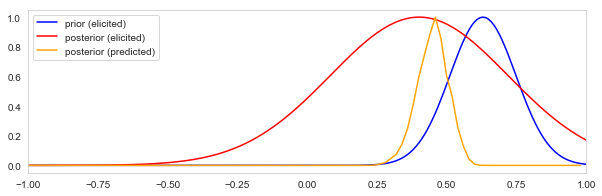

[0.3406960135327153 0.07332560937214372]
[0.1260831599315395 0.08492588851687821]
0.4


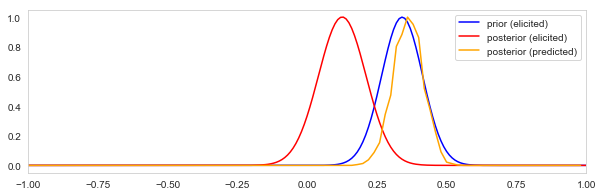

[0.3648241421965868 0.07299947131663173]
[0.5499278772051734 0.09005697936988222]
0.4


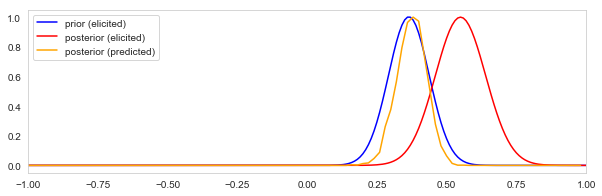

[0.265625034730125 0.14276298273128363]
[0.4339034818354455 0.2830482590822774]
0.4


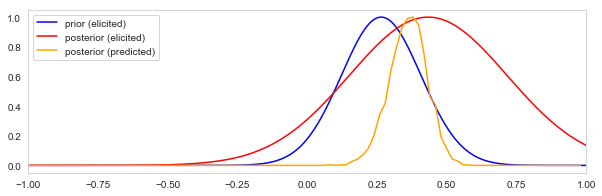

[-0.7994558026590233 0.633287595590897]
[-0.8793988244001878 0.685703133884664]
0.4


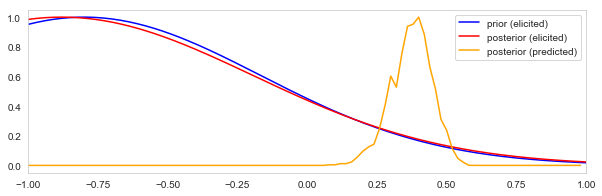

[0.5294905852131138 0.17941330794996824]
[0.537849213910925 0.11592330842923954]
0.4


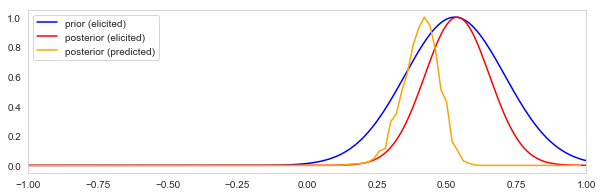

[0.2694707738990474 0.1603957931435799]
[0.6190889105262379 0.19045554473688103]
0.4


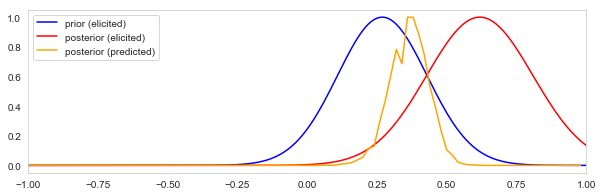

[0.7312484637989396 0.04375811108664496]
[0.8503649832121116 0.03992240989071072]
0.4


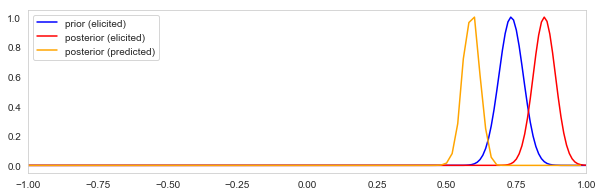

[-0.6759153591319742 0.005589370574416053]
[-0.1222551137391703 0.04633290263072257]
0.4


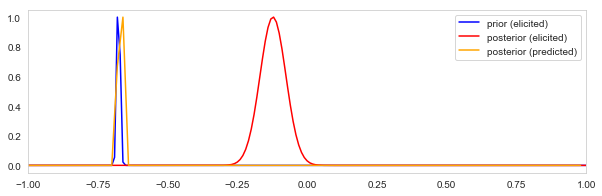

[1.0 0.10832734315778891]
[0.24425862350014005 0.16571751607905671]
0.4


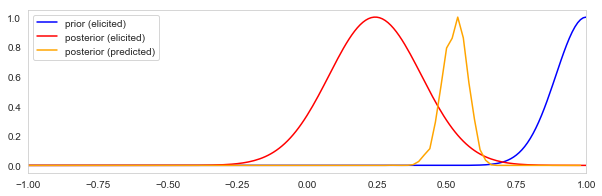

[0.0011773989104970628 0.04681059411726637]
[0.3352602724298599 0.15864487706638664]
0.4


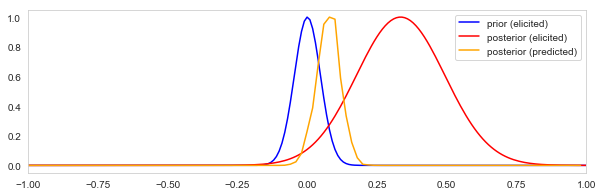

[0.4002060810067187 0.18863081808230256]
[0.04123083707580788 0.47938458146209606]
0.4


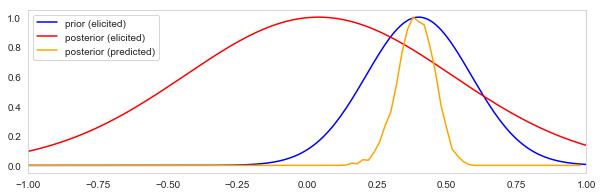

[0.4950363985599529 0.03711859345558435]
[0.15371163628876805 0.05001341810949789]
0.4


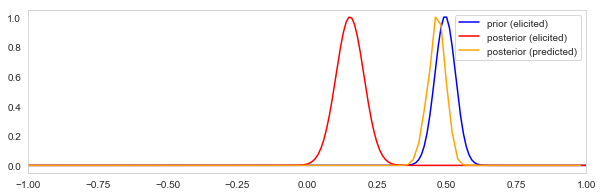

[0.5557847654356247 0.006207448983424846]
[0.7781628995233809 0.11091855023830954]
0.4


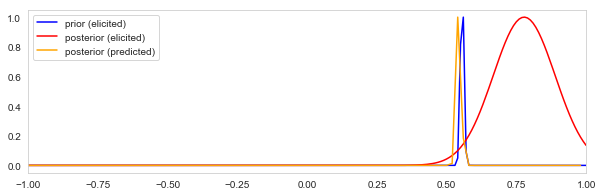

[0.3603956435314771 0.1988862485932216]
[-0.030024913999205764 0.5150124569996029]
0.4


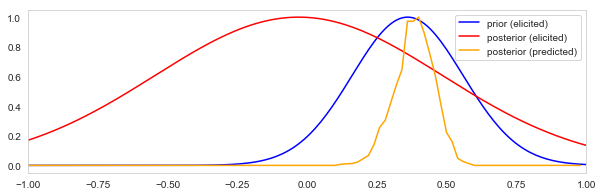

[0.3073466932324451 0.17287286025128276]
[0.5727071066930374 0.10694116147052912]
0.4


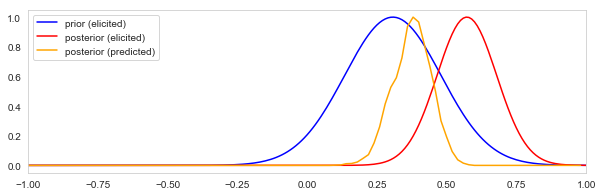

[0.6943750071030821 0.13537237600437935]
[-0.03090560948297844 0.2946691560869463]
0.4


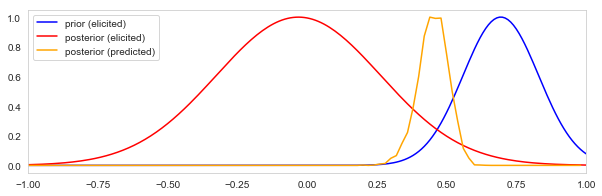

[0.6928001323769135 0.15359993381154324]
[-0.021536105000316 0.46021457889119033]
0.4


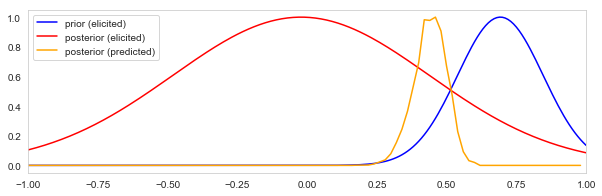

[0.8786546431970295 0.4752347656782985]
[-0.6848200085431397 0.2828832238623247]
0.4


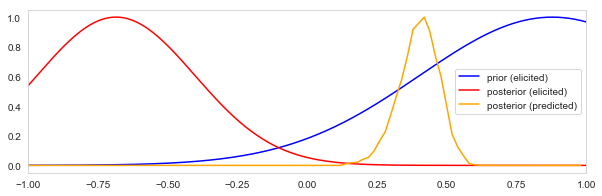

[0.07397820975507963 0.24317452438989096]
[0.4230565641891426 0.12837507255198954]
0.4


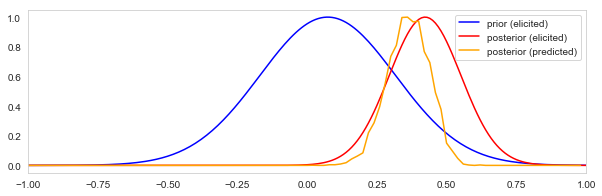

[-1.0 1.0]
[-1.0 0.6720620352216903]
0.4


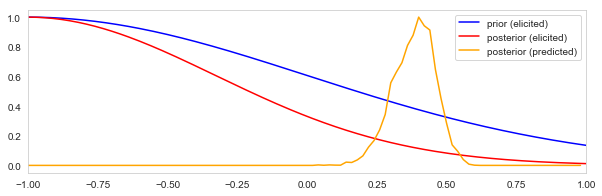

[0.21633573581126986 0.055790764081818045]
[0.26545510321252075 0.0467332829362468]
0.4


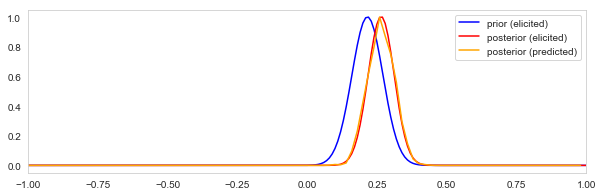

[0.23505211776699356 0.19092972694137533]
[0.401640497090191 0.2991797514549045]
0.4


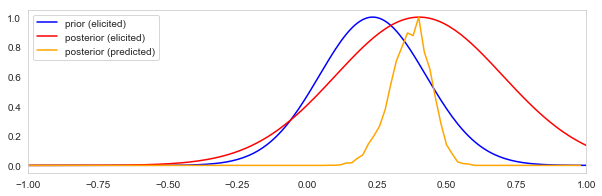

[0.1814796133441192 0.25734100920405206]
[-0.2055399936343245 0.3972300031828378]
0.4


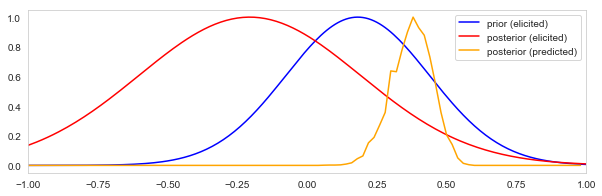

[-0.5817583753875744 0.6035460398469559]
[0.5160764309024743 0.24196178454876283]
0.4


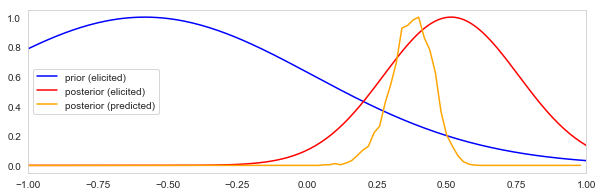

[1.0 0.1528785438882453]
[1.0 0.6064058659658552]
0.4


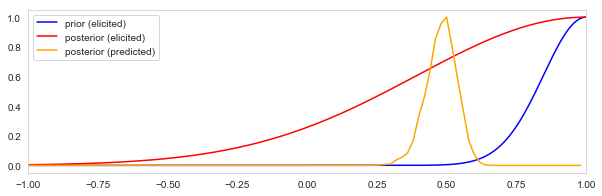

[0.44896487674116825 0.1023931979493759]
[0.08539571682764803 0.07082916038847309]
0.4


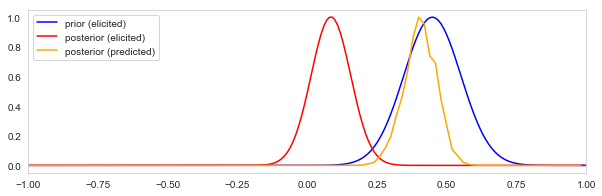

[0.8571389488624592 0.07165279255036439]
[0.14880538399129414 0.04021448405208562]
0.4


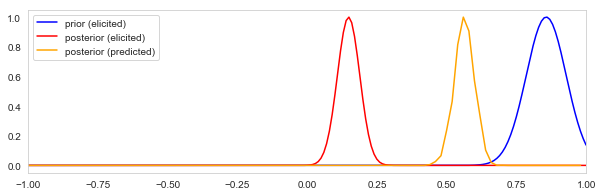

[0.6829340819827827 0.001]
[0.09327782387344484 0.001]
0.4


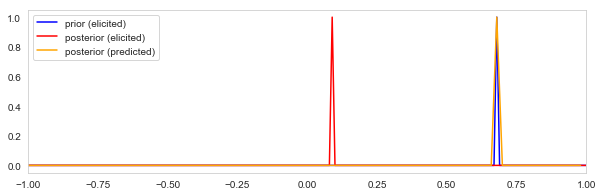

[0.35271205016276364 0.1387666076196521]
[-0.019028399809192686 0.46874650792599504]
0.4


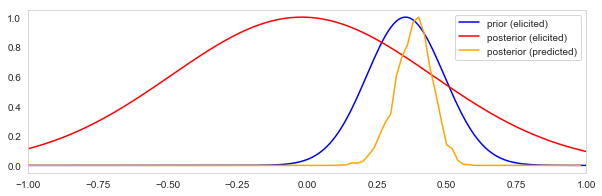

[0.5797456765795129 0.12918199645041167]
[0.1853159116532208 0.3273055438057002]
0.4


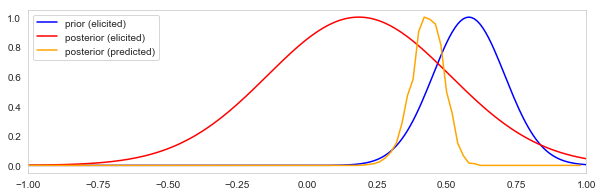

[0.6782351617929909 0.1803127059589964]
[0.42656586422632303 0.1376136293064829]
0.4


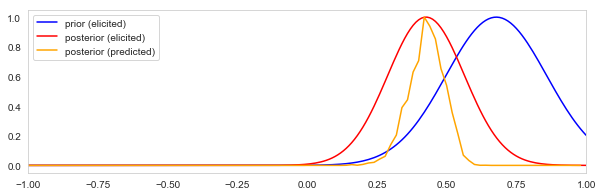

[0.4240923870682967 0.0784733452397979]
[-0.00441287999111184 0.0565901329069477]
0.4


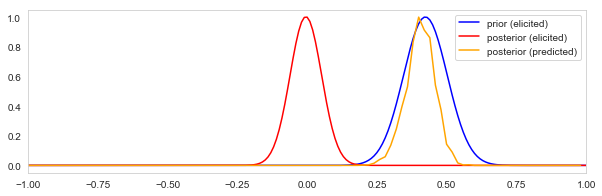

[-0.5703237137268261 0.21483814313658708]
[0.344956647946427 0.32752167602678656]
0.4


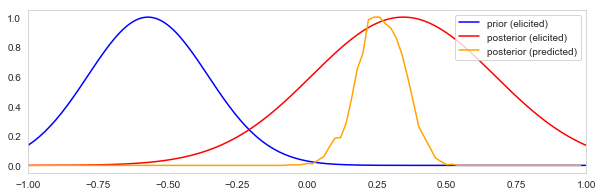

[0.17005975936280482 0.12087486004729811]
[-0.9082503404581932 0.05763012736066131]
0.4


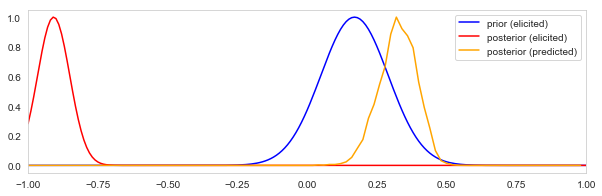

[-1.0 0.4184249663212155]
[0.12296785694627 0.438516071526865]
0.4


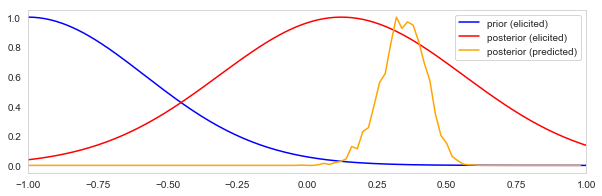

[0.05917727706649356 0.5295886385332468]
[0.0800743557627801 0.1629790886589253]
0.4


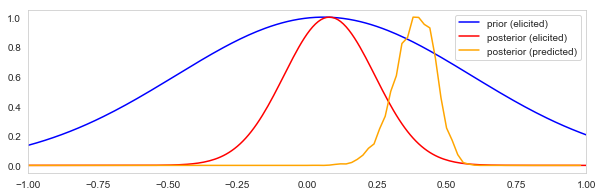

[0.7023508997817731 0.07335101534932897]
[0.13596194508082604 0.062262554066096154]
0.4


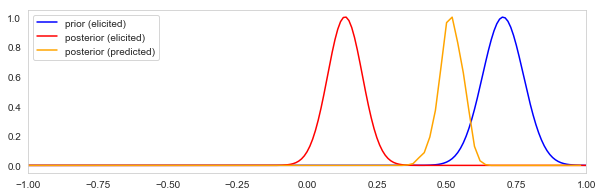

[0.17880962329066707 0.05674391749856611]
[0.32362137826825 0.330513348266899]
0.4


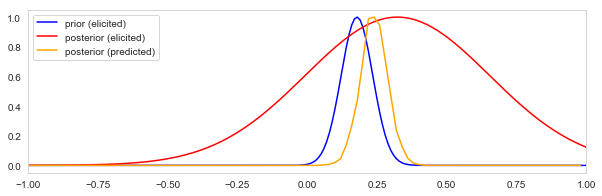

[-0.4084260180129269 0.15600827511215218]
[1.0 0.3858541536220934]
0.4


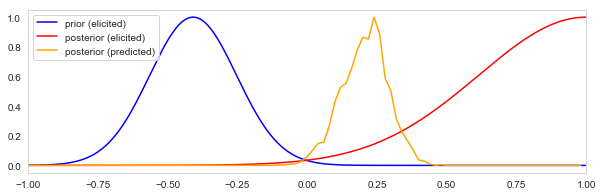

[0.8832536360949286 0.08003668754206794]
[0.1846521549439486 0.15049520343362152]
0.4


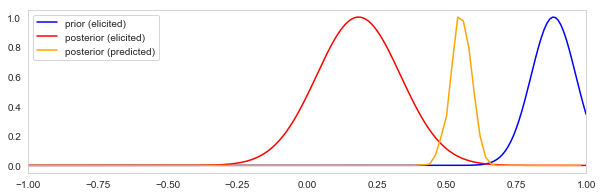

[-0.20848835654409556 0.2868903880958291]
[0.32507064369137706 0.1589310713295149]
0.4


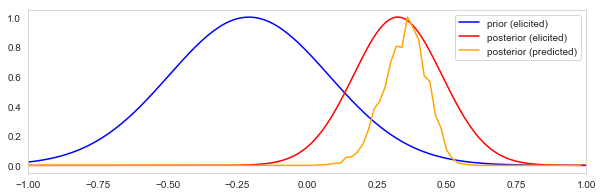

[-0.6763165288085664 0.08157164314761822]
[0.4690677283035674 0.041711716654406844]
0.4


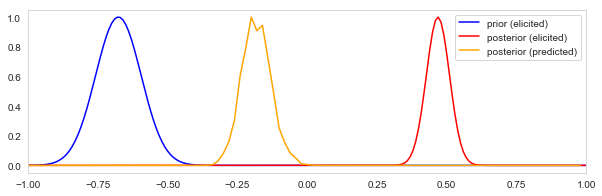

[0.8374099489789992 0.07558581381611362]
[0.399819137895274 0.30009043105236305]
0.4


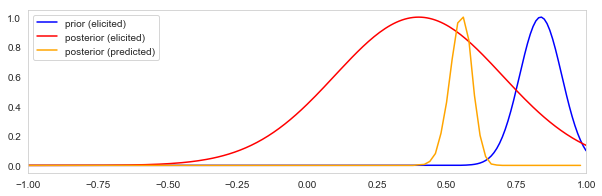

[0.7321294079573066 0.5216033077260382]
[-0.06365739448253094 0.4023956284642568]
0.4


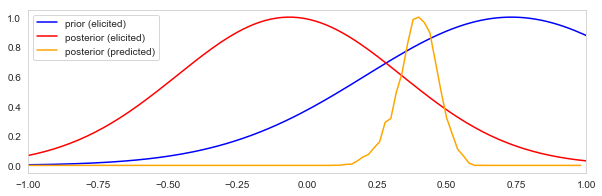

[1.0 0.2838006549444084]
[0.26148633973625696 0.31688908935944887]
0.4


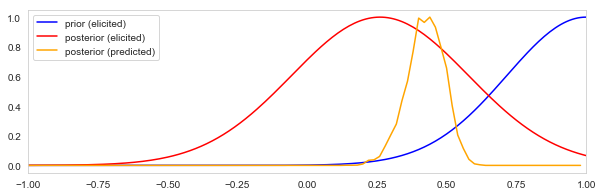

[0.6835007799493065 0.06533484197872452]
[0.4129439288260493 0.09864925322292492]
0.4


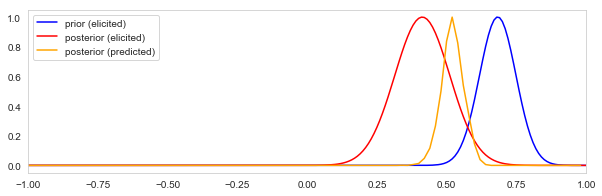

[-0.9947495574116918 0.6646731780002777]
[-1.0 0.001]
0.4


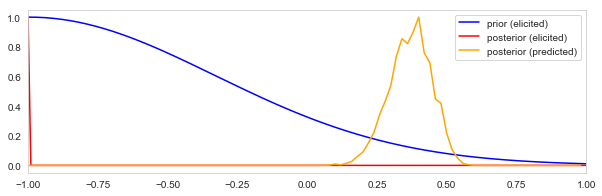

[0.5391830394054221 0.0291774956547734]
[0.7034803386908612 0.00371520837559558]
0.4


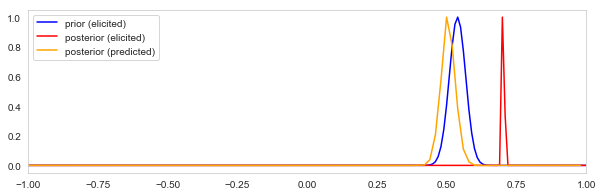

[-0.5220002796538399 0.0780901662868726]
[0.3769934063327247 0.11821874244343056]
0.4


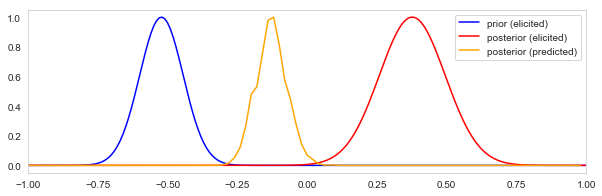

[-0.1326696708517407 0.1917495957385241]
[0.14807943939780133 0.25265336066413013]
0.4


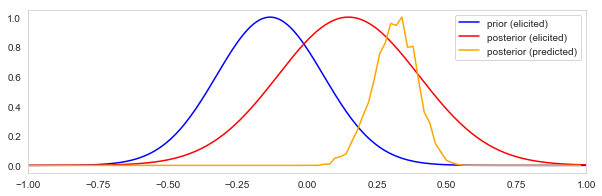

[-0.34378327445927065 0.05524079864511883]
[-0.7883005509520924 0.018668647074444045]
0.4


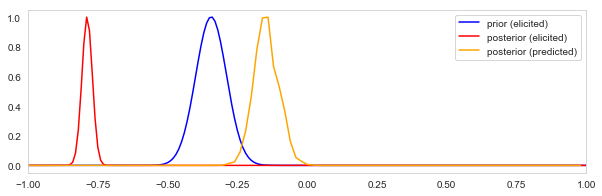

[-0.3869259021790419 0.43007380413279683]
[0.17241436746280714 0.17252047404484872]
0.4


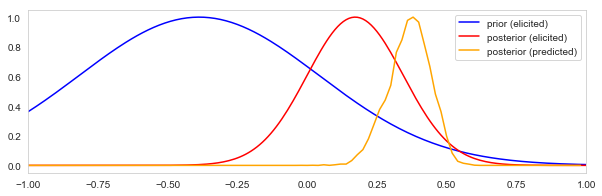

[0.3602783831836043 0.18372675555229212]
[0.256584700090168 0.08508935162315837]
0.4


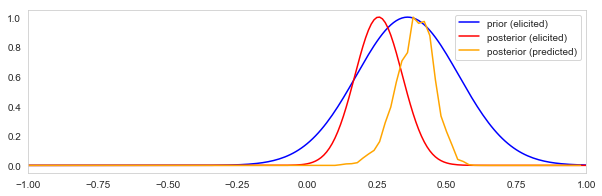

[-0.1939973516629503 0.1230177401585838]
[0.7443272846604556 0.11346059965351801]
0.4


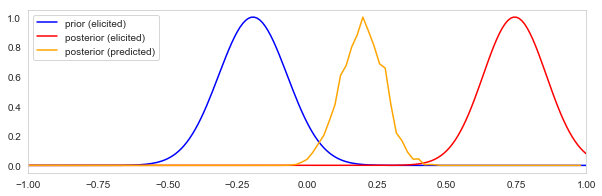

[-0.23663810922877704 0.06537516671267862]
[-0.2888381534184305 0.08204150759850815]
0.4


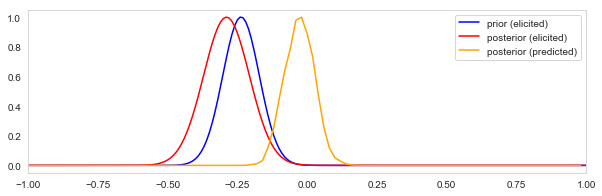

[0.7593534681653358 0.09564680752886451]
[1.0 0.2189435695271088]
0.4


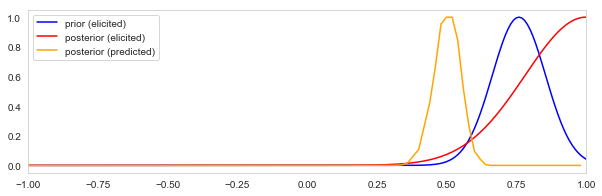

[-0.3184802384668297 0.6592401192334149]
[0.5212741332073418 0.32668318415692255]
0.4


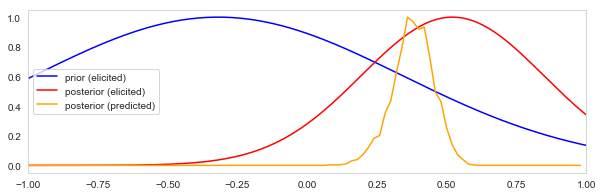

[0.6339206563794046 0.14157427060055466]
[0.1031208031012496 0.4484395984493752]
0.4


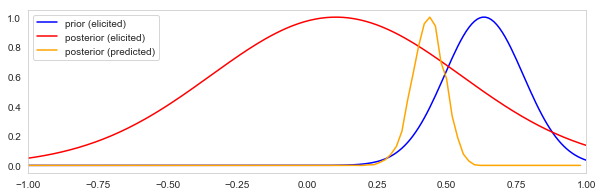

[0.5684501904768418 0.08259918402666355]
[0.8501675451580121 0.11733180627423173]
0.4


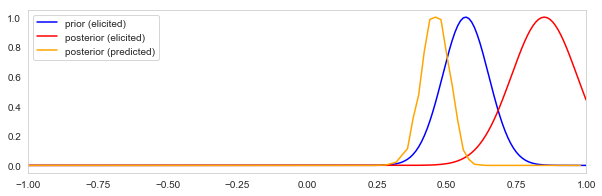

[0.638024179758802 0.08680879728410007]
[0.3312419136685192 0.055365159784703466]
0.4


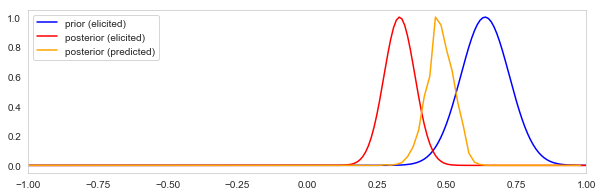

[-1.0 0.001]
[1.0 0.3138606596105965]
0.4


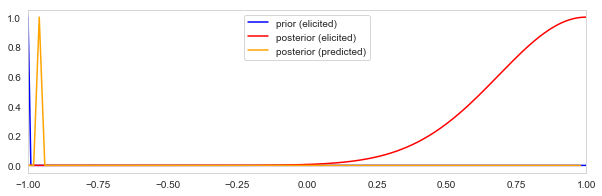

[-0.2341437854051644 0.15267078024140743]
[0.4143798467701749 0.29281007661491254]
0.4


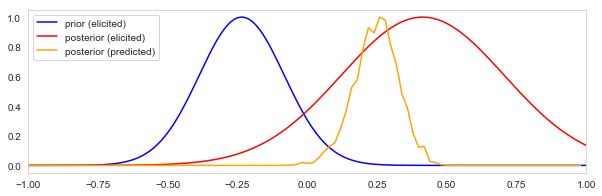

[0.6625432690886375 0.21043541824976109]
[1.0 0.3601621652953193]
0.4


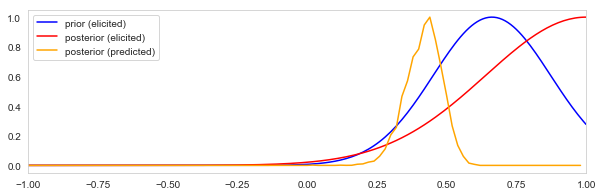

[-1.0 0.818919000202934]
[0.8204107867863326 0.9102053933931663]
0.4


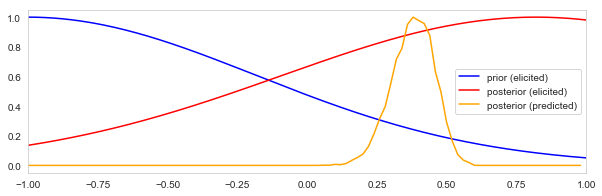

[0.5549361690194738 0.09859177072591388]
[0.9871861519783118 0.09698777574277184]
0.4


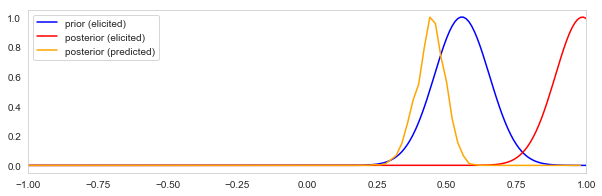

[1.0 0.001]
[1.0 0.07008921685742087]
0.4


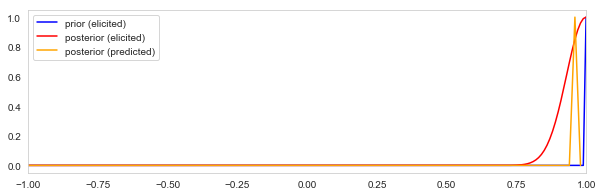

[1.0 0.14480357343977523]
[1.0 0.262595449732132]
0.4


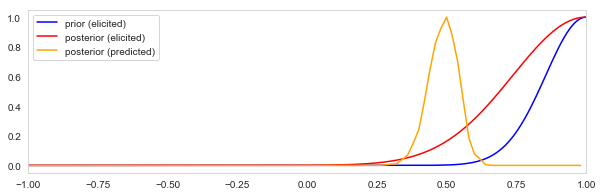

[-0.481357075817137 0.10347309042268862]
[0.7472902706515292 0.1263548646742354]
0.4


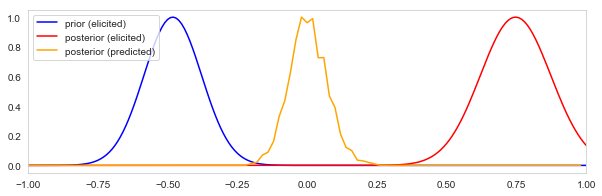

[0.5434235236139013 0.1500447829861249]
[0.7173063806161486 0.06398271340786355]
0.4


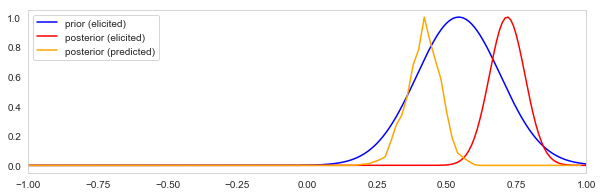

[0.5478625863601168 0.22552068419573879]
[0.017467129599398445 0.07429775690060647]
0.4


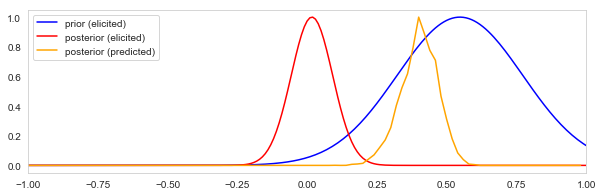

[0.6775066703846411 0.10357019340953133]
[0.23889586402503735 0.09705779441027741]
0.4


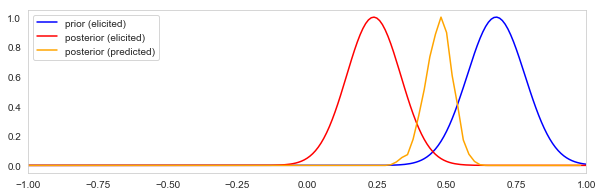

[0.3954195580510021 0.48097292924314516]
[0.7347258325617121 0.6024458769699184]
0.4


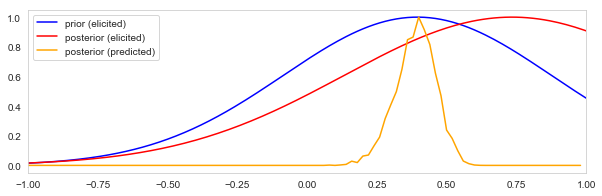

[0.3972630872601599 0.14280890056395779]
[0.2671465254020517 0.3664267372989741]
0.4


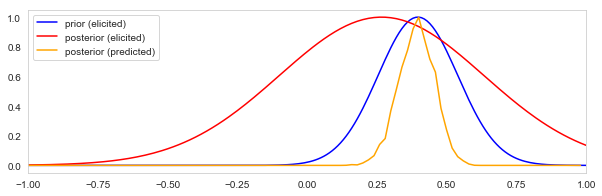

[0.5800348541575968 0.12472264329431626]
[0.3278194249782005 0.12845618021769167]
0.4


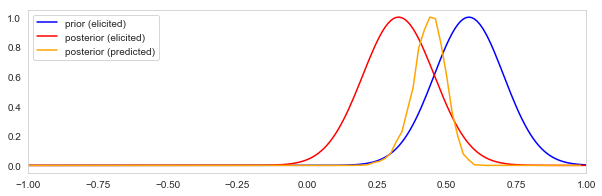

[0.6552813981087051 0.13519485908217183]
[0.05557477823272716 0.09965731873868955]
0.4


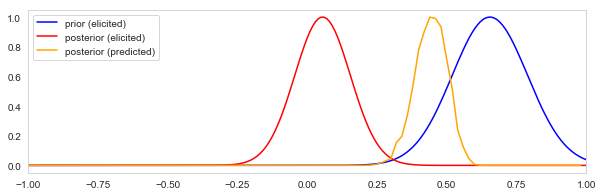

[0.8600301005506745 0.9300150502753373]
[-1.0 1.0]
0.4


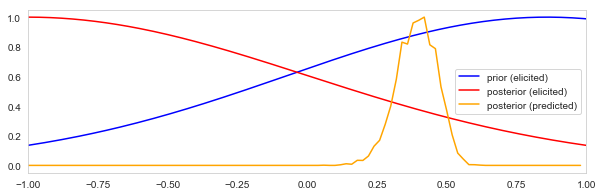

[-0.6148919523440091 0.19255402382799547]
[-0.181601760957586 0.2833097552903868]
0.4


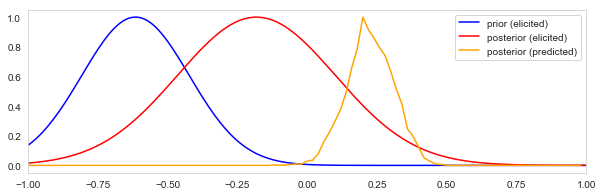

[0.3638521658855956 0.09149217587734379]
[0.38411566917849305 0.10695193609232889]
0.4


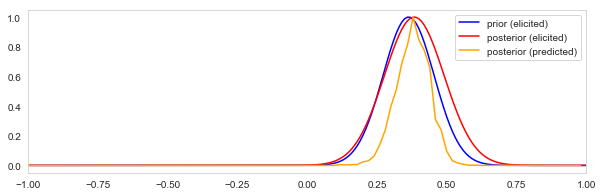

[0.8172813554607727 0.14706199963021926]
[0.28824360066266963 0.484852281096281]
0.4


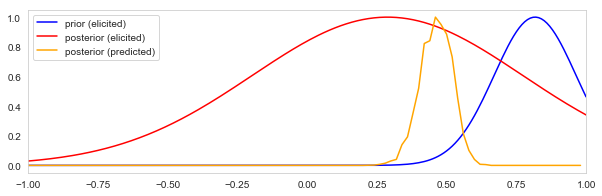

[0.06880412816262528 0.3508350220288935]
[0.13923218241366508 0.13164070081935142]
0.4


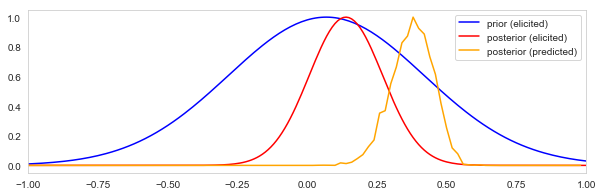

In [ ]:
for i, row in aggdf[aggdf.vars=='Immigrant population_Economic growth'].iterrows():

    normal_prior = row[['prior_belief', 'prior_sd']].values
    normal_post  = row[['post_belief', 'post_sd']].values
    print(normal_prior)
    print(normal_post)
    #print(np.round(normal_prior, 2))
    #print(np.round(normal_post, 2))
    print(row['pop_corr'])

    fig, ax = plt.subplots(figsize=(10,3))

    xs = np.arange(-1, 1.01, .01)

    prior = norm.pdf(xs, normal_prior[0], normal_prior[1])
    prior = prior/prior.max()

    post = norm.pdf(xs, normal_post[0], normal_post[1])
    post = post/post.max()


    ax.plot(xs, prior, color='blue', label='prior (elicited)')
    ax.plot(xs, post, color='red', label='posterior (elicited)')

    pred = predictions[(row['usertoken'], row['vars'])]['pred']
    
    hist = np.histogram(pred, bins=100, range=(-1, 1))
    ax.plot(hist[1][:-1], hist[0]/hist[0].max(), color='orange', label='posterior (predicted)')

    ax.set_xlim(-1, 1)
    #ax.hist(tr['r'])
    ax.legend()
    ax.grid(False)

    plt.show()

In [ ]:
var_sets

['Weight_Price',
 'Temperature_Crime rate',
 'Yearly income_Height',
 'Exercise amount_Body weight',
 'Temperature_Sales of Mittens',
 'Government spending_Budget deficit',
 'Immigrant population_Economic growth',
 'Income tax rate_Poverty rate',
 'Labor union participation_Corporate profits',
 'Vaccination rate_Rate of illness']

[1.0 0.5102565667903919]
[1.0 0.4091717952502222]
-0.9


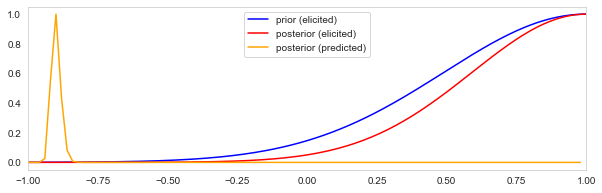

[-0.771174210341758 0.06133976480680026]
[-0.9333237409486412 0.03333812952567938]
-0.9


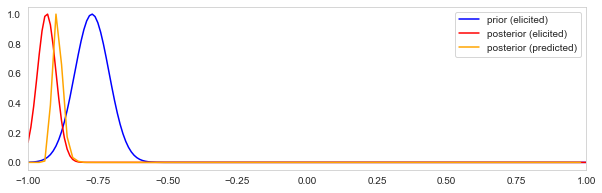

[-0.7752806649004231 0.0645532723569342]
[-1.0 0.001]
-0.9


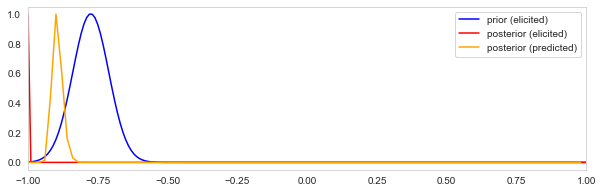

[-0.5375668899583721 0.1012401093119546]
[-0.5160921140268218 0.10267305904241675]
-0.9


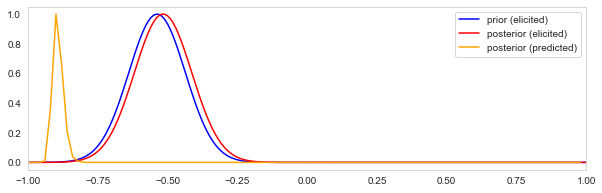

[-0.7786945938317622 0.06849384309940648]
[-1.0 0.04089580192256059]
-0.9


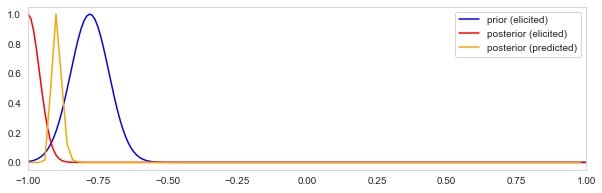

[-1.0 0.031576202192484415]
[-0.9309731651923584 0.03451341740382091]
-0.9


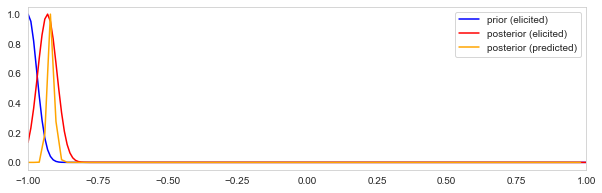

[-0.4792214925192813 0.13056879301275442]
[-1.0 0.04279410289256019]
-0.9


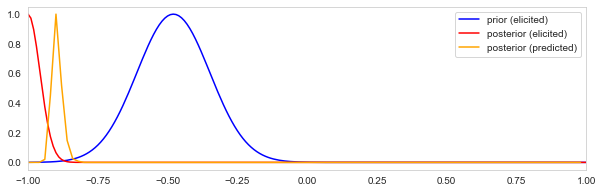

[1.0 0.03774414842760182]
[-0.9381307549418996 0.07352848233770959]
-0.9


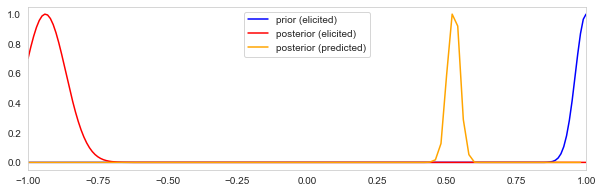

[-1.0 0.08319519487069843]
[-1.0 0.06763460181314862]
-0.9


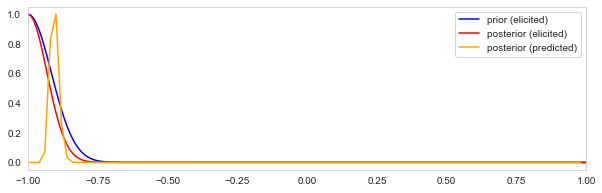

[-1.0 0.001]
[-1.0 0.001]
-0.9


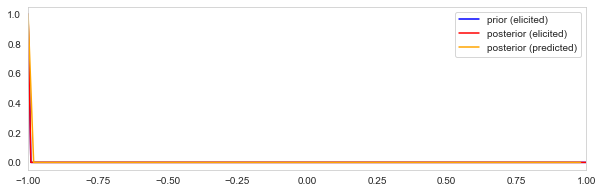

[-0.6706920260188403 0.16465398699057987]
[-0.7139160175708819 0.07863143061636135]
-0.9


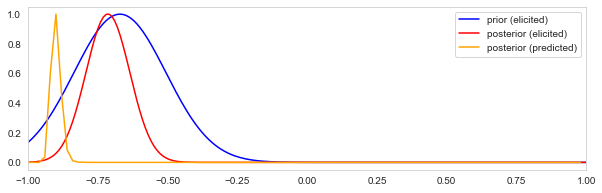

[-0.6764720639109654 0.16176396804451734]
[-0.9371640270015704 0.03141798649921479]
-0.9


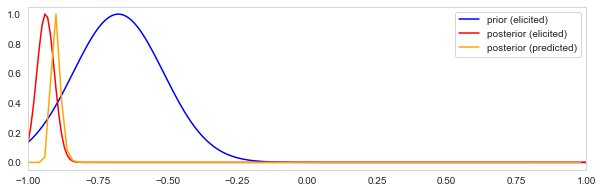

[0.7315056597856179 0.24052099719369519]
[-0.5544878755393832 0.15692647543680593]
-0.9


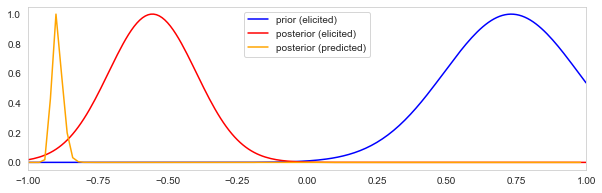

[0.8127033612217329 0.1236830871897654]
[-0.8515910051675859 0.07515632403864414]
-0.9


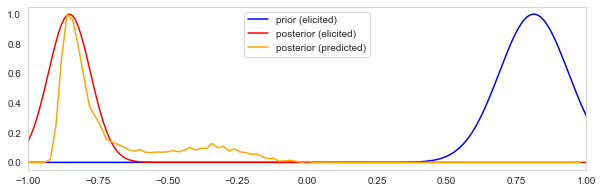

[-0.5633454179292252 0.08169541191059115]
[-1.0 0.09658740455554693]
-0.9


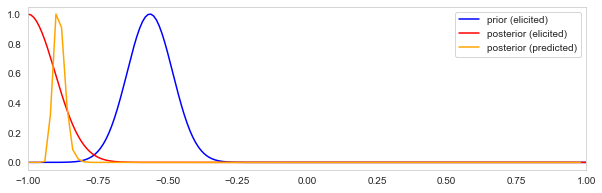

[0.02227944321005526 0.05108080815183334]
[0.027712150259577184 0.05380547460697549]
-0.9


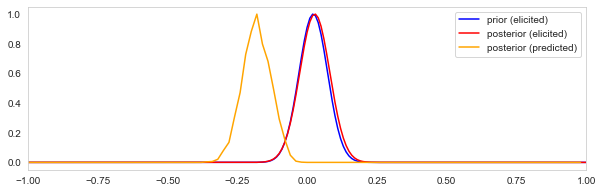

[-0.6991640948792655 0.16708481842609046]
[-0.9230741283408509 0.17826801909304052]
-0.9


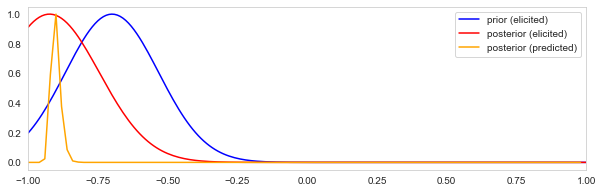

[-1.0 0.001]
[1.0 0.001]
-0.9


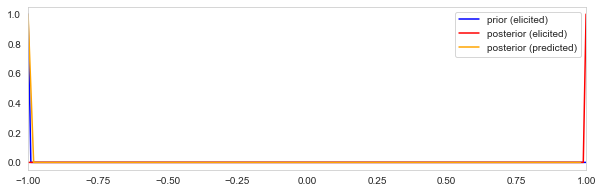

[0.8143387168809226 0.14915441495446846]
[-0.7393314565847953 0.10426537985479017]
-0.9


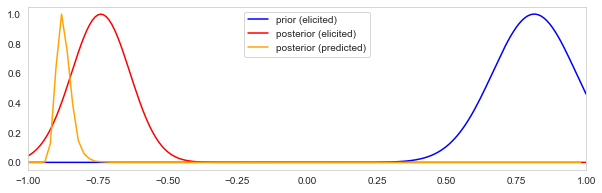

[-0.5489367432207937 0.20464439790142433]
[-0.6177551542511956 0.19112242287440218]
-0.9


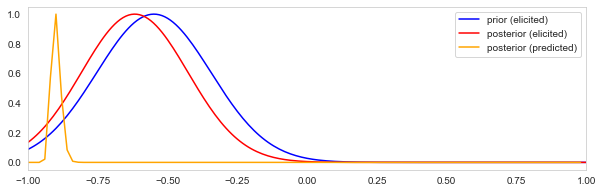

[1.0 0.5640510784803454]
[-0.9534338882867286 0.2338867736365066]
-0.9


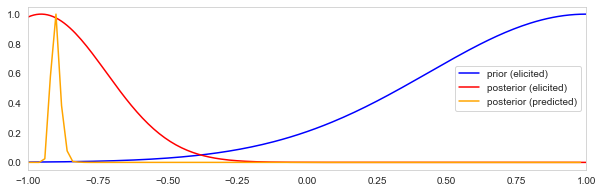

[-0.5858084381317971 0.10150679210741648]
[-0.8480743095531207 0.07762369603739094]
-0.9


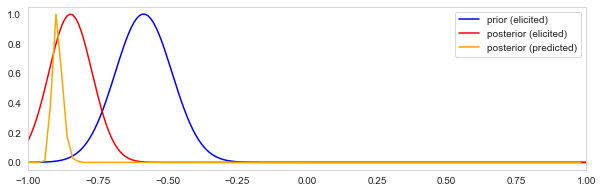

[0.9640345759300192 0.020891492445410498]
[1.0 0.001]
-0.9


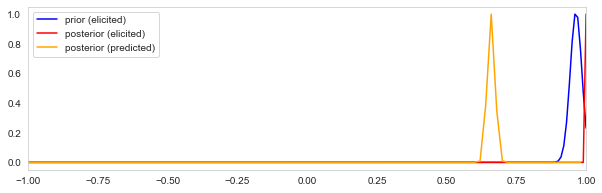

[-0.3992035308668418 0.10697531095592167]
[-0.35922646388075097 0.14716618132172465]
-0.9


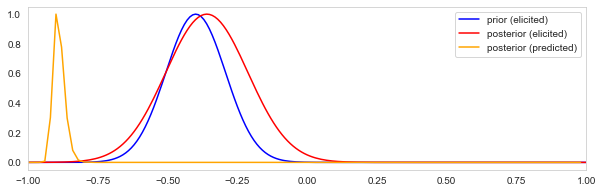

In [ ]:
for i, row in aggdf[aggdf.vars=='Vaccination rate_Rate of illness'].iterrows():

    normal_prior = row[['prior_mu', 'prior_sd']].values
    normal_post  = row[['post_mu', 'post_sd']].values
    print(normal_prior)
    print(normal_post)
    #print(np.round(normal_prior, 2))
    #print(np.round(normal_post, 2))
    print(row['pop_corr'])

    fig, ax = plt.subplots(figsize=(10,3))

    xs = np.arange(-1, 1.01, .01)

    prior = norm.pdf(xs, normal_prior[0], normal_prior[1])
    prior = prior/prior.max()

    post = norm.pdf(xs, normal_post[0], normal_post[1])
    post = post/post.max()


    ax.plot(xs, prior, color='blue', label='prior (elicited)')
    ax.plot(xs, post, color='red', label='posterior (elicited)')

    pred = predictions[(row['usertoken'], row['vars'])]['pred']
    
    hist = np.histogram(pred, bins=100, range=(-1, 1))
    ax.plot(hist[1][:-1], hist[0]/hist[0].max(), color='orange', label='posterior (predicted)')

    ax.set_xlim(-1, 1)
    #ax.hist(tr['r'])
    ax.legend()
    ax.grid(False)

    plt.show()

In [ ]:
?ax.hist